In [2]:
#import user modules
#--- MATPLOTLIB
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.markers import MarkerStyle
from matplotlib.gridspec import GridSpec
import matplotlib.colors as mcolors
import seaborn as sns
import pandas as pd
from mpl_toolkits.axes_grid1.inset_locator import inset_axes


import sys
my_path = "../../Python/"
if my_path not in sys.path:
    sys.path.append(my_path)
 
for place in sys.path: 
    print(place)

from tools import *
from fit_funcs import *
from entropy import *
import costfun.costfun as cost
import utils.figures as fig_help
from RandomMatrixTheory import goe
import utils.tools as tools

import importlib as imp
def reload_modules():
    imp.reload(cost)
    imp.reload(fig_help)

import itertools
matplotlib.rcParams['mathtext.fontset'] = 'stix'
matplotlib.rcParams['font.family'] = 'STIXGeneral'
latex_engine = 'xelatex'
latex_elements = {'preamble':r'\usepackage{physics}'}

%matplotlib inline
colors_ls = (list(mcolors.TABLEAU_COLORS)[:200])
colors_ls_cyc = itertools.cycle(colors_ls)

markers_ls = ['o','s','v', 'D', '<', 'X', '^', '*', '+']
markers = itertools.cycle(markers_ls)

linestyle_ls = ['-','--',':', '-.']
linestyle = itertools.cycle(linestyle_ls)

#--- NUMERICAL LIBS
import numpy as np
import itertools
import math
import random
from cmath import nan
import h5py   


# SCIPY LIBS
import scipy.stats as statistics
from scipy.special import binom
from scipy.special import erfinv
from scipy.special import digamma
from scipy.special import polygamma
from scipy.special import lambertw
from scipy.optimize import curve_fit as fit
from scipy.signal import savgol_filter
from scipy import integrate
from scipy import fft
from scipy.interpolate import UnivariateSpline as InterpolateSpline
from scipy.interpolate import make_interp_spline as make_spline
from scipy.interpolate import splrep, splev
 
# OTHER
import warnings
warnings.filterwarnings('ignore')
from joblib import Parallel, delayed
import copy
import os
from os import sep as kPSep
from os.path import exists


config_disorder = 0
scaled_disorder = 0

if config_disorder:
    base_dir = "../results_conf_dis/"
else:
    base_dir = "../results/"

print(base_dir[2:])
%config InlineBackend.print_figure_kwargs={'facecolor' : "w"}

/Users/rafal.swietek/Projects/CODES/QHamSolver/QuantumSun/Jupyter_Python
/Users/rafal.swietek/opt/anaconda3/lib/python39.zip
/Users/rafal.swietek/opt/anaconda3/lib/python3.9
/Users/rafal.swietek/opt/anaconda3/lib/python3.9/lib-dynload

/Users/rafal.swietek/opt/anaconda3/lib/python3.9/site-packages
/Users/rafal.swietek/opt/anaconda3/lib/python3.9/site-packages/aeosa
/Users/rafal.swietek/opt/anaconda3/lib/python3.9/site-packages/locket-0.2.1-py3.9.egg
/Users/rafal.swietek/opt/anaconda3/lib/python3.9/site-packages/IPython/extensions
/Users/rafal.swietek/.ipython
../../Python/
/results/


# QUANTUM SUN

$$\Large H=\gamma R+\sum_{j=1}^L J\alpha^{u_j}\hat{S}^x_{n_j}\hat{S}^x_j+h_j\hat{S}^z_j$$
$$\Large u_j\in[j-0.2,j+0.2]\qquad h_j\in[0.5,1.5]$$
$$\Large R-{\rm normalized}\quad {\rm GOE}\quad {\rm matrix}$$

## SAVER

In [3]:
L_total=15

J=3
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1
ini_ave=0
L = L_total - N

scaled_disorder = 0

alfa_vals = np.array( [*np.linspace(0.2, 0.45, 6), *np.linspace(0.65, 0.94, 30)] )
alfa_vals = np.linspace(0.65, 0.94, 30)
alfa_vals = np.linspace(0.80, 0.99, 20)
print(alfa_vals)

sizes = np.arange(8, 17, 1)

scales = np.array([10, 50, 100, 200, 500, 1000])
nu = 0.5
for J in [0.1]:
# for J in [0.1]:
    # alfa_vals = np.array( [*np.linspace(0.35, 0.6, 6), *np.linspace(0.65, 0.94, 30)] )
    # if J == 1 or J == 3:
    #     alfa_vals = np.linspace(0.65, 0.94, 30)
    # for nu in [500, 0.1, 0.25, 0.5, 1.0]:
    for nu in [500]:
    # for nu in [0.01, 0.02, 0.05]:
        frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

        folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
        folder = folder_base + base_dir[3:] + f"nu={nu}/"
        os.makedirs(folder_base, exist_ok=True)
        os.makedirs(folder, exist_ok=True)

        for L_total in sizes:
            sub_sizes = np.arange(0, L_total+1)
            L = L_total - N
            gamma=1
            name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)
            
            if J == 0.1: gamma=0.5
            
            entropy         = np.zeros((sub_sizes.size, alfa_vals.size));  entropy     .fill(np.nan)
            entropy_site    = np.zeros((sub_sizes.size, alfa_vals.size));  entropy_site.fill(np.nan)
            # entropy_diff         = np.zeros((sub_sizes.size, alfa_vals.size));  entropy_diff     .fill(np.nan)
            # entropy_site_diff    = np.zeros((sub_sizes.size, alfa_vals.size));  entropy_site_diff.fill(np.nan)
            gap_ratio       = np.zeros((alfa_vals.size));                  gap_ratio   .fill(np.nan)
            realisations    = np.zeros((alfa_vals.size));                  realisations.fill(np.nan)
            Sinfo_vN        = np.zeros((alfa_vals.size));                  Sinfo_vN.fill(np.nan)
            chi             = np.zeros((alfa_vals.size, scales.size-1));   chi.fill(np.nan)
            S_fluct         = np.zeros((sub_sizes.size, alfa_vals.size));  S_fluct.fill(np.nan)
            Ssite_fluct     = np.zeros((sub_sizes.size, alfa_vals.size));  Ssite_fluct.fill(np.nan)
            for ii, alfa in enumerate(alfa_vals):
                name = base_dir + 'Entropy/Eigenstate/' + info(L=L, N=N, J=J, gamma=gamma, zeta=zeta, alfa=alfa, h=h, w=w, ext='.hdf5', scaled_disorder=scaled_disorder)
                # if not exists(name): 
                #     name = base_dir + 'Entropy/Eigenstate/' + info(L=L, N=N, J=J, gamma=gamma, zeta=zeta, alfa=alfa, h=h, w=w, ext='_beta.hdf5', scaled_disorder=scaled_disorder)
                #print(name)
                exist_S_vn = 1
                if exists(name):
                    with h5py.File(name, "r") as file:
                            energies = np.array(file.get('mean energies'))
                            ratio = np.array(file.get('gap ratio'))
                            realis = np.array(file.get('realisations'))[0]
                            realisations[ii] = realis
                            if J != 1.0:
                                Sinfo = np.array(file.get('von Neumann participation entropy'))
                            
                            
                            dim = energies.size
                            num = frac(dim)
                            if nu > 1:
                                num = min([num, int(0.1*dim)])
                            # print(dim, num)
                            E_av = np.mean(energies)
                            index_meanE = min(range(len(energies)), key=lambda i: abs(energies[i] - E_av))
                            
                            my_min = int(index_meanE - num / 2)
                            if num == dim or my_min < 0: my_min = 0;  

                            my_max = int(index_meanE + num / 2)
                            if num == dim or my_max >= dim: my_max = dim-1

                            # try:
                                # if num == 500:          gap_ratio[ii] = np.array(file.get('gap ratio 500'))
                                # elif num == dim//2:     gap_ratio[ii] = np.array(file.get('gap ratio D/2'))
                                # else:
                                    # print("otherwise")
                            lvl_num =  np.array([0,1]) #np.array(file.get('level_number'))
                            lvl_num2 = np.array([0,1]) # np.array(file.get('level_number_squared'))
                            # print(lvl_num, lvl_num2)
                            chi[ii] = np.diff(lvl_num2 - lvl_num**2) / np.diff(lvl_num)
                            
                            if L_total > 16 or (2**(L_total) > 20000 and alfa < 0.65):
                                print(L_total, alfa, "Got")
                                _min = 10
                                _max = 490
                                gap_ratio[ii] = np.mean(ratio[_min : _max])
                                if L_total > 7 and J != 1.0:
                                    Sinfo_vN[ii] = np.mean(Sinfo[_min : _max])

                                for ii_LA in range(sub_sizes.size):
                                    S = np.array(file.get('entropies'))[ii_LA]
                                    S_fl = np.array(file.get('entropies diff'))[ii_LA]
                                    Ssite = np.array(file.get('single_site_entropy'))[ii_LA]
                                    Ssite_fl = np.array(file.get('single_site_entropy diff'))[ii_LA]
                                    entropy[ii_LA][ii]         = np.mean(S[_min : _max])
                                    S_fluct[ii_LA][ii]         = np.mean(S_fl[_min : _max])
                                    entropy_site[ii_LA][ii]    = np.mean(Ssite[_min : _max])
                                    Ssite_fluct[ii_LA][ii]     = np.mean(Ssite_fl[_min : _max])
                            else:
                                gap_ratio[ii] = np.mean(ratio[my_min : my_max]) if my_min > 0 and my_max < dim and num < dim else np.mean(ratio)
                                if L_total > 7 and J != 1.0:
                                    Sinfo_vN[ii] = np.mean(Sinfo[my_min : my_max]) if my_min > 0 and my_max < dim and num < dim else np.mean(Sinfo)

                                for ii_LA in range(sub_sizes.size):
                                    S = np.array(file.get('entropies'))[ii_LA]
                                    S_fl = np.array(file.get('entropies diff'))[ii_LA]
                                    Ssite = np.array(file.get('single_site_entropy'))[ii_LA]
                                    Ssite_fl = np.array(file.get('single_site_entropy diff'))[ii_LA]
                                    entropy[ii_LA][ii]         = np.mean(S[my_min : my_max]) if my_min > 0 and my_max < dim and num < dim else np.mean(S)
                                    S_fluct[ii_LA][ii]         = np.mean(S_fl[my_min : my_max]) if my_min > 0 and my_max < dim and num < dim else np.mean(S_fl)
                                    entropy_site[ii_LA][ii]    = np.mean(Ssite[my_min : my_max]) if my_min > 0 and my_max < dim and num < dim else np.mean(Ssite)
                                    Ssite_fluct[ii_LA][ii]     = np.mean(Ssite_fl[my_min : my_max]) if my_min > 0 and my_max < dim and num < dim else np.mean(Ssite_fl)
                                
                                # S = np.array(file.get('entropies diff'))[ii_LA]
                                # Ssite = np.array(file.get('single_site_entropy diff'))[ii_LA]
                                # entropy_diff[ii_LA][ii]         = np.mean(S[my_min : my_max]) if my_min > 0 and my_max < dim and num < dim else np.mean(S)
                                # entropy_site_diff[ii_LA][ii]    = np.mean(Ssite[my_min : my_max]) if my_min > 0 and my_max < dim and num < dim else np.mean(Ssite)
                            # except TypeError:
                            #     print(ratio)
                else:
                    print(name)

            if not np.all( np.isnan(realisations) ):
                print("SAVED:", name_out, np.min(realisations), np.max(realisations))
                # print(LA, entropy[LA])
                hf = h5py.File(name_out, 'w')
                hf.create_dataset('interaction',            alfa_vals.shape,        data = alfa_vals)
                hf.create_dataset('gap_ratio',              gap_ratio.shape,        data = gap_ratio)
                hf.create_dataset('entropy',                entropy.shape,          data = entropy)
                hf.create_dataset('single_site_entropy',    entropy_site.shape,     data = entropy_site)
                hf.create_dataset('entropy state2state',                S_fluct.shape,          data = S_fluct)
                hf.create_dataset('single_site_entropy state2state',    Ssite_fluct.shape,     data = Ssite_fluct)
                # hf.create_dataset('entropy diff',                entropy_diff.shape,          data = entropy_diff)
                # hf.create_dataset('single_site_entropy diff',    entropy_site_diff.shape,     data = entropy_site_diff)
                hf.create_dataset('realisations',           realisations.shape,     data = realisations)
                hf.create_dataset('vN info entropy',        Sinfo_vN.shape,         data = Sinfo_vN)
                chi = np.transpose(chi)
                hf.create_dataset('compressibility',        chi.shape,              data = chi)
                hf.close()

[0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92 0.93
 0.94 0.95 0.96 0.97 0.98 0.99]
SAVED: ./collected data/results/nu=500/_L=5,N=3,J=0.1,gamma=1,w=0.5.hdf5 4000.0 4000.0
SAVED: ./collected data/results/nu=500/_L=6,N=3,J=0.1,gamma=1,w=0.5.hdf5 4000.0 4000.0
SAVED: ./collected data/results/nu=500/_L=7,N=3,J=0.1,gamma=1,w=0.5.hdf5 4000.0 4000.0
SAVED: ./collected data/results/nu=500/_L=8,N=3,J=0.1,gamma=1,w=0.5.hdf5 4000.0 4000.0
SAVED: ./collected data/results/nu=500/_L=9,N=3,J=0.1,gamma=1,w=0.5.hdf5 4000.0 4000.0
SAVED: ./collected data/results/nu=500/_L=10,N=3,J=0.1,gamma=1,w=0.5.hdf5 2919.0 3924.0
SAVED: ./collected data/results/nu=500/_L=11,N=3,J=0.1,gamma=1,w=0.5.hdf5 834.0 1513.0
SAVED: ./collected data/results/nu=500/_L=12,N=3,J=0.1,gamma=1,w=0.5.hdf5 446.0 699.0
../results/Entropy/Eigenstate/_L=13,N=3,J=0.1,g=0.5,zeta=0.2,alfa=0.8,h=1,w=0.5.hdf5
../results/Entropy/Eigenstate/_L=13,N=3,J=0.1,g=0.5,zeta=0.2,alfa=0.81,h=1,w=0.5.hdf5
../results/Entropy/Eigenstate/

2.6214400000000027e-13

### OTHERS: check num of realis, concatanate results

In [16]:
a=np.array([[1,3,2,4,6,4],[-1,1,3,1,3,4],[4,1,7,7,4,3],[2,4,7,1,23,-2]])
print(a)
print(np.diff(a, axis=1).shape)
print(np.diff(a, axis=1))

print(30 * 12 * 20)

[[ 1  3  2  4  6  4]
 [-1  1  3  1  3  4]
 [ 4  1  7  7  4  3]
 [ 2  4  7  1 23 -2]]
(4, 5)
[[  2  -1   2   2  -2]
 [  2   2  -2   2   1]
 [ -3   6   0  -3  -1]
 [  2   3  -6  22 -25]]
7200


In [56]:
L_total=15

J=3
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

scaled_disorder = 0


for J in [0.1, 0.2, 0.3, 0.5, 1, 2, 3]:
    sizes = np.arange(8, 20, 1)

    interpolate = 0

    nu = 500
    frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

    folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
    folder = folder_base + base_dir[3:] + f"nu={nu}/"
    os.makedirs(folder_base, exist_ok=True)
    os.makedirs(folder, exist_ok=True)
    print("---------------------------")
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - 1
        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                realisations = np.array(file.get('realisations'))
                print(J, L, np.min(realisations), np.max(realisations))

for L in np.arange(10, 20):
    print(L, binom(L, L//2))

---------------------------
0.1 5 4000.0 4000.0
0.1 6 4000.0 4000.0
0.1 7 4000.0 4000.0
0.1 8 4000.0 4000.0
0.1 9 4000.0 4000.0
0.1 10 2879.0 3903.0
0.1 11 817.0 1496.0
---------------------------
0.2 5 1890.0 1900.0
0.2 6 1879.0 1900.0
0.2 7 1898.0 1900.0
0.2 8 1799.0 1800.0
0.2 9 1799.0 1800.0
0.2 10 1300.0 1700.0
0.2 11 631.0 1650.0
0.2 12 313.0 1357.0
---------------------------
0.3 5 1900.0 1900.0
0.3 6 1900.0 1900.0
0.3 7 1900.0 1900.0
0.3 8 1800.0 1800.0
0.3 9 1799.0 1800.0
0.3 10 1700.0 1700.0
0.3 11 1650.0 1650.0
0.3 12 1166.0 1358.0
---------------------------
0.5 5 5000.0 5000.0
0.5 6 5000.0 5000.0
0.5 7 10000.0 10000.0
0.5 8 6800.0 7200.0
0.5 9 6800.0 7200.0
0.5 10 3600.0 3800.0
0.5 11 3600.0 4000.0
0.5 12 1704.0 2077.0
0.5 13 502.0 544.0
0.5 14 1076.0 1198.0
0.5 15 655.0 776.0
0.5 16 187.0 211.0
---------------------------
1 5 5000.0 5000.0
1 6 5000.0 5000.0
1 7 5000.0 5000.0
1 8 4500.0 4500.0
1 9 4000.0 4175.0
1 10 2034.0 2190.0
1 11 1870.0 2061.0
1 12 1599.0 1751.0
1 13 

In [ ]:
L_total=16

J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

scaled_disorder = 0

alfa_vals = np.array( [*np.linspace(0.2, 0.6, 9), *np.linspace(0.65, 0.94, 30)] )
alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

dim = 2**L_total
for ii, alfa in enumerate(alfa_vals):
    name = base_dir + 'Entropy/Eigenstate/' + info(L=L, N=N, J=J, gamma=gamma, zeta=zeta, alfa=alfa, h=h, w=w, ext='.hdf5', scaled_disorder=scaled_disorder)
    counter = 0
    
    bins = np.zeros((22))
    E = np.zeros((dim))
    S = np.zeros((L + N + 1, dim))
    S_site = np.zeros((L + N + 1, dim))
    S_info = np.zeros((dim))

    ratio = np.zeros((dim-2))
    counter = 0

    gaps_dens = np.zeros((bins.size - 1))
    ener_dens = np.zeros((bins.size - 1))
    entropy_dens = np.zeros((L + N + 1, bins.size - 1))
    entropy_site_dens = np.zeros((L + N + 1, bins.size - 1))
        
    r1 = 0
    r2 = 0
    if exists(name):
        with h5py.File(name, "r") as file:
            bins = np.array(file.get('bins'))
            realis = np.array(file.get('realisations'))[0]
            counter += realis
            
            E += np.array(file.get('mean energies')) * realis
            ratio += np.array(file.get('gap ratio')) * realis
            S += np.array(file.get('entropies')) * realis
            S_site += np.array(file.get('single_site_entropy')) * realis
            S_info += np.array(file.get('von Neumann participation entropy')) * realis
            
            gaps_dens += np.array(file.get('gap ratio density')) * realis
            ener_dens += np.array(file.get('energy density')) * realis
            entropy_dens += np.array(file.get('entropy density')) * realis
            entropy_site_dens += np.array(file.get('entropy site density')) * realis
    else:
        print(name)

    name = '/Users/rafal.swietek/SCP/MAISTER_L=13_TO_MERGE/' + info(L=L, N=N, J=J, gamma=gamma, zeta=zeta, alfa=alfa, h=h, w=w, ext='.hdf5')

    if exists(name):
        with h5py.File(name, "r") as file:
            bins = np.array(file.get('bins'))
            realis = np.array(file.get('realisations'))[0]
            counter += realis
            
            E += np.array(file.get('mean energies')) * realis
            ratio += np.array(file.get('gap ratio')) * realis
            S += np.array(file.get('entropies')) * realis
            S_site += np.array(file.get('single_site_entropy')) * realis
            S_info += np.array(file.get('von Neumann participation entropy')) * realis
            
            gaps_dens += np.array(file.get('gap ratio density')) * realis
            ener_dens += np.array(file.get('energy density')) * realis
            entropy_dens += np.array(file.get('entropy density')) * realis
            entropy_site_dens += np.array(file.get('entropy site density')) * realis
    else:
        print(name)
    
    name = '/Users/rafal.swietek/SCP/' + info(L=L, N=N, J=J, gamma=gamma, zeta=zeta, alfa=alfa, h=h, w=w, ext='.hdf5')
    hf = h5py.File(name, 'w')
    hf.create_dataset('realisations',(1,), data = [counter])
    hf.create_dataset('mean energies',(dim,), data = E / counter)
    hf.create_dataset('von Neumann participation entropy',(dim,), data = S_info / counter)

    hf.create_dataset('entropies',(L + N + 1,dim), data = S / counter)
    hf.create_dataset('single_site_entropy',(L + N + 1,dim), data = S_site / counter)
    hf.create_dataset('gap ratio',(dim-2,), data = ratio / counter)
    hf.create_dataset('gap ratio 500',(1,), data = [r1 / counter])
    hf.create_dataset('gap ratio D/2',(1,), data = [r2 / counter])

    hf.create_dataset('gap ratio density',    gaps_dens.shape,          data = gaps_dens / counter)
    hf.create_dataset('energy density',       ener_dens.shape,          data = ener_dens / counter)
    hf.create_dataset('bins',                 bins.shape,               data = bins)
    hf.create_dataset('entropy density',      entropy_dens.shape,       data = entropy_dens / counter)
    hf.create_dataset('entropy site density', entropy_site_dens.shape,  data = entropy_site_dens / counter)

    hf.close()

## INITIAL TESTS, RAW DATA

### RAW DATA

[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]
./collected data/results/nu=500/_L=12,N=3,J=0.1,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=13,N=3,J=0.1,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=14,N=3,J=0.1,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=15,N=3,J=0.1,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=12,N=3,J=0.1,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=13,N=3,J=0.1,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=14,N=3,J=0.1,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=15,N=3,J=0.1,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=13,N=3,J=0.2,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=14,N=3,J=0.2,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=15,N=3,J=0.2,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=13,N=3,J=0.2,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=14,N=3,

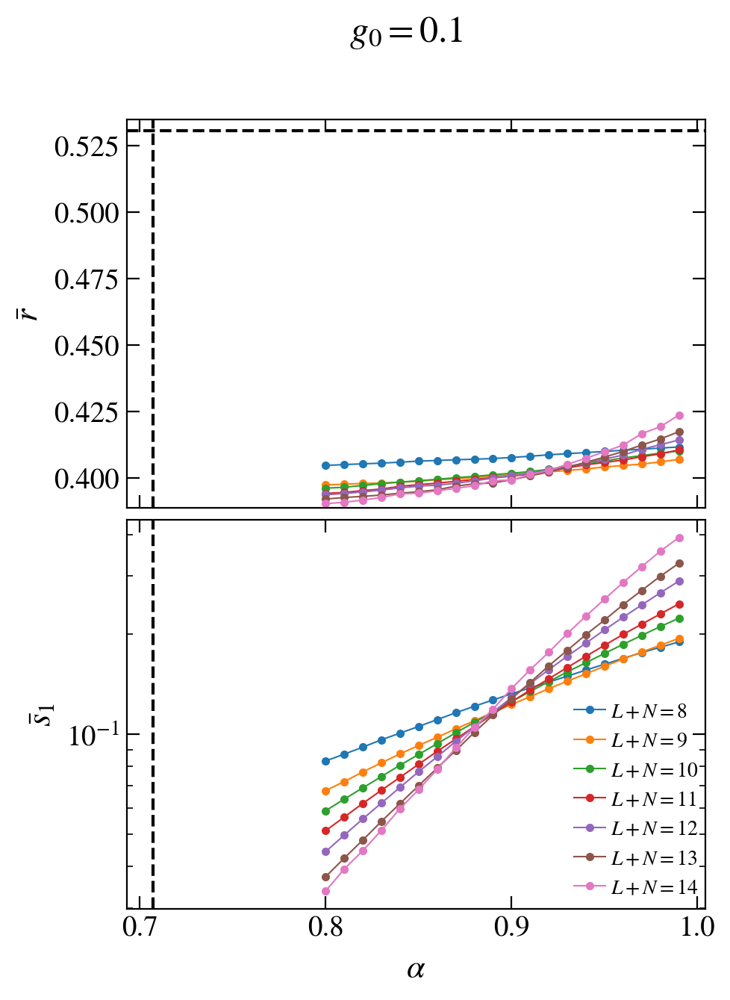

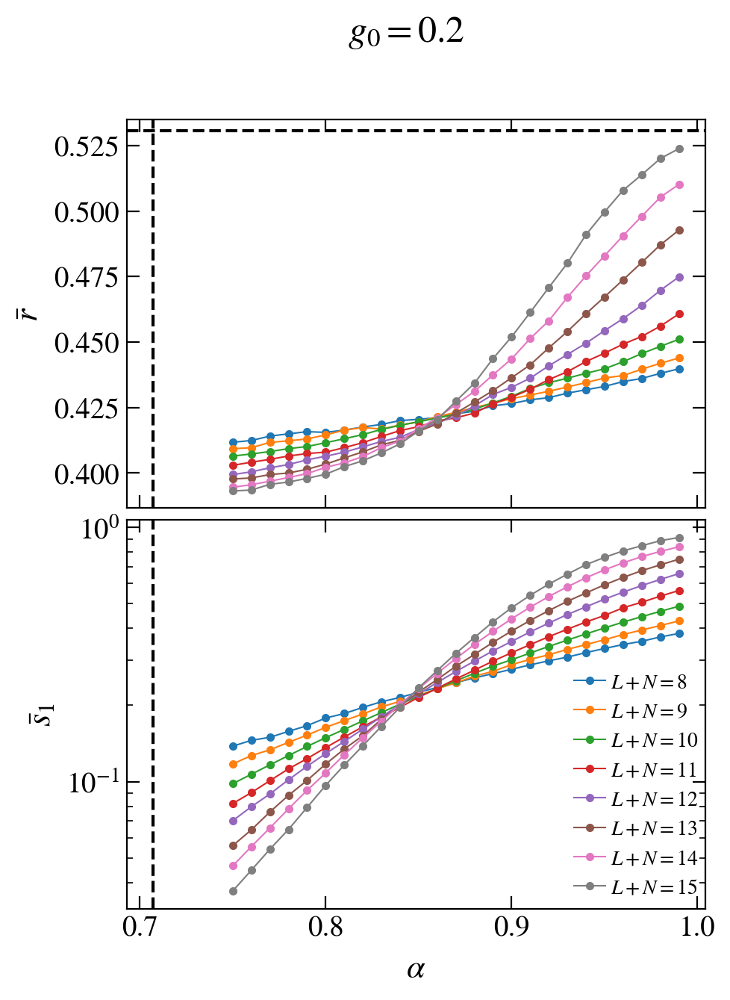

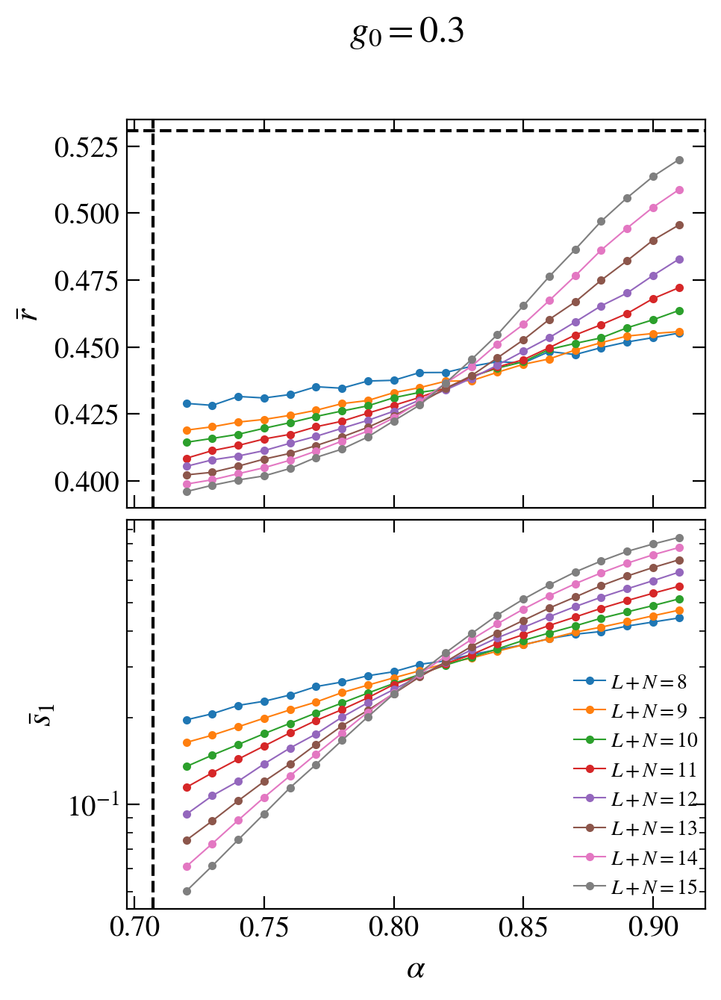

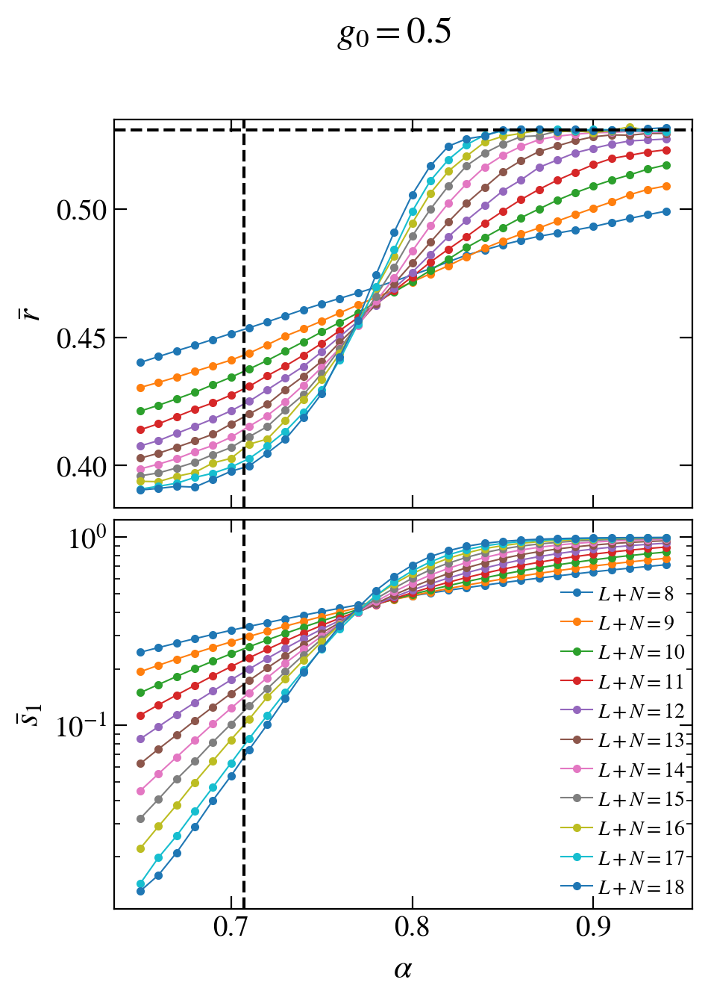

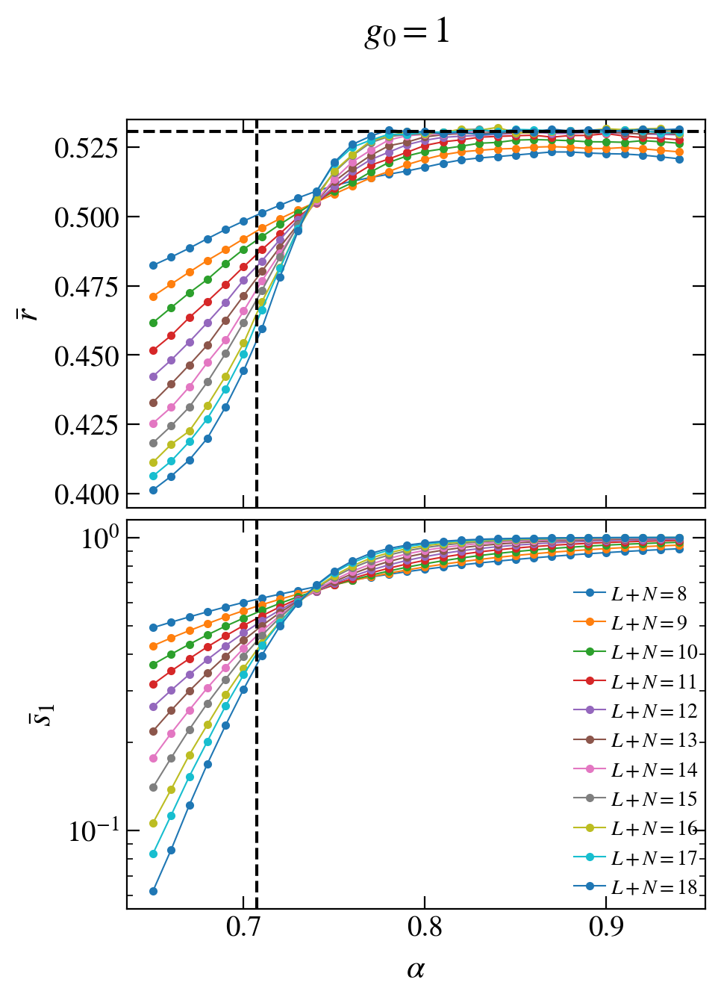

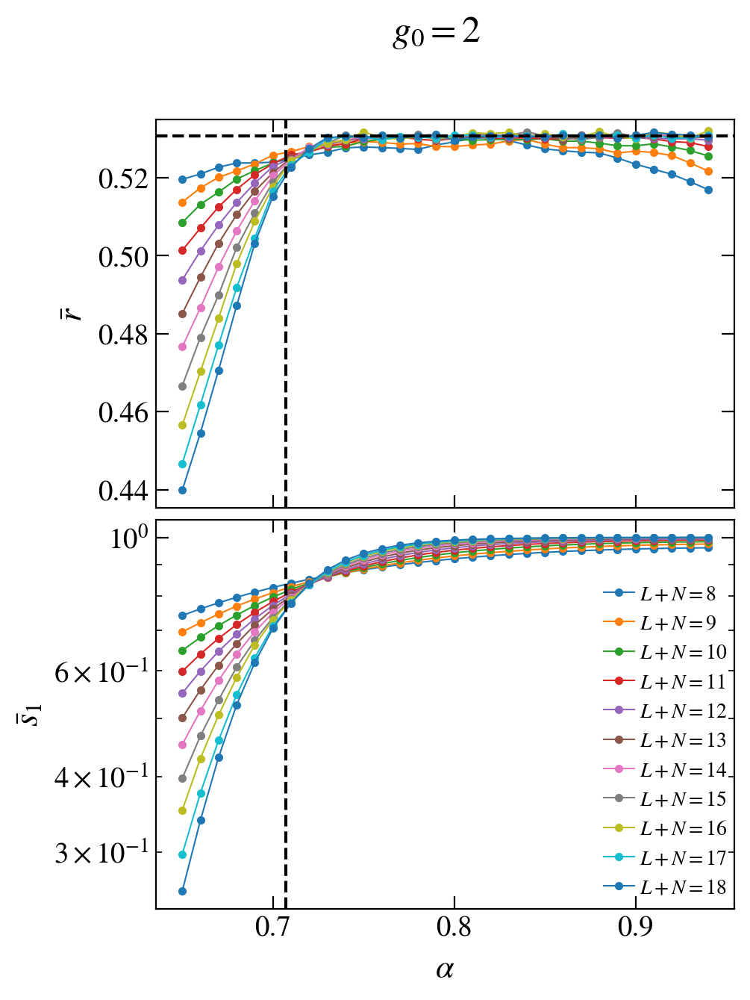

In [55]:
L_total=15

J=3
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

for J in [0.1, 0.2, 0.3, 0.5, 1, 2]:
# for J in [1]:
    sub_sizes = np.arange(0, L+1)
    fig, axis = plt.subplots( nrows=2, ncols=1, figsize=(5,7), dpi = 200, sharex=True)

    sizes = np.arange(8, 19, 1)

    interpolate = 0

    nu = 500
    frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

    folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
    folder = folder_base + base_dir[3:] + f"nu={nu}/"
    os.makedirs(folder_base, exist_ok=True)
    os.makedirs(folder, exist_ok=True)
        
    xlab = r"$\alpha$"
    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.77
    elif J == 1:    alfa_crit = 0.74
    elif J == 2:    alfa_crit = 0.72
    elif J == 3:    alfa_crit = 0.71
    else:           alfa_crit = 1/np.sqrt(2)

    for idx1 in range(2):
        
        interaction = []
        ydata = []
        found_sizes = []
        for L_total in sizes:
            sub_sizes = np.arange(0, L_total+1)
            L = L_total - N
            LA = L_total - 1
            name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

            if exists(name_out):
                found_sizes.append(L_total) 
                with h5py.File(name_out, "r") as file:
                    alfa_vals    = np.array(file.get('interaction'))
                    gap_ratio    = np.array(file.get('gap_ratio'))
                    entropy      = np.array(file.get('entropy'))
                    entropy_site = np.array(file.get('single_site_entropy'))
                S = entropy[LA] / page(LA, L_total-LA)
                # S = entropy[L_total - 3] + entropy_site[L_total - 4] - entropy[L_total - 4]
                # if interpolate:
                #     gap_ratio_spl = InterpolateSpline(alfa_vals, gap_ratio, k=5, s=0)
                #     entropy_spl =   InterpolateSpline(alfa_vals, S,         k=5, s=0)
                    
                #     bucket = 10
                #     alfa_vals = np.linspace(alfa_vals[0], alfa_vals[-1], 100)
                #     gap_ratio = tools.remove_fluctuations(gap_ratio_spl(alfa_vals), bucket_size=bucket)[bucket//2 : -bucket//2]
                #     S         = tools.remove_fluctuations(entropy_spl(alfa_vals),   bucket_size=bucket)[bucket//2 : -bucket//2]
                #     alfa_vals = alfa_vals[bucket//2 : -bucket//2]
                # print(S)
                interaction.append(alfa_vals)
                ydata.append(gap_ratio if idx1 == 0 else S) 
            else:
                print(name_out)
        
        found_sizes = np.array(found_sizes)
        # par, crit_pars, costfun, status = cost.get_crit_points(x=np.array(disorder), y=np.array(gaps), vals=sizes - N, crit_fun='free', scaling_ansatz='classic', seed=412438923)
        # print(crit_pars)
        
        # rescale_fun = cost.resc_functions_dict['classic']
        # critical_fun = cost.crit_functions_dict['free']
        # xlab = cost.scale_ansatz_label['classic']('W')

        for ii, L in enumerate(found_sizes - N):
            axis[idx1].plot(interaction[ii], ydata[ii], marker='o', markersize=3, lw=0.75, label=r"$L+N=%d$"%(L+N))
            # axis[idx1].plot(rescale_fun(disorder[ii], sizes, ii, critical_fun, par, *crit_pars), gaps[ii], ls='--', marker='o', label=r"$L=%d$"%(L))

        # axis[idx1].set_xlim(0.95*min(np.array(interaction).flatten()), 1.01*max(np.array(interaction).flatten()))
        axis[idx1].axvline(x=1/np.sqrt(2), ls='--', c='k')
        # axis[idx1].axvline(x=alfa_crit, ls=':', c='k')
    axis[0].set_ylim(None, 0.535)
    # axis[idx1].axhline(y=0.3863, ls='--', color='black')
    axis[0].axhline(y=0.5307, ls='--', color='black')


    fig_help.set_plot_elements(axis[0], ylabel=r"$\bar{r}$", xlabel=xlab, font_size=14, set_legend=False)
    fig_help.set_legend(axis[1], loc = 'lower right', fontsize=10)
    fig_help.set_plot_elements(axis[1], ylabel=r"$\bar{s}_{1}$", xlabel=xlab, font_size=14, set_legend=False, yscale='log')
    # fig_help.set_legend(axis[1], loc = 'center left', fontsize=12)

    if config_disorder:
        for ax in axis.flatten():
            ax.set_xscale('log')

    # for aa in [axis]:
    #     for ax in np.array(aa).flatten():
    #         ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    #         ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    #         ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    #         ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

    if J == 0.5:
        plt.savefig("plots_beta/FigS1.pdf", bbox_inches = 'tight', pad_inches=0.02)
        plt.savefig("plots_beta/FigS1.png", bbox_inches = 'tight', pad_inches=0.02)
    fig.suptitle(f"$g_0={J}$", fontsize=18)
    fig.subplots_adjust(wspace = 0.03, hspace=0.03)


In [71]:
print(np.linspace(1, 1.5, 6)**16)

[  1.           4.59497299  18.48842589  66.54166092 217.79533378
 656.84083557]


### INFORMATION ENTROPY AND FRACTAL DIMENSION

[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]


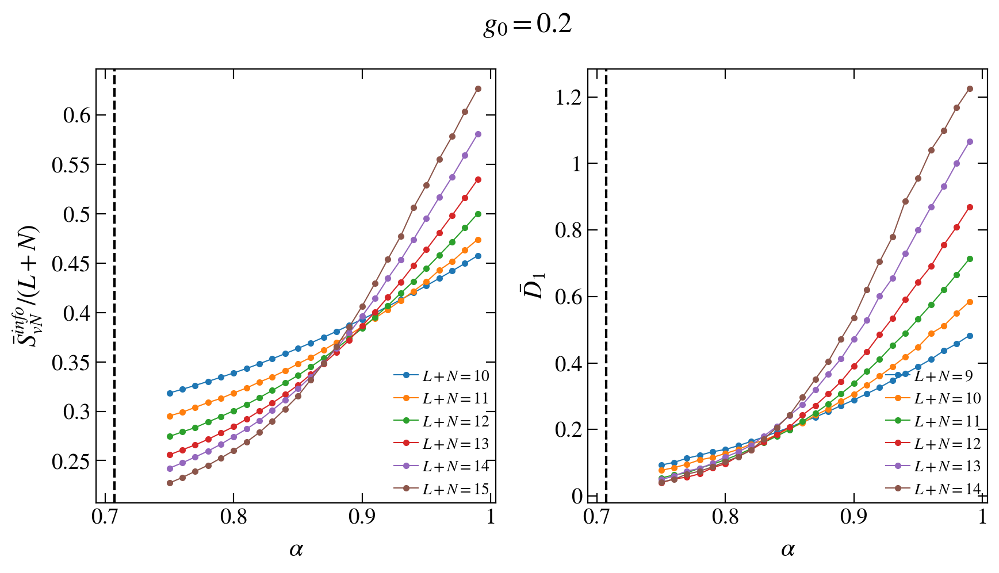

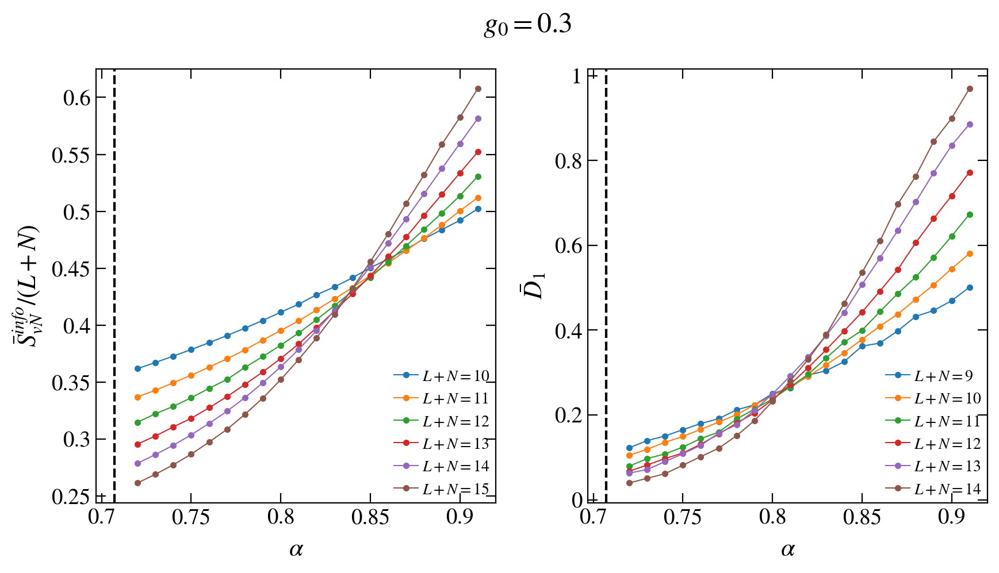

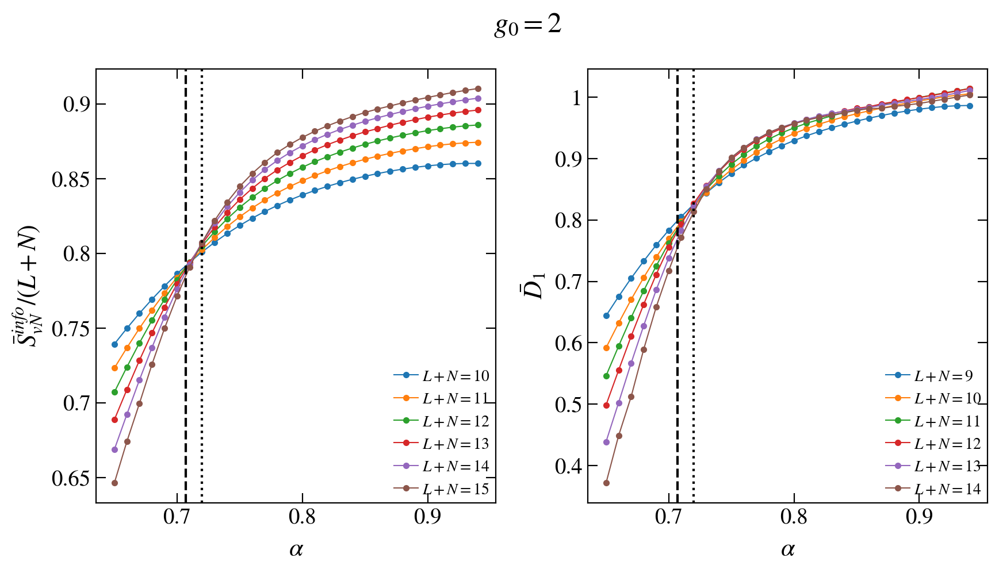

In [20]:
L_total=15

J=3
alfa=1.0
h=1.0
w=0.5
zeta=0.2
N=3
gamma=1.0
ini_ave=0
L = L_total - N

scaled_disorder = 0

interpolate=0

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

def pade_fun(x, c1, c2, d1, d2):#, c0, d0):
    return (x**2 + c1 * x + c2) / (x**2 + d1 * x + d2)

def other_fit(x, c1, c2, c3, c4):#, b): 
    return c1 / x**3 + c2 / x**2 + c3 / x + c4 # + a / x**4 + b / x**5
   
for J in [0.2, 0.3, 2]:
    sub_sizes = np.arange(0, L+1)
    fig, axis = plt.subplots( nrows=1, ncols=2, figsize=(10,5), dpi = 200, sharex=True)

    sizes = np.arange(8, 16, 1)

    nu = 500
    frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

    folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
    folder = folder_base + base_dir[3:] + f"nu={nu}/"
    os.makedirs(folder_base, exist_ok=True)
    os.makedirs(folder, exist_ok=True)
        
    xlab = r"$\alpha$"
    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.77
    elif J == 1:    alfa_crit = 0.74
    elif J == 2:    alfa_crit = 0.72
    elif J == 3:    alfa_crit = 0.71
    else:           alfa_crit = 1/np.sqrt(2)
    
    interaction = []
    Sinfo = []
    found_sizes = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - 1
        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            found_sizes.append(L_total) 
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                Sinfo_vN = np.array(file.get('vN info entropy'))
                
            interaction.append(alfa_vals)
            Sinfo.append(Sinfo_vN)
        else:
            print(name_out)

    for ii, L in enumerate(sizes - N):
        if L+N >= 10:
            axis[0].plot(interaction[ii], Sinfo[ii] / (L+N) / np.log(2), marker='o', markersize=3, lw=0.75, label=r"$L+N=%d$"%(L+N))
        # axis[idx1].plot(rescale_fun(disorder[ii], sizes, ii, critical_fun, par, *crit_pars), gaps[ii], ls='--', marker='o', label=r"$L=%d$"%(L))

    Sinfo = np.transpose(Sinfo)
    if interpolate:
        my_fit = pade_fun if alfa > alfa_crit else other_fit

        dense_sizes = np.linspace(sizes[0], sizes[-1], 100)
        D1 = np.zeros((alfa_vals.size, dense_sizes.size))
        xx = dense_sizes
        # print("aaa")
        for ii_a, alfa in enumerate(alfa_vals):
            pars, pconv = fit(my_fit,
                            xdata = sizes,
                            ydata = Sinfo[ii_a], maxfev=10000)
            smooth_data = my_fit(dense_sizes, *pars)
            D1[ii_a] = np.gradient( (smooth_data), dense_sizes[1] - dense_sizes[0] ) / np.log(2)
        
        D1 = np.transpose(D1)
        for ii_L, L in enumerate(sizes):
            ii = np.abs(dense_sizes - L).argmin()
            # print(L, dense_sizes[ii])
            axis[1].plot(interaction[ii_L], D1[ii], marker='o', markersize=3, lw=0.75, label=r"$L+N=%d$"%(L))

    else:
        D1 = np.zeros((alfa_vals.size, sizes.size - 2))
        for ii_a, alfa in enumerate(alfa_vals):
            D1_tmp = np.diff(Sinfo[ii_a]) / np.log(2)
            D1[ii_a] = (D1_tmp[1:] + D1_tmp[:-1])/2.
        D1 = np.transpose(D1)
        for ii, L in enumerate(sizes[1:-1] - N):
            axis[1].plot(interaction[ii], D1[ii], marker='o', markersize=3, lw=0.75, label=r"$L+N=%d$"%(L+N))

    axis[0].axvline(x=1/np.sqrt(2), ls='--', c='k')
    axis[0].axvline(x=alfa_crit, ls=':', c='k')
    axis[1].axvline(x=1/np.sqrt(2), ls='--', c='k')
    axis[1].axvline(x=alfa_crit, ls=':', c='k')


    fig_help.set_plot_elements(axis[1], ylabel=r"$\bar{D}_1$", xlabel=xlab, font_size=14, set_legend=False)
    fig_help.set_legend(axis[1], loc = 'lower right', fontsize=10)
    fig_help.set_plot_elements(axis[0], ylabel=r"$\bar{S}^{info}_{vN}/(L+N)$", xlabel=xlab, font_size=14, set_legend=False)
    fig_help.set_legend(axis[0], loc = 'lower right', fontsize=10)

    if config_disorder:
        for ax in axis.flatten():
            ax.set_xscale('log')

    for aa in [axis]:
        for ax in np.array(aa).flatten():
            ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
            ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
            ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
            ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

    fig.suptitle(f"$g_0={J}$", fontsize=18)
    fig.subplots_adjust(wspace = 0.23, hspace=0.23)


## ERGODIC FIXED POINT

IndexError: index 11 is out of bounds for axis 0 with size 11

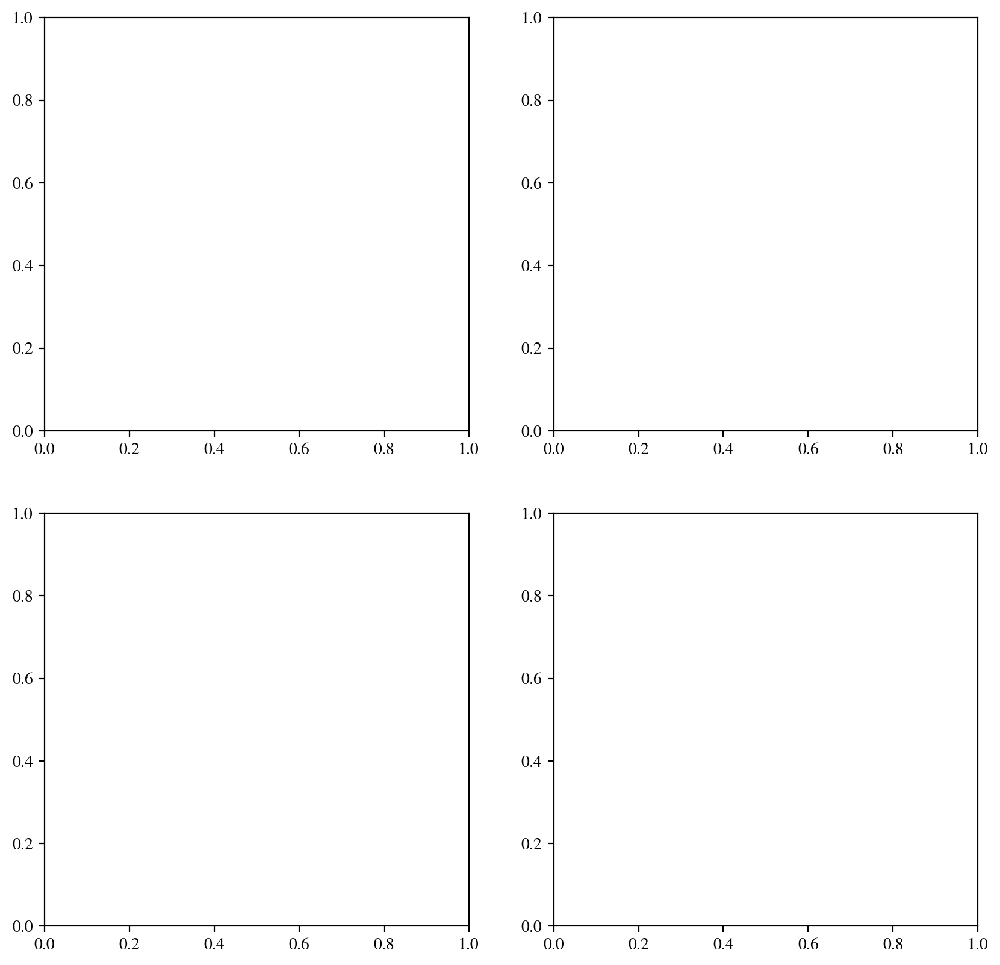

In [92]:
L_total=15

J=2


alfa=1
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

alfa_crit = 0.75
if J == 0.5:    alfa_crit = 0.77
elif J == 1:    alfa_crit = 0.73
elif J == 2:    alfa_crit = 0.72
elif J == 3:    alfa_crit = 0.71
else:           alfa_crit = 1/np.sqrt(2)
sub_sizes = np.arange(0, L+1)

fig, axes = plt.subplots( nrows=2, ncols=2, figsize=(10,10), dpi = 200)
# fig, ax = plt.subplots( nrows=1, ncols=1, figsize=(5,5), dpi = 200)

axis = axes.flatten()

sizes = np.arange(6, 17, 1)

interpolate = 0

alfa_min = 0.72
p = -1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
xlab = r"$L+N$"

def pade_fun(x, c1, c2, c3, d1, d2, d3):
    # return c1 * np.arctan(c2 * x - d1)
    # return (x**3 + c1*x**2 + c2*x + c3) / (x**3 + d1*x**2 + d2 * x + d3)
    return (x**2 + c1 * x + c2) / (x**2 + d1 * x + d2)

def other_fit(x, c1, c2, c3, c4, c5, c6):
    return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4
    # return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4 + c5/x**4 + c6 / x**5

for idx1, J in enumerate([0.5, 1, 2]):
    interaction = []
    ydata = []
    
    alfa_crit = 0.75
    s1_crit = 1
    if J == 0.5:    alfa_crit = 0.77071119; s1_crit = 0.3975596423927653; sizes = np.arange(10, 20, 1 if p > 0 else 2)
    elif J == 1:    alfa_crit = 0.73503829; s1_crit = 0.5976612536491842; sizes = np.arange(10, 19, 1 if p > 0 else 2)
    elif J == 2:    alfa_crit = 0.72054518; s1_crit = 0.8326330851556897; sizes = np.arange(10, 18, 1 if p > 0 else 2)
    elif J == 3:    alfa_crit = 0.71795404; s1_crit = 0.9073984827790079; sizes = np.arange(10, 17, 1 if p > 0 else 2)
    else:           alfa_crit = 1/np.sqrt(2)
    
    for L_total in sizes:
        L = L_total - N
        LA = L_total - p

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
                Sinfo_vN     = np.array(file.get('vN info entropy'))
        else:
            print(name_out)
        alfa_vals_original = alfa_vals
        # print(L_total, entropy.shape)
        entropy = entropy[LA] / ( p*np.log(2) )#page(LA, L_total-LA)
        interaction.append(alfa_vals)
        # ydata.append(entropy)
        ydata.append((gap_ratio - 0.3863) / (0.5307 - 0.3863))
        

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    if J < 3:
        norm = matplotlib.colors.Normalize(
            vmin=alfa_min if alfa_min > 0.0 else np.min(alfa_vals),
            vmax=np.max(alfa_vals))

    # choose a colormap
    # c_m = matplotlib.cm.cool

    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )
    # print(ydata.shape)
    beta_0 = np.zeros( (alfa_vals.size) )
    new_xx = np.zeros( (alfa_vals.size) )
    
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa < alfa_min: continue

        xx = sizes
        yy = ydata[ii_a]
        axis[idx1].scatter(xx, yy, marker='o', s=15, color=s_m.to_rgba(alfa))
        if interpolate:
            # axis[idx1].scatter(sizes, ydata[ii_a], marker='o', s=10, color=s_m.to_rgba(alfa))
            spl = make_spline(xx, yy)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = spl(xx)
            axis[idx1].scatter(xx, yy, marker='s', s=5, color=s_m.to_rgba(alfa))
        
        my_fit = pade_fun if alfa > alfa_crit else other_fit
        try:
            # xx = xx - N
            pars, pconv, fit_info, msg, _ = fit(my_fit,
                            xdata = xx,
                            ydata = yy,
                            full_output=True)
            print(J, alfa, fit_info['fvec'])
            dense_sizes = np.linspace(xx[0], xx[-1], 10000)
            axis[idx1].plot(dense_sizes, my_fit(dense_sizes, *pars), lw=1.5, color=s_m.to_rgba(alfa), ls = '--' if alfa == alfa_crit else '-')
        except RuntimeError:
            print(alfa)
        
# axis[0].axhline(y=0.3863, ls='--', color='black')
# axis[0].axhline(y=0.5307, ls='--', color='black')
    
    # axis[idx1].set_xlim(7.5, 16.5)

    # axis[idx1].set_ylim(0.0, 1.0)
    fig_help.set_plot_elements(axis[idx1], ylabel=r"$\bar{s}_{%d}$"%p, xlabel=xlab, font_size=14, set_legend=False, xscale='linear', yscale='linear')

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

# for aa in [axis]:
#     for ax in np.array(aa).flatten():
#         ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[3].annotate(r"(d) $g_0=3.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')

fig.subplots_adjust(wspace = 0.2, hspace=0.2)

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94 0.95 0.96 0.97 0.98 0.99 1.  ]


No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


./collected data/results/nu=500/_L=5,N=3,J=3,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=7,N=3,J=3,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=9,N=3,J=3,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=11,N=3,J=3,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=13,N=3,J=3,gamma=1,w=0.5.hdf5
./collected data/results/nu=500/_L=15,N=3,J=3,gamma=1,w=0.5.hdf5


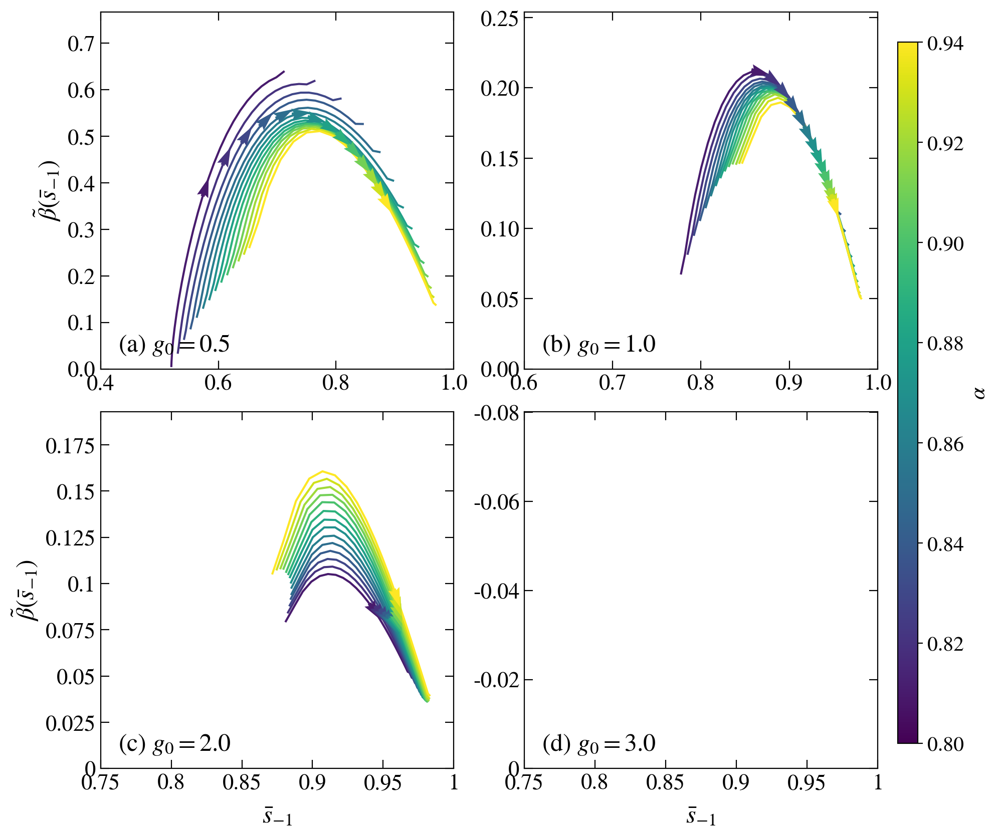

In [89]:
L_total=15
J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

alfa_vals = np.linspace(0.65, 1.0, 36)
print(alfa_vals)

sub_sizes = np.arange(0, L+1)
fig, axis = plt.subplots( nrows=2, ncols=2, figsize=(10,10), dpi = 200)
axis = np.array(axis).flatten()


interpolate = 1
use_fit = 1
bin_size = 5
use_area_collapse = 1

def beta_low_sp(x, a = 0.0, b = 1, alfa = 1.0):
    if use_area_collapse: return alfa * (x - a) / x * np.log( (x - a) / b )
    else:                 return (b - x) / x


def beta0_fun(x, o1 = 0.0, p = 1, c_ = 1):
    # c_ = 2**(2*p) / (2 * p * np.log(2))
    g_ = 1# + o1 / (p * np.log(2))
    if use_area_collapse: 
        # return 5*(g_ - x) / x
        return -(g_ - x) / x * np.log( (g_ - x) / c_ )
    else:                 return (g_ - x) / x 


alfa_min = 0.8
p = -1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
ylab = r"$\beta(X)$"

norm = None
for idx1, J in enumerate([0.5, 1, 2, 3]):
    
    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.77
    elif J == 1:    alfa_crit = 0.74
    elif J == 2:    alfa_crit = 0.72
    elif J == 3:    alfa_crit = 0.72
    else:           alfa_crit = 1/np.sqrt(2)
    
    sizes = np.arange(8, 19, 1 if p > 0 else 2)

    interaction = []
    ydata = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - p if p > 0 else L_total//2
        # LA = N+1

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
        else:
            print(name_out)
        
        S = entropy[LA] / (p*np.log(2)) if p > 0 else entropy[LA] / page(LA, L_total-LA)
        # S = entropy_site[LA] / page(1, L_total-1)
        interaction.append(alfa_vals)
        ydata.append(S)
        # ydata.append((gap_ratio - 0.3863) / (0.5307 - 0.3863))

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    if J < 3:
        norm = matplotlib.colors.Normalize(
            vmin=alfa_min,
            vmax=np.max(alfa_vals))


    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )
    # print(ydata)
    idx_c = 0

    envelope_ydata = []
    envelope_xdata = []
    yax_max = -10
    yax_min = 10
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa < alfa_min: continue
        if alfa == alfa_crit: idx_c = ii_a
        # col = 'red' if alfa==alfa_crit else s_m.to_rgba(alfa)
        col = s_m.to_rgba(alfa)
        
        xx = sizes - N
        yy = ydata[ii_a]
        if interpolate:
            # axis[idx1].scatter(sizes, ydata[ii_a], marker='o', s=10, color=s_m.to_rgba(alfa))
            spl = make_spline(xx, yy)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = spl(xx)
        
        # if alfa > alfa_min - 1e-3:
        #     pars, pconv = fit(power_law,
        #                     xdata = 2**xx[-4:],
        #                     ydata = 1 - yy[-4:],
        #                     )
        #     eta = -pars[0]
        #     c = pars[1]
        #     sp = np.linspace(0.6, 1, 1000)
        #     print(J, alfa, c)
        #     if use_area_collapse:   axis[idx1].plot(sp, beta0_fun(sp, o1=0, p=p, c_=c), lw=0.9, color=col, ls='-.')
        #     else:                   axis[idx1].plot(sp, eta * beta0_fun(sp, o1=0, p=p, c_=c),    lw=0.9, color=col, ls='-.')

        if not use_fit:
            if use_area_collapse: xx = np.log(xx)
            xx_beta = np.zeros( (xx.size - 1) )
            beta = np.zeros( (xx.size - 1) )
            for ii in range(xx.size - 1):
                xx_beta[ii] = yy[ii+1]
                beta[ii] = ( np.log(yy[ii+1]) - np.log(yy[ii])) / ( xx[ii+1] - xx[ii]) / (1.0 if use_area_collapse else np.log(2))
                envelope_ydata.append(beta[ii])
                envelope_xdata.append(xx_beta[ii])
            # envelope_ydata.append(beta[-1])
            # envelope_xdata.append(xx[-1])
            
            axis[idx1].plot(xx_beta, beta, marker='o', markersize=2, lw=1.5, color=col)
            if min(beta) < yax_min: yax_min = min(beta)
            if max(beta) > yax_max: yax_max = max(beta)
            i1 = xx.size // 2
            u = xx_beta[i1+1] - xx_beta[i1]
            v = beta[i1+1] - beta[i1]
            pos_x = xx_beta[i1] + u/2
            pos_y = beta[i1] + v/2
            arr_norm = np.sqrt(u**2+v**2)

            axis[idx1].quiver(pos_x, pos_y, u/arr_norm, v/arr_norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
        else:

            my_fit = pade_fun if alfa > alfa_crit else other_fit
            # print(alfa, xx, yy)
            pars, pconv = fit(my_fit,
                                xdata = xx,
                                ydata = yy, maxfev=10000)
            dense_sizes = np.linspace(xx[0], xx[-1], 25)
            smooth_data = my_fit(dense_sizes, *pars)
            # spl = make_spline(xx, yy, k=3)
            # xx = np.linspace(xx[0], 2*xx[-1], 100)
            # smooth_data = spl(xx)
            # if use_area_collapse: 
            # dense_sizes = np.log(dense_sizes)
            
            deriv = np.gradient( np.log(smooth_data), dense_sizes[1] - dense_sizes[0] ) / (1.0 / dense_sizes if use_area_collapse else np.log(2))
            # print(smooth_data)
            axis[idx1].plot(smooth_data, deriv, lw=1.5, color=col)
            
            if min(deriv) < yax_min: yax_min = min(deriv)
            if max(deriv) > yax_max: yax_max = max(deriv)
            # spline = InterpolateSpline(sizes, ydata[ii_a], k=5, s=0)
            # spl_deriv = spline.derivative(n=1)
            # aaaa = np.linspace(sizes[0], sizes[-1], 100)
            # smooth_data = spline(aaaa)
            # deriv = spl_deriv(aaaa)
            
            envelope_ydata = [*envelope_ydata, *deriv]
            envelope_xdata = [*envelope_xdata, *smooth_data[smooth_data > 0]]
            # envelope_ydata = [*envelope_ydata, deriv[-1]]
            # envelope_xdata = [*envelope_xdata, smooth_data[-1]]

            i1 = smooth_data.size // 2
            u = smooth_data[i1+1] - smooth_data[i1]
            v = deriv[i1+1] - deriv[i1]
            pos_x = smooth_data[i1] + u/2
            pos_y = deriv[i1] + v/2
            arr_norm = np.sqrt(u**2+v**2)
        
            axis[idx1].quiver(pos_x, pos_y, u/arr_norm, v/arr_norm, angles="xy", zorder=5, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
            
    # sorting X and Y data according to increasing X
    permut = np.argsort( np.array(envelope_xdata) )
    envelope_ydata = np.array(envelope_ydata)[permut]
    envelope_xdata = np.array(envelope_xdata)[permut]

    size = len(envelope_xdata)
    envelope = np.zeros( (size // bin_size) )
    sp_binned = np.zeros( (size // bin_size) )

    # Finding maximum Y in each bin of 20 points of interpolated data
    for k in range(envelope.size):
        idx_r = (k+1) * bin_size if k < envelope.size-1 else -1
        idx = np.argmax(envelope_ydata[k * bin_size : idx_r])
        envelope[k]  = envelope_ydata[k * bin_size : idx_r][idx]
        sp_binned[k] = envelope_xdata[k * bin_size : idx_r][idx]
    # xxx = envelope_xdata
    # envelope = envelope_ydata
    # axis[idx1].plot(xxx, envelope, lw=2, color='k', ls='--')
    # print(envelope)
    def envelope_polynomial(x, c1, c2, c3, c4, c5, c6, c7):#, c8):#, c9):#, c10):
        return c1 * (x-1) + c2 * (x-1)**2 + c3 * (x-1)**4 + c4 * (x-1)**4 + c5 * (x-1)**5 + c6 * (x-1)**6 + c7 * (x-1)**7# + c8 * (x-1)**8# + c9 * (x-1)**9# + c10 * (x-1)**10
    pars, pconv = fit(envelope_polynomial,
                        xdata = sp_binned,
                        ydata = envelope)
    
    sp = np.linspace(min(ydata.flatten()), 1, 10000)
    envelope_fitted = envelope_polynomial(sp, *pars)

    Sc_idx = np.argwhere(np.abs(envelope_fitted) < 1e-2)[0][0]
    Sc = sp[Sc_idx]
    # print(Sc_idx)
    # print(Sc_idx, sp[Sc_idx])
    # def linearize_at_transition(x, a, Sc):
    #     return a * (x - Sc)
    # # print(Sc_idx, envelope[Sc_idx - 20 : Sc_idx + 20])
    # pars, pconv = fit(linearize_at_transition,
    #                     xdata = sp[Sc_idx - 100 : Sc_idx + 100],
    #                     ydata = envelope_fitted[Sc_idx - 100 : Sc_idx + 100])
    # nu_exp = 1./ (pars[0] * pars[1])
    # Sc = pars[1]
    # print(*pars, "------", nu_exp, Sc)
    # def low_sp_fit(x, a, b):
    #     if use_area_collapse: return a * np.log(x / b)
    #     else:                 return -a * np.log(x / b)**(1-1/a)
    
    # pars, pconv = fit(low_sp_fit,
    #                     xdata = sp_binned[envelope < 0.25 * min(envelope)],
    #                     ydata = envelope[envelope  < 0.25 * min(envelope)],
    #                     maxfev =10000)
    
    # print("Parameters form log fit:", *pars)
    # low_sp = np.linspace(0.9*np.min(envelope_xdata), max(sp_binned[envelope < 0]), 1000)
    # axis[idx1].plot(sp, low_sp_fit(sp, *pars), lw=2, color='red', ls='--', label=r"$%.2f\ln{\frac{\bar{s}_p}{%.2f}}$"%(pars[0], pars[1]))
    # axis[idx1].plot(sp, pars[0] * np.log(sp / Sc), lw=2, color='red', ls=':', label=r"$%.2f\ln{\frac{\bar{s}_p}{s_p^c}}$"%pars[0])
    # axis[idx1].plot(sp, beta_low_sp(sp, 0, 0.75, 2), lw=2, color='red', ls=':', label=r"$\tilde{\beta}(\bar{s}_p\rightarrow0)$")
    # axis[idx1].plot(sp, beta_low_sp(sp, 0.1, 2), lw=2, color='red', ls=':', label=r"$\tilde{\beta}(\bar{s}_p\rightarrow0)$")

    
    
    if idx1 == 0: axis[idx1].set_xlim(0.4, 1.0)
    if idx1 == 1: axis[idx1].set_xlim(0.6, 1.0)
    if idx1 == 2: axis[idx1].set_xlim(0.75, 1.0)
    if idx1 == 3: axis[idx1].set_xlim(0.75, 1.0)
    # axis[idx1].set_xlim(0.4, 1.0)
    axis[idx1].set_ylim(-0., 1.2*yax_max)
    
    axis[idx1].axhline(y=0, ls='-', c='k', lw=1)
    xlab = r"$\bar{s}_{%d}$"%p
    ylab = r"$\tilde{\beta}($" + xlab + "$)$" if use_area_collapse else r"${\beta}($" + xlab + "$)$"
    fig_help.set_plot_elements(axis[idx1], xlabel=xlab if idx1 > 1 else "", ylabel=ylab if idx1 % 2 == 0 else "", font_size=16, set_legend=True, xscale='linear')
    fig_help.set_legend(axis[idx1], loc = 'center left', fontsize=16, anchor=(0, 0.65))
    
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

for aa in [axis[2:]]:
    for ax in np.array(aa).flatten():
        ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[3].annotate(r"(d) $g_0=3.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
# axis[3].annotate(r"(d) $J=3.0$", fontsize=16, xy=(0.65, 0.08), xycoords='axes fraction')
# axis[0].set_title(r"$N=3, \gamma=%.1f$"%(gamma), fontsize=16)
# axis[1].set_title(r"$N=5, \gamma=%.1f$"%(gamma), fontsize=16)

fig.subplots_adjust(wspace = 0.2, hspace=0.12)
# fig.savefig("plots_beta/FigS3_area.pdf" if use_area_collapse else "plots_beta/FigS3.pdf", bbox_inches = 'tight', pad_inches=0.02)
# fig.savefig("plots_beta/FigS3_area.png" if use_area_collapse else "plots_beta/FigS3.pdf", bbox_inches = 'tight', pad_inches=0.02)

In [5]:
72*3*50

10800

## CRITICAL REGION

0.5 0.65 [-6.98968216e-05  4.97796870e-04 -1.08174993e-03  7.03642944e-04
  2.31741528e-04 -2.81534612e-04]
0.5 0.66 [-6.92486305e-05  4.93538273e-04 -1.07419498e-03  7.03025778e-04
  2.23705213e-04 -2.76825651e-04]
0.5 0.67 [-8.41125405e-05  5.86024509e-04 -1.21180268e-03  6.32492406e-04
  4.92082163e-04 -4.14683854e-04]
0.5 0.68 [-5.86887091e-05  4.25326134e-04 -9.59120426e-04  7.11919267e-04
  7.40376218e-05 -1.93473889e-04]
0.5 0.6900000000000001 [-4.04934055e-05  3.06078486e-04 -7.48962442e-04  6.98891117e-04
 -1.55583962e-04 -5.99297974e-05]
0.5 0.7 [ 6.88216822e-07  5.40607466e-05 -3.96892600e-04  9.63814707e-04
 -9.68305638e-04  3.46634568e-04]
0.5 0.71 [ 5.34859372e-05 -2.63871354e-04  1.87367684e-05  1.38861370e-03
 -2.09500407e-03  8.98039017e-04]
0.5 0.72 [ 0.00012056 -0.00066453  0.0005245   0.00198115 -0.00357891  0.00161723]
0.5 0.73 [ 8.34626109e-05 -4.81182858e-04  5.09074921e-04  1.02394590e-03
 -2.13180319e-03  9.96502617e-04]
0.5 0.74 [ 7.65900092e-05 -4.30355782e-0

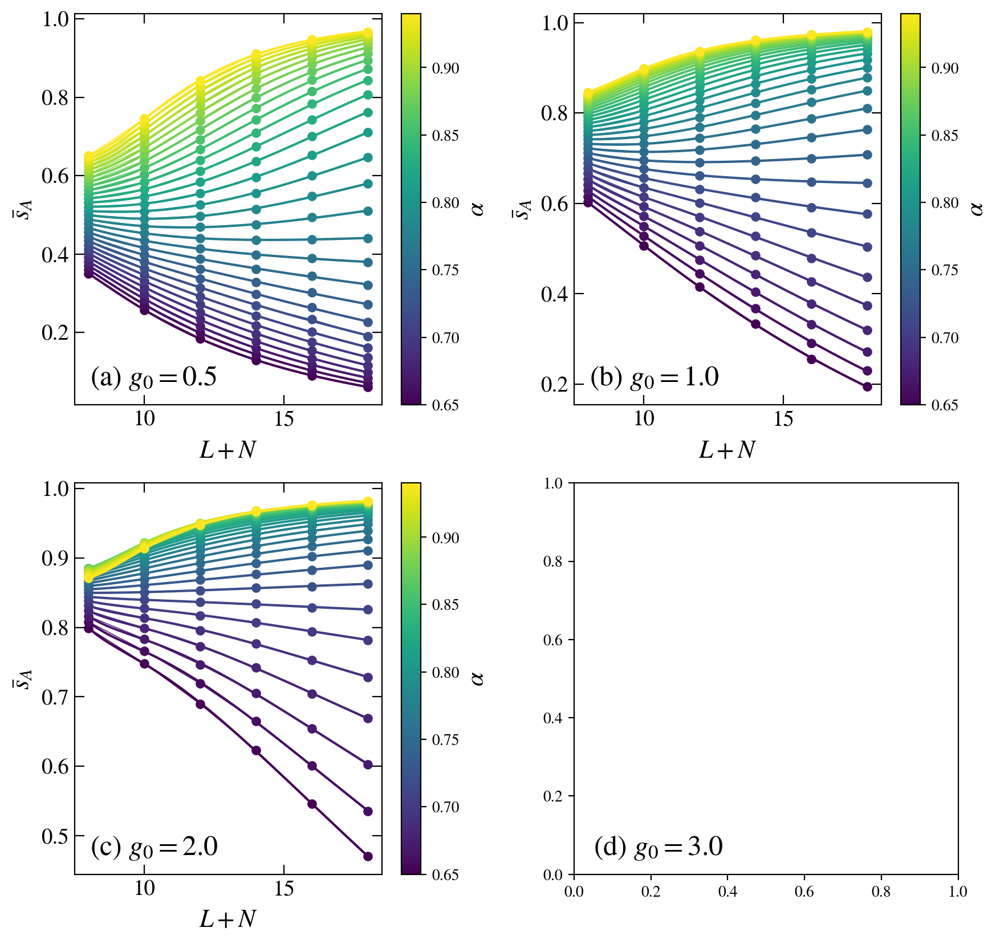

In [77]:
L_total=15

J=2


alfa=1
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

sub_sizes = np.arange(0, L+1)

# fig, ax = plt.subplots( nrows=1, ncols=1, figsize=(5,5), dpi = 200)

options = ['s1', 'r', 'D1']

interpolate = 0
plot_fractal = 1

dalfa = 0.7
p = -1       # number of last spins
nu = 500
sizes = np.arange(8, 17, 1 if p > 0 else 2)

option = 's1'
if option not in options:
    print(option, "Not found! Using s1 instead")
    print(1/0)
xlabs = {'s1': r"$\bar{s}_{%d}$"%p if p > 0 else r"$\bar{s}_A$", 'r': r"$\bar{r}$", 'D1': r"$\bar{D}_1$"}

plot_fractal = (option == 'D1')


frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu
folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
xlab = r"$L+N$"

def pade_fun(x, c1, c2, c3, d1, d2, d3):
    # return c1 * np.arctan(c2 * x - d1)
    # return (x**3 + c1*x**2 + c2*x + c3) / (x**3 + d1*x**2 + d2 * x + d3)
    return (x**2 + c1 * x + c2) / (x**2 + d1 * x + d2)

def other_fit(x, c1, c2, c3, c4, c5, c6):
    return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4
    # return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4 + c5/x**4 + c6 / x**5

fig, axes = plt.subplots( nrows=1, ncols=3, figsize=(15,6), dpi = 200) if plot_fractal else plt.subplots( nrows=2, ncols=2, figsize=(10,10), dpi = 200)
axis = axes.flatten()
for idx1, J in enumerate([0.5, 2, 3] if plot_fractal else [0.5, 1, 2]):
    
    alfa_crit = 0.75
    s1_crit = 1
    if J == 0.5:    alfa_crit = 0.77071119; s1_crit = 0.3975596423927653; sizes = np.arange(8, 20, 1 if p > 0 else 2)
    elif J == 1:    alfa_crit = 0.73503829; s1_crit = 0.5976612536491842; sizes = np.arange(8, 19, 1 if p > 0 else 2)
    elif J == 2:    alfa_crit = 0.72054518; s1_crit = 0.8326330851556897; sizes = np.arange(8, 19, 1 if p > 0 else 2)
    elif J == 3:    alfa_crit = 0.71795404; s1_crit = 0.9073984827790079; sizes = np.arange(8, 17, 1 if p > 0 else 2)
    else:           alfa_crit = 1/np.sqrt(2)
    
    interaction = []
    S = []
    Sinfo = []
    for L_total in sizes:
        L = L_total - N
        LA = L_total - p if p > 0 else L_total // 2

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
                Sinfo_vN     = np.array(file.get('vN info entropy'))
        else:
            print(name_out)
        alfa_vals_original = alfa_vals

        ent = entropy[LA] / ( p*np.log(2) ) if p > 0 else entropy[LA] / page(LA, L_total-LA)
        interaction.append(alfa_vals)
        if option == 's1': S.append(ent)
        if option == 'r':  S.append((gap_ratio - 0.3863) / (0.5307 - 0.3863))
        Sinfo.append(Sinfo_vN)

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    norm = matplotlib.colors.Normalize(
        vmin=max(alfa_crit - dalfa, min(alfa_vals)),
        vmax=min(alfa_crit + dalfa, max(alfa_vals)))


    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = Sinfo if plot_fractal else S
    ydata = np.transpose( np.array(ydata) )

    beta_0 = np.zeros( (alfa_vals.size) )
    new_xx = np.zeros( (alfa_vals.size) )
    
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa > alfa_crit + dalfa or alfa < alfa_crit - dalfa: continue

        xx = sizes
        yy = ydata[ii_a]
        if plot_fractal:
            D1 = np.diff(yy) / np.log(2)
            yy = ( D1[:-1] + D1[1:] ) / 2.0
            xx = sizes[1:-1] - N
            # yy = yy / xx / np.log(2)
            # if interpolate:
            #     spl = make_spline(sizes, ydata[ii_a])
            #     xx = np.linspace(sizes[0], sizes[-1], 20)
            #     yy = spl(xx)
            #     D1 = np.gradient(yy, xx[1] - xx[0]) / np.log(2)
            #     yy = D1 if idx1 == 3 and J != 1 else yy
            
        axis[idx1].plot(xx, yy, marker='o', markersize=5, lw=0.5, color=s_m.to_rgba(alfa))
        if interpolate:
            # axis[idx1].scatter(sizes, ydata[ii_a], marker='o', s=10, color=s_m.to_rgba(alfa))
            spl = make_spline(xx, yy)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = spl(xx)
            axis[idx1].scatter(xx, yy, marker='s', s=5, color=s_m.to_rgba(alfa))
        
        my_fit = pade_fun if alfa > alfa_crit else other_fit
        try:
            # xx = xx - N
            pars, pconv, fit_info, msg, _ = fit(my_fit,
                            xdata = xx,
                            ydata = yy,
                            full_output=True)
            print(J, alfa, fit_info['fvec'])
            dense_sizes = np.linspace(xx[0], xx[-1], 10000)
            axis[idx1].plot(dense_sizes, my_fit(dense_sizes, *pars), lw=1.5, color=s_m.to_rgba(alfa), ls = '--' if alfa == alfa_crit else '-')
        except RuntimeError:
            print(alfa)
        
# axis[0].axhline(y=0.3863, ls='--', color='black')
# axis[0].axhline(y=0.5307, ls='--', color='black')
    
    # axis[idx1].set_xlim(7.5, 16.5)

    # axis[idx1].set_ylim(0.97*min(ydata[alfa <= alfa_crit + dalfa or alfa >= alfa_crit - dalfa].flatten()), 1.0)
    fig_help.set_plot_elements(axis[idx1], ylabel=xlabs[option], xlabel=xlab, font_size=14, set_legend=False, xscale='linear', yscale='linear')
    cbar = None
    if plot_fractal:
        from mpl_toolkits.axes_grid1 import make_axes_locatable
        divider = make_axes_locatable(axis[idx1])
        cax = divider.new_vertical(size = '3%', pad = 0.05)
        
        fig.add_axes(cax)
        cbar = fig.colorbar(s_m, cax = cax, orientation = 'horizontal')
        cax.xaxis.set_ticks_position('top')
        cax.xaxis.set_label_position('top')
        # cbar = fig.colorbar(s_m, ax=axis[idx1], orientation='horizontal')
    else:
        cbar = fig.colorbar(s_m, ax=axis[idx1], orientation='vertical')
    cbar.set_label(r"$\alpha$", fontsize=16)
# fig.subplots_adjust(right=0.9)
# cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# # fig.colorbar(im, cax=cbar_ax)

# cbar.ax.tick_params(labelsize=15)

# for aa in [axis]:
#     for ax in np.array(aa).flatten():
#         ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
if not plot_fractal: axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[2 - plot_fractal].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[3 - plot_fractal].annotate(r"(d) $g_0=3.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')

fig.subplots_adjust(wspace = 0.2 + 0.1 * (not plot_fractal), hspace=0.2)

[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]
0.65 [0.35008531 0.34654488 0.25690264 0.25283793 0.18464065 0.17953881
 0.12878144 0.12587901 0.08973003 0.08477183 0.06088682 0.05550091]
0.66 [0.36016973 0.35861164 0.27054052 0.26792481 0.19958029 0.19521868
 0.14306968 0.14043972 0.10224278 0.09679101 0.07105481 0.06813827]
0.67 [0.37041846 0.37091493 0.28471823 0.28362775 0.21568923 0.21212758
 0.15897916 0.15698804 0.11664693 0.11125859 0.08418063 0.07984898]
0.68 [0.38091765 0.38335391 0.29945193 0.30010783 0.23283574 0.23062669
 0.17664182 0.17511354 0.13348238 0.12756412 0.09811704 0.09051039]
0.6900000000000001 [0.3914766  0.39606217 0.3146649  0.31755317 0.25117131 0.25060736
 0.19631566 0.19573284 0.15287076 0.14704629 0.11569543 0.11034837]
0.7 [0.40204929 0.4089219  0.33045342 0.33566265 0.27076539 0.27218009
 0.21790529 0.2194964  0.17560382 0.16977195 0.13614974 0.130

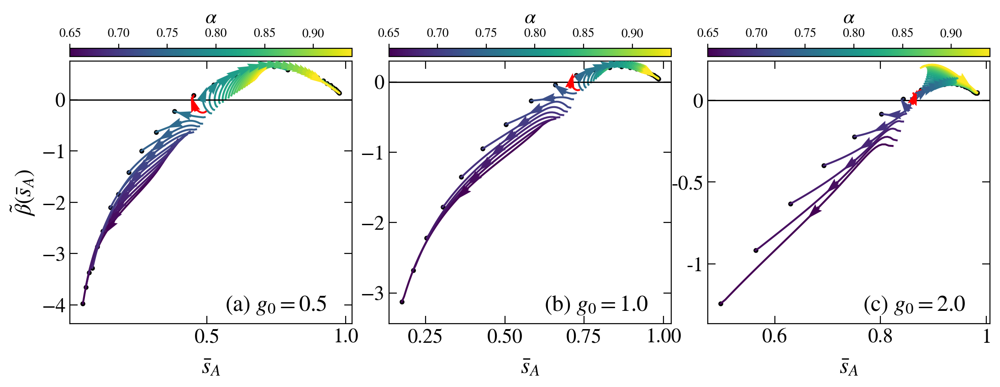

In [80]:
L_total=15
J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

sub_sizes = np.arange(0, L+1)

options = ['s1', 'r', 'D1']

option = 's1'
if option not in options:
    print(option, "Not found! Using s1 instead")
    print(1/0)

plot_fractal = (option == 'D1')

dalfa = 0.7
p = -1       # number of last spins
nu = 500
interpolate = 1
use_fit = 1
bin_size = 5
use_area_collapse = 1
sizes = np.arange(6, 19, 1 if p > 0 else 2)
    

xlabs = {'s1': r"$\bar{s}_{%d}$"%p if p > 0 else r"$\bar{s}_A$", 'r': r"$\bar{r}$", 'D1': r"$\bar{D}_1$"}

def beta_low_sp(x, a = 0.0, b = 1, alfa = 1.0):
    if use_area_collapse: return alfa * (x - a) / x * np.log( (x - a) / b )
    else:                 return (b - x) / x


def beta0_fun(x, o1 = 0.0, p = 1, c_ = 1):
    # c_ = 2**(2*p) / (2 * p * np.log(2))
    g_ = 1# + o1 / (p * np.log(2))
    if use_area_collapse: 
        # return 5*(g_ - x) / x
        return -(g_ - x) / x * np.log( (g_ - x) / c_ )
    else:                 return (g_ - x) / x 

frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
ylab = r"$\beta(X)$"

fig, axes = plt.subplots( nrows=1, ncols=2, figsize=(15,6), dpi = 200) if plot_fractal else plt.subplots( nrows=1, ncols=3, figsize=(13,4), dpi = 200)
axis = axes.flatten()
for idx1, J in enumerate([0.5, 2] if plot_fractal else [0.5, 1, 2]):
    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.77;   sizes = np.arange(8, 20, 1)
    elif J == 1:    alfa_crit = 0.74;   sizes = np.arange(8, 20, 1)
    elif J == 2:    alfa_crit = 0.72;   sizes = np.arange(8, 19, 1)
    elif J == 3:    alfa_crit = 0.71;   sizes = np.arange(8, 17, 1)
    else:           alfa_crit = 1/np.sqrt(2)
    
    interaction = []
    S = []
    Sinfo = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - p if p > 0 else L_total//2
        # LA = N+1

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
                Sinfo_vN     = np.array(file.get('vN info entropy'))
        else:
            print(name_out)
        
        ent = entropy[LA] / ( p*np.log(2) ) if p > 0 else entropy[LA] / page(LA, L_total-LA)
        # ent = entropy_site[LA] / page(1, L_total-1)
        interaction.append(alfa_vals)
        if option == 's1': S.append(ent)
        if option == 'r':  S.append((gap_ratio - 0.3863) / (0.5307 - 0.3863))
        Sinfo.append(Sinfo_vN)

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    norm = matplotlib.colors.Normalize(
        vmin=max(alfa_crit - dalfa, min(alfa_vals)),
        vmax=min(alfa_crit + dalfa, max(alfa_vals)))


    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = Sinfo if plot_fractal else S
    ydata = np.transpose( np.array(ydata) )
    # print(ydata)
    idx_c = 0

    envelope_ydata = []
    envelope_xdata = []
    yax_max = -10
    yax_min = 10
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa > alfa_crit + dalfa or alfa < alfa_crit - dalfa: continue
        # if alfa < 0.8: continue
        
        if alfa == alfa_crit: idx_c = ii_a
        col = 'red' if alfa==alfa_crit else s_m.to_rgba(alfa)
        # col = s_m.to_rgba(alfa)

        xx = sizes
        yy = ydata[ii_a]
        print(alfa, yy)
        
        if plot_fractal:
            D1 = np.diff(yy) / np.log(2)
            yy = ( D1[:-1] + D1[1:] ) / 2.0
            xx = sizes[1:-1] - N
            # yy = yy / xx / np.log(2)
        
        if interpolate:
            # axis[idx1].scatter(sizes, ydata[ii_a], marker='o', s=10, color=s_m.to_rgba(alfa))
            spl = make_spline(xx, yy)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = spl(xx)
        
        if not use_fit:
            if use_area_collapse: xx = np.log(xx)
            xx_beta = np.zeros( (xx.size - 1) )
            beta = np.zeros( (xx.size - 1) )
            for ii in range(xx.size - 1):
                xx_beta[ii] = yy[ii+1]
                beta[ii] = ( np.log(yy[ii+1]) - np.log(yy[ii])) / ( xx[ii+1] - xx[ii]) / (1.0 if use_area_collapse else np.log(2))
                envelope_ydata.append(beta[ii])
                envelope_xdata.append(xx_beta[ii])
            # envelope_ydata.append(beta[-1])
            # envelope_xdata.append(xx[-1])
            
            axis[idx1].plot(xx_beta, beta, marker='o', markersize=2, lw=1.5, color=col)
            if min(beta) < yax_min: yax_min = min(beta)
            if max(beta) > yax_max: yax_max = max(beta)
            i1 = xx.size // 2
            u = xx_beta[i1+1] - xx_beta[i1]
            v = beta[i1+1] - beta[i1]
            pos_x = xx_beta[i1] + u/2
            pos_y = beta[i1] + v/2
            norm = np.sqrt(u**2+v**2)

            axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
        else:

            my_fit = pade_fun if alfa > alfa_crit else other_fit
            # print(alfa, xx, yy)
            pars, pconv = fit(my_fit,
                                xdata = xx,
                                ydata = yy, maxfev=100000)
            dense_sizes = np.arange(xx[0], xx[-1]+0.25, 0.25)
            smooth_data = my_fit(dense_sizes, *pars)
            deriv = np.gradient( np.log(smooth_data), dense_sizes[1] - dense_sizes[0] ) / (1.0 / dense_sizes if use_area_collapse else np.log(2))
            axis[idx1].plot(smooth_data, deriv, lw=1.5, color=col)
            
            if min(deriv) < yax_min: yax_min = min(deriv)
            if max(deriv) > yax_max: yax_max = max(deriv)
            # spline = InterpolateSpline(sizes, ydata[ii_a], k=5, s=0)
            # spl_deriv = spline.derivative(n=1)
            # aaaa = np.linspace(sizes[0], sizes[-1], 100)
            # smooth_data = spline(aaaa)
            # deriv = spl_deriv(aaaa)
            
            # envelope_ydata = [*envelope_ydata, *deriv]
            # envelope_xdata = [*envelope_xdata, *smooth_data[smooth_data > 0]]
            envelope_ydata = [*envelope_ydata, deriv[-1]]
            envelope_xdata = [*envelope_xdata, smooth_data[-1]]

            i1 = smooth_data.size // 2
            u = smooth_data[i1+1] - smooth_data[i1]
            v = deriv[i1+1] - deriv[i1]
            pos_x = smooth_data[i1] + u/2
            pos_y = deriv[i1] + v/2
            norm = np.sqrt(u**2+v**2)
        
            axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
            
            # dense_sizes = np.arange(xx[-1], 1000, 0.1)
            # smooth_data = my_fit(dense_sizes, *pars)
            # deriv = np.gradient( np.log(smooth_data), dense_sizes[1] - dense_sizes[0] ) / (1.0 / dense_sizes if use_area_collapse else np.log(2))
            # axis[idx1].plot(smooth_data, deriv, lw=1.5, color=col, ls=':')
            
    # sorting X and Y data according to increasing X
    permut = np.argsort( np.array(envelope_xdata) )
    envelope_ydata = np.array(envelope_ydata)[permut]
    envelope_xdata = np.array(envelope_xdata)[permut]

    size = len(envelope_xdata)
    envelope = np.zeros( (size // bin_size) )
    sp_binned = np.zeros( (size // bin_size) )

    # Finding maximum Y in each bin of 20 points of interpolated data
    for k in range(envelope.size):
        idx_r = (k+1) * bin_size if k < envelope.size-1 else -1
        idx = np.argmax(envelope_ydata[k * bin_size : idx_r])
        envelope[k]  = envelope_ydata[k * bin_size : idx_r][idx]
        sp_binned[k] = envelope_xdata[k * bin_size : idx_r][idx]
    sp_binned = envelope_xdata
    envelope = envelope_ydata
    
    axis[idx1].scatter(sp_binned, envelope, color='black', s=8)
    # axis[idx1].plot(xxx, envelope, lw=2, color='k', ls='--')
    # print(envelope)
    # def envelope_polynomial(x, c1, c2, c3, c4, c5):#, c6, c7):#, c8):#, c9):#, c10):
    #     return c1 * (1-x) + c2 * (1-x)**2 + c3 * (1-x)**3 + c4 * (1-x)**4 + c5 * (1-x)**5#+ c6 * (x)**6 + c7 * (x)**7# + c8 * (x-1)**8# + c9 * (x-1)**9# + c10 * (x-1)**10
    # pars, pconv = fit(envelope_polynomial,
    #                     xdata = sp_binned,
    #                     ydata = envelope)
    
    # sp = np.linspace(min(envelope_xdata.flatten()), 1, 10000)
    # envelope_fitted = envelope_polynomial(sp, *pars)
    # axis[idx1].plot(sp, envelope_fitted, lw=1, color='k', ls='--', label=r"$\tilde{\beta}$" if use_area_collapse else r"${\beta}$")

    # Sc_idx = np.argwhere(np.abs(envelope_fitted) < 1e-2)[0][0]
    # Sc = sp[Sc_idx]
    # print(Sc_idx)
    # print(Sc_idx, sp[Sc_idx])
    # def linearize_at_transition(x, a, Sc):
    #     return a * (x - Sc)
    # # print(Sc_idx, envelope[Sc_idx - 20 : Sc_idx + 20])
    # pars, pconv = fit(linearize_at_transition,
    #                     xdata = sp[Sc_idx - 100 : Sc_idx + 100],
    #                     ydata = envelope_fitted[Sc_idx - 100 : Sc_idx + 100])
    # nu_exp = 1./ (pars[0] * pars[1])
    # Sc = pars[1]
    # print(*pars, "------", nu_exp, Sc)
    # axis[idx1].plot(sp, linearize_at_transition(sp, *pars), lw=1, color='gray', ls='-')
    
    # if idx1 == 0: axis[idx1].set_xlim(0.6, 1.0)
    # if idx1 == 1: axis[idx1].set_xlim(0.85, 1.0)
    # if idx1 == 2: axis[idx1].set_xlim(0.93, 1.0)
    # if idx1 == 3: axis[idx1].set_xlim(0.95, 1.0)
    # axis[idx1].set_xlim(0, 1.0)
    axis[idx1].set_ylim(1.1*yax_min, 1.1*yax_max)
    
    axis[idx1].axhline(y=0, ls='-', c='k', lw=1)
    xlab = xlabs[option]
    ylab = r"$\tilde{\beta}($" + xlab + "$)$" if use_area_collapse else r"${\beta}($" + xlab + "$)$"
    fig_help.set_plot_elements(axis[idx1], xlabel=xlab, ylabel=ylab if idx1 == 0 else "", font_size=16, set_legend=False, xscale='linear')
    cbar = None
    # if plot_fractal:
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    divider = make_axes_locatable(axis[idx1])
    cax = divider.new_vertical(size = '3%', pad = 0.05)
    
    fig.add_axes(cax)
    cbar = fig.colorbar(s_m, cax = cax, orientation = 'horizontal')
    cax.xaxis.set_ticks_position('top')
    cax.xaxis.set_label_position('top')
    # cbar = fig.colorbar(s_m, ax=axis[idx1], orientation='horizontal')
    # else:
    #     cbar = fig.colorbar(s_m, ax=axis[idx1], orientation='vertical', pad=0.01)
    cbar.set_label(r"$\alpha$", fontsize=16)
for aa in [axis[2:]]:
    for ax in np.array(aa).flatten():
        ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))


axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.55, 0.05), xycoords='axes fraction')
if not plot_fractal: axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.55, 0.05), xycoords='axes fraction')
axis[2 - plot_fractal].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.55, 0.05), xycoords='axes fraction')
# axis[3 - plot_fractal].annotate(r"(d) $g_0=3.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')

fig.subplots_adjust(wspace = 0.13, hspace=0.12)
# fig.savefig("plots_beta/FigS3_area.pdf" if use_area_collapse else "plots_beta/FigS3.pdf", bbox_inches = 'tight', pad_inches=0.02)
# fig.savefig("plots_beta/FigS3_area.png" if use_area_collapse else "plots_beta/FigS3.pdf", bbox_inches = 'tight', pad_inches=0.02)

In [56]:
(np.sqrt(5)-1)/2

0.6180339887498949

## LARGER $g_0$ -> Moving critical point to ergodic regime.

### main plot

[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]


No handles with labels found to put in legend.


0.5 nu= 0.46255312942375715 2.161913813545673
0.34920848625499484


No handles with labels found to put in legend.


1 nu= 0.6443455901265474 1.5519622006004623
0.6045108598790492


No handles with labels found to put in legend.


2 nu= 0.7831119974638499 1.2769565569657386
0.8351190484515072


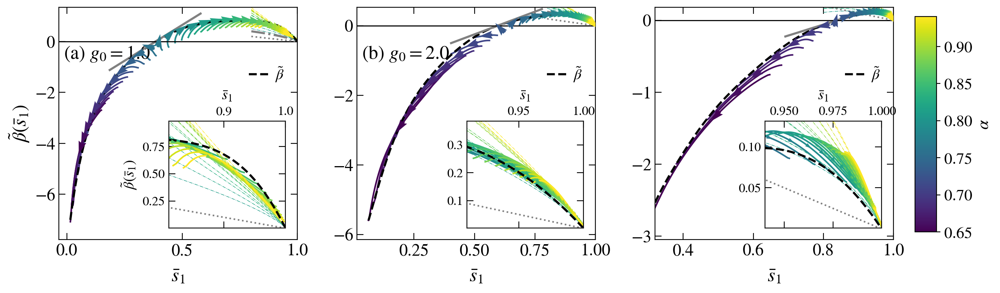

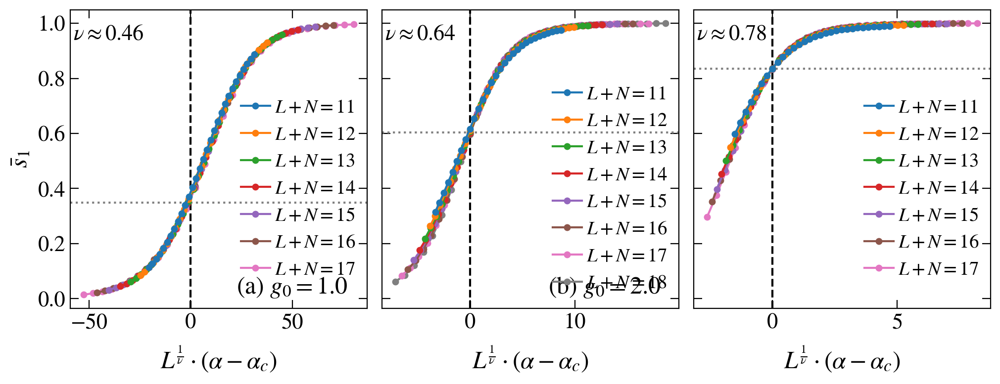

In [3]:
L_total=15
J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

sub_sizes = np.arange(0, L+1)
fig, axis = plt.subplots( nrows=1, ncols=3, figsize=(14,4), dpi = 200)
fig2, ax = plt.subplots( nrows=1, ncols=3, figsize=(12,4), dpi = 200, sharey=True)
# axis = np.array(axis).flatten()


interpolate = 1
use_fit = 1
bin_size = 5
use_area_collapse = 1


def beta0_fun(x, o1 = 0.0, p = 1, c_ = 1):
    # c_ = 2**(2*p) / (2 * p * np.log(2))
    g_ = 1 #+ o1 / (p * np.log(2))
    if use_area_collapse: 
        # return 5*(g_ - x) / x
        return -(g_ - x) / x * np.log( (g_ - x) / c_ )
    else:                 return (g_ - x) / x 

def pade_fun(x, c1, c2, c3, d1, d2, d3):
    # return c1 * np.arctan(c2 * x - d1)
    # return (x**3 + c1*x**2 + c2*x + c3) / (x**3 + d1*x**2 + d2 * x + d3)
    return (x**2 + c1 * x + c2) / (x**2 + d1 * x + d2)

def other_fit(x, c1, c2, c3, c4, c5, c6):
    return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4
    # return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4 + c5/x**4 + c6 / x**5

p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

sizes = np.arange(6, 19, 1 if p > 0 else 2)

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
ylab = r"$\beta(X)$"

# def other_fit(x, c1, c2, c3, c4, c5):
#     return c1 * (x)**4 + c2 * (x)**3 + c3 * (x)**2 + c4 * (x) + c5
for idx1, J in enumerate([0.5, 1, 2]):
    
    sizes = np.arange(10, 19 if J == 1 else 18, 1 if p > 0 else 2)
    inset = axis[idx1].inset_axes([0.46, 0.05, 0.49, 0.46]) if J < 2.5 else axis[idx1].inset_axes([0.03, 0.52, 0.49, 0.46])
    
    eta_erg = 0.67
    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.765;  eta_erg = 0.86
    elif J == 1:    alfa_crit = 0.73;   eta_erg = 0.80
    elif J == 2:    alfa_crit = 0.72;   eta_erg = 0.78
    elif J == 3:    alfa_crit = 0.72;   eta_erg = 0.74
    else:           alfa_crit = 1/np.sqrt(2)
    
    interaction = []
    ydata = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - p if p > 0 else L_total // 2

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
        else:
            print(name_out)

        # if interpolate:
        #     gap_ratio_spl = InterpolateSpline(alfa_vals, gap_ratio,                          k=5, s=0)
        #     entropy_spl =   InterpolateSpline(alfa_vals, entropy[LA] / page(LA, L_total-LA), k=5, s=0)
            
        #     bucket = 10
        #     alfa_vals = np.sort( np.array([*np.linspace(alfa_vals[0], alfa_vals[-1], 100), *alfa_vals]) )
        #     gap_ratio = tools.remove_fluctuations(gap_ratio_spl(alfa_vals), bucket_size=bucket)[bucket//2 : -bucket//2]
        #     entropy   = tools.remove_fluctuations(entropy_spl(alfa_vals),   bucket_size=bucket)[bucket//2 : -bucket//2]
        #     alfa_vals = alfa_vals[bucket//2 : -bucket//2]
        # else:
        #     # entropy = entropy_site[LA] / page(1, L_total-1)
            
        entropy = entropy[LA] / (p*np.log(2))#page(LA, L_total-LA)
        interaction.append(alfa_vals)
        ydata.append(entropy)

    alfa_min = 0.8

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    norm = matplotlib.colors.Normalize(
        vmin=np.min(alfa_vals),
        vmax=np.max(alfa_vals))


    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )

    idx_c = 0

    envelope_ydata = []
    envelope_xdata = []
    yax_max = -10
    yax_min = 10
    for ii_a, alfa in enumerate(alfa_vals):
        # if alfa < alfa_min: continue
        if alfa == alfa_crit: idx_c = ii_a
        # col = 'red' if alfa==alfa_crit else s_m.to_rgba(alfa)
        col = s_m.to_rgba(alfa)

        xx = sizes
        yy = ydata[ii_a]
        if interpolate:
            # print(alfa, xx, yy)
            spl = make_spline(xx, yy)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = spl(xx)
        if alfa >= alfa_min:
            pars, pconv = fit(power_law,
                        xdata = 2**xx[-4:],
                        ydata = 1 - yy[-4:],
                        )
            eta = -pars[0]
            c = pars[1]
            sp = np.linspace(0.8, 1, 1000)
            # print(alfa, eta)
            if use_area_collapse:   
                axis[idx1].plot(sp, beta0_fun(sp, o1=0, p=p, c_=c), lw=0.5, color=col, ls='-.')
                inset.plot(sp, beta0_fun(sp, o1=0, p=p, c_=c), lw=0.5, color=col, ls='-.')
            else:
                axis[idx1].plot(sp, eta * beta0_fun(sp, o1=0, p=p, c_=0),    lw=0.5, color=col, ls='-.')
                inset.plot(sp, eta * beta0_fun(sp, o1=0, p=p, c_=0),    lw=0.5, color=col, ls='-.')
        if use_area_collapse: xx = np.log(xx)
        if not use_fit:
            xx_beta = np.zeros( (sizes.size - 1) )
            beta = np.zeros( (sizes.size - 1) )
            for ii in range(sizes.size - 1):
                xx_beta[ii] = ydata[ii_a][ii+1]
                beta[ii] = ( np.log(yy[ii+1]) - np.log(yy[ii])) / ( xx[ii+1] - xx[ii]) / (1.0 if use_area_collapse else np.log(2))
                # envelope_ydata.append(beta[ii])
                # envelope_xdata.append(xx_beta[ii])
            envelope_ydata.append(beta[-1])
            envelope_xdata.append(xx_beta[-1])
            
            axis[idx1].plot(xx_beta, beta, marker='o', markersize=2, lw=1.5, color=col)
            inset.plot(xx_beta, beta, marker='o', markersize=2, lw=1.5, color=col)
            if min(beta) < yax_min: yax_min = min(beta)
            if max(beta) > yax_max: yax_max = max(beta)
            i1 = xx.size // 2
            u = xx_beta[i1+1] - xx_beta[i1]
            v = beta[i1+1] - beta[i1]
            pos_x = xx_beta[i1] + u/2
            pos_y = beta[i1] + v/2
            norm = np.sqrt(u**2+v**2)

            axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
            inset.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
        else:

            my_fit = pade_fun if alfa > alfa_crit else other_fit
            pars, pconv = fit(my_fit,
                                xdata = xx,
                                ydata = yy,
                                maxfev = 10000
                                )
            xL = np.linspace(xx[0], xx[-1], 50)
            smooth_data = my_fit(xL, *pars)
            # spl = make_spline(xx, yy, k=3)
            # xx = np.linspace(xx[0], 2*xx[-1], 100)
            # smooth_data = spl(xx)
            
            deriv = np.gradient( np.log(smooth_data), xL[1] - xL[0] ) / (1.0 if use_area_collapse else np.log(2))

            axis[idx1].plot(smooth_data, deriv, lw=1.5, color=col)
            inset.plot(smooth_data, deriv, lw=1.5, color=col)
            
            if min(deriv) < yax_min: yax_min = min(deriv)
            if max(deriv) > yax_max: yax_max = max(deriv)
            # spline = InterpolateSpline(sizes, ydata[ii_a], k=5, s=0)
            # spl_deriv = spline.derivative(n=1)
            # aaaa = np.linspace(sizes[0], sizes[-1], 100)
            # smooth_data = spline(aaaa)
            # deriv = spl_deriv(aaaa)
            
            # envelope_ydata = [*envelope_ydata, *deriv]
            # envelope_xdata = [*envelope_xdata, *smooth_data]
            envelope_ydata = [*envelope_ydata, deriv[-1]]
            envelope_xdata = [*envelope_xdata, smooth_data[-1]]

            i1 = smooth_data.size // 2
            u = smooth_data[i1+1] - smooth_data[i1]
            v = deriv[i1+1] - deriv[i1]
            pos_x = smooth_data[i1] + u/2
            pos_y = deriv[i1] + v/2
            norm = np.sqrt(u**2+v**2)
        
            axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
            inset.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
    
    # sorting X and Y data according to increasing X
    permut = np.argsort( np.array(envelope_xdata) )
    envelope_ydata = np.array(envelope_ydata)[permut]
    envelope_xdata = np.array(envelope_xdata)[permut]

    size = len(envelope_xdata)
    envelope = np.zeros( (size // bin_size) )
    xxx = np.zeros( (size // bin_size) )

    # Finding maximum Y in each bin of 20 points of interpolated data
    for k in range(envelope.size):
        idx_r = (k+1) * bin_size if k < envelope.size-1 else -1
        idx = np.argmax(envelope_ydata[k * bin_size : idx_r])
        envelope[k] = envelope_ydata[k * bin_size : idx_r][idx]
        xxx[k]      = envelope_xdata[k * bin_size : idx_r][idx]
    xxx = envelope_xdata
    envelope = envelope_ydata
    # axis[idx1].plot(xxx, envelope, lw=2, color='k', ls='--')

    def envelope_polynomial(x, c1, c2, c3, c4, c5, c6, c7, c8, c9):#, c10):
        return c1 * (x-1) + c2 * (x-1)**2 + c3 * (x-1)**4 + c4 * (x-1)**4 + c5 * (x-1)**5 + c6 * (x-1)**6 + c7 * (x-1)**7 + c8 * (x-1)**8 + c9 * (x-1)**9# + c10 * (x-1)**10
    pars, pconv = fit(envelope_polynomial,
                        xdata = xxx,
                        ydata = envelope)
    
    # axis[idx1].plot(new_xx, beta_0, lw=2, color='k', ls='--')

    sp = np.linspace(0.8, 1, 10000)
    # print("aa", p)
    axis[idx1].plot(sp, beta0_fun(sp, o1=0, p=p), lw=2, color='gray', ls='-.')
    # inset.plot(sp, beta0_fun(sp, o1=0, p=p), lw=2, color='gray', ls='-.', label=r"$\tilde{\beta}_0$" if use_area_collapse else r"${\beta}_0$")
    # if use_area_collapse:   inset.plot(sp, 1./eta_erg * beta0_fun(sp, o1=0, p=p), lw=2, color='gray', ls='-.', label=r"$\tilde{\beta}_0^{(1)}$")
    # else:                   inset.plot(sp, eta_erg * beta0_fun(sp, o1=0, p=p), lw=2, color='gray', ls='-.', label=r"${\beta}_0^{(1)}$")

    sp = np.linspace(min(ydata.flatten()), 1, 10000)
    envelope = envelope_polynomial(sp, *pars)
    axis[idx1].plot(sp, envelope, lw=2, color='k', ls='--', label=r"$\tilde{\beta}$" if use_area_collapse else r"${\beta}$")
    inset.plot(sp, envelope, lw=2, color='k', ls='--')
    
    Sc_idx = np.argwhere(np.abs(envelope) < 1e-2)[0][0]

    def linearize_at_transition(x, a, Sc):
        return a * (x - Sc)
    # print(Sc_idx, envelope[Sc_idx - 20 : Sc_idx + 20])
    pars, pconv = fit(linearize_at_transition,
                        xdata = sp[Sc_idx - 100 : Sc_idx + 100],
                        ydata = envelope[Sc_idx - 100 : Sc_idx + 100])
    nu_exp = 1./ (pars[0] * pars[1])
    Sc = pars[1]
    print(J, "nu=", nu_exp, 1./nu_exp)
    ax[idx1].annotate(r"$\nu\approx%.2f$"%nu_exp, fontsize=16, xy=(0.01, 0.9), xycoords='axes fraction')
    axis[idx1].plot(sp[Sc_idx - 2000 : Sc_idx + 2000], linearize_at_transition(sp[Sc_idx - 2000 : Sc_idx + 2000], *pars), lw=2, color='gray', ls='-')
    
    
    axis[idx1].set_xlim(None, 1)
    axis[idx1].set_ylim(1.1*yax_min, 1.5*yax_max)
    if J == 1:
        axis[idx1].set_xlim(None, 1.0)
        axis[idx1].set_ylim(1.1*yax_min, 1.5*yax_max)
    if J == 2:
        axis[idx1].set_xlim(0.32, 1.0)
        axis[idx1].set_ylim(1.1*yax_min, 1.5*yax_max)
    if J == 3:
        axis[idx1].set_xlim(0.35, 1.0)
        axis[idx1].set_ylim(1.1*yax_min, 2.5*yax_max)
    
    axis[idx1].axhline(y=0, ls='-', c='k', lw=1)
    inset.axhline(y=0, ls='-', c='k', lw=1)
    xlab = r"$\bar{s}_{%d}$"%p
    ylab = r"$\tilde{\beta}($" + xlab + "$)$" if use_area_collapse else r"${\beta}($" + xlab + "$)$"
    fig_help.set_plot_elements(axis[idx1], xlabel=xlab, ylabel=ylab if idx1 == 0 else "", font_size=16, set_legend=False, xscale='linear')
    fig_help.set_legend(axis[idx1], loc = 'upper right', fontsize=14, anchor=(1.0, 0.81))
    
    if J < 2.5:
        inset.xaxis.set_label_position("top")
        inset.xaxis.set_label_coords(.5, 1.2)
        inset.xaxis.tick_top()
    else:
        inset.yaxis.set_label_position("right")
        # inset.yaxis.set_label_coords(.5, 1.2)
        inset.yaxis.tick_right()

    fig_help.set_plot_elements(inset, xlabel=xlab, ylabel=ylab if idx1 == 0 else "", font_size=12, set_legend=False, yscale='linear')
    fig_help.set_legend(inset, loc = 'lower left', fontsize=12)
    xxaa = np.linspace(0.8, 1.05)
    axis[idx1].plot(xxaa, 1-xxaa, ls=':', c='gray')
    inset.plot(xxaa, 1-xxaa, ls=':', c='gray')

    inset.set_xlim(1.1 * Sc, 1.0)
    if idx1 == 0: inset.set_xlim(0.81, 1.0)
    if idx1 == 1: inset.set_xlim(0.91, 1.0)
    if idx1 == 2: inset.set_xlim(0.94, 1.0)
    inset.set_ylim(1e-3, 1.1*yax_max)
    # inset.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    # inset.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    # inset.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    # inset.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
    
    
    ## COLLAPSED DATA
    plot_y_collapse = 0

    ydata = np.transpose( np.array(ydata) )
    _Sc = 0
    counttt = 0
    for ii, L in enumerate(sizes - N):
        if L+N > 10:
            if use_area_collapse: 
                x_collapsed = (L+N)**(1/nu_exp) * (interaction[ii] - alfa_crit)
                y_collapsed = (L+N)**(-1/nu_exp) * (ydata[ii] - Sc)
            else:                 
                x_collapsed = 2**( (L+N)/nu_exp ) * (interaction[ii] - alfa_crit)
                y_collapsed = 2**(-(L+N)/nu_exp) * (ydata[ii] - Sc)
                
            idx = (np.abs(x_collapsed)).argmin()
            _Sc += ydata[ii][idx]
            counttt += 1
            if plot_y_collapse: ax[idx1].plot(interaction[ii], y_collapsed, marker='o', markersize=4, lw=1.5, label=r"$L+N=%d$"%(L+N), zorder=20 - L)
            else:               ax[idx1].plot(x_collapsed, ydata[ii], marker='o', markersize=4, lw=1.5, label=r"$L+N=%d$"%(L+N), zorder=20 - L)
            
    _Sc = _Sc / counttt
    print(_Sc)
    if plot_y_collapse:
        ylab = r"${L}^{\frac{1}{\nu}}\cdot(\bar{s}_{%d}-\bar{s}_{%d}^c)$"%(p,p) if use_area_collapse else r"$\mathcal{D}^{\frac{1}{\nu}}\cdot(\bar{s}_{%d}-\bar{s}_{%d}^c)$"%(p,p)
        fig_help.set_plot_elements(ax[idx1], ylabel=ylab if idx1 == 0 else "", xlabel=r"$\alpha$", font_size=16, set_legend=False, xscale='linear')
        ax[idx1].axvline(x=alfa_crit, ls='--', c='k')
    else:
        ax[idx1].axvline(x=0, ls='--', c='k')
        # axis.plot(xxx, _Sc / nu_exp * (xxx - _Sc), lw=1, color='blue', ls='-')

        ax[idx1].axhline(y=_Sc, ls=':', c='gray')
        xlabbb = r"${L}^{\frac{1}{\nu}}\cdot(\alpha-\alpha_c)$" if use_area_collapse else r"$\mathcal{D}^{\frac{1}{\nu}}\cdot(\alpha-\alpha_c)$"
        fig_help.set_plot_elements(ax[idx1], ylabel=xlab if idx1 == 0 else "", xlabel=xlabbb, font_size=16, set_legend=False, xscale='linear')

        fig_help.set_legend(ax[idx1], loc = 'center right', fontsize=14, anchor=(1.02, 0.4))

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

# for aa in [axis]:
#     for ax in np.array(aa).flatten():
#         ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

axis[0].annotate(r"(a) $g_0=1.0$", fontsize=18, xy=(0.02, 0.78), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=2.0$", fontsize=18, xy=(0.02, 0.78), xycoords='axes fraction')
# axis[2].annotate(r"(c) $g_0=3.0$", fontsize=18, xy=(0.60, 0.08), xycoords='axes fraction')
# axis[3].annotate(r"(d) $J=3.0$", fontsize=16, xy=(0.65, 0.08), xycoords='axes fraction')
# axis[0].set_title(r"$N=3, \gamma=%.1f$"%(gamma), fontsize=16)
# axis[1].set_title(r"$N=5, \gamma=%.1f$"%(gamma), fontsize=16)

fig.subplots_adjust(wspace = 0.25, hspace=0.2)
fig.savefig("plots_beta/Fig2_area.pdf" if use_area_collapse else "plots_beta/Fig2.pdf", bbox_inches = 'tight', pad_inches=0.02)
fig.savefig("plots_beta/Fig2_area.png" if use_area_collapse else "plots_beta/Fig2.pdf", bbox_inches = 'tight', pad_inches=0.02)

ax[0].annotate(r"(a) $g_0=1.0$", fontsize=18, xy=(0.56, 0.05), xycoords='axes fraction')
ax[1].annotate(r"(b) $g_0=2.0$", fontsize=18, xy=(0.56, 0.05), xycoords='axes fraction')
# ax[2].annotate(r"(c) $g_0=3.0$", fontsize=18, xy=(0.56, 0.05), xycoords='axes fraction')

fig2.subplots_adjust(wspace = 0.05, hspace=0.05)
fig2.savefig("plots_beta/FigS2_area.pdf" if use_area_collapse else "plots_beta/FigS2.pdf", bbox_inches = 'tight', pad_inches=0.02)
fig2.savefig("plots_beta/FigS2_area.png" if use_area_collapse else "plots_beta/FigS2.png", bbox_inches = 'tight', pad_inches=0.02)

### Low-sp scaling (log?)

0.5 0.65 [-1.01336761e-03  3.45809555e-03 -1.30138798e-03 -3.06867982e-03
 -1.45886219e-03  1.25994822e-03  2.86943939e-03  2.17584617e-03
  1.13257325e-04 -1.56180288e-03 -1.41350857e-03 -2.54466010e-04
  5.81007440e-04  1.81140909e-04 -7.97149246e-04 -1.31845363e-03
 -6.87595417e-04  4.87889054e-04  1.25894666e-03  9.56014456e-04
  8.79265887e-05 -5.51516799e-04 -4.13009387e-04  1.10540951e-04
  3.86185585e-04 -9.82792437e-06 -6.48252944e-04 -8.87994440e-04
 -3.05138899e-04  6.60177726e-04  1.35200510e-03  1.28471823e-03
  6.52762124e-04 -1.78481669e-04 -8.42306977e-04 -9.70556573e-04
 -1.93542877e-04]
0.5 0.66 [-0.00059804  0.00249102 -0.00146602 -0.00263121 -0.00091918  0.00164662
  0.0031624   0.00259984  0.00060579 -0.00149572 -0.00249698 -0.00251781
 -0.00197181 -0.00119204 -0.00030579  0.00060053  0.0014068   0.00190352
  0.00184564  0.00112312  0.00021688 -0.00025274  0.00010877  0.00082321
  0.00119026  0.00072058 -0.00021686 -0.00103983 -0.00131956 -0.00123669
 -0.00112412 -

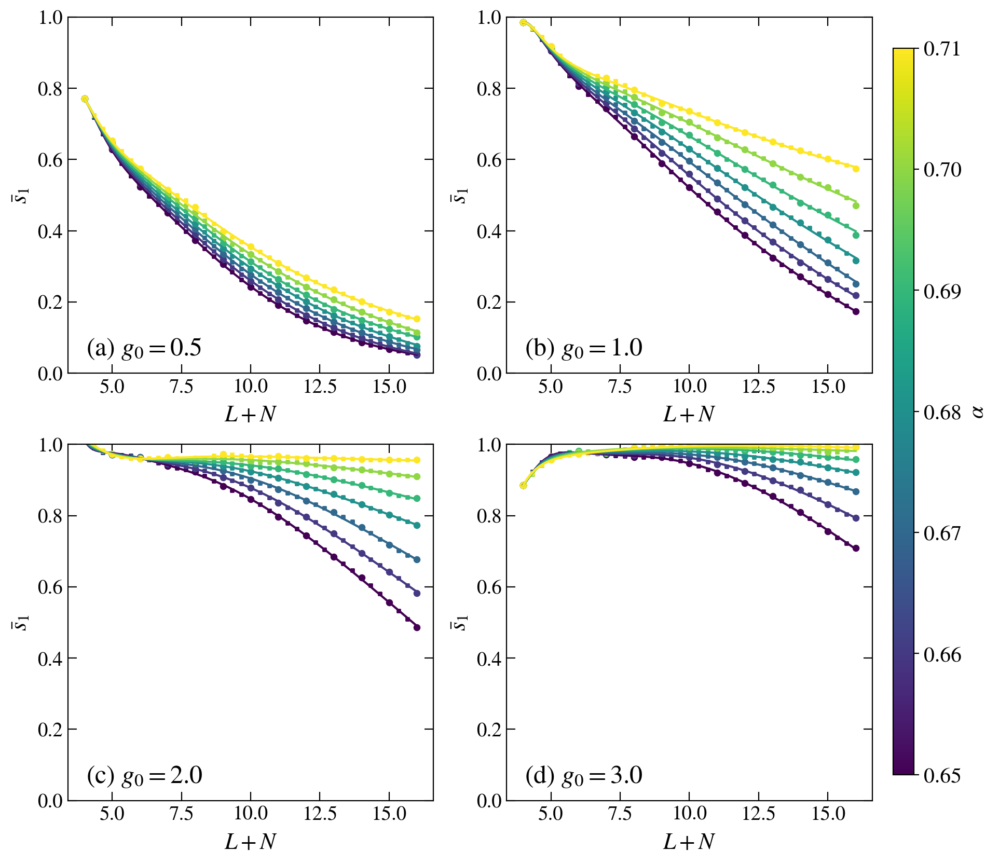

In [293]:
L_total=15

J=2


alfa=1
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

alfa_crit = 0.75
if J == 0.5:    alfa_crit = 0.77
elif J == 1:    alfa_crit = 0.73
elif J == 2:    alfa_crit = 0.72
elif J == 3:    alfa_crit = 0.71
else:           alfa_crit = 1/np.sqrt(2)
sub_sizes = np.arange(0, L+1)

fig, axes = plt.subplots( nrows=2, ncols=2, figsize=(10,10), dpi = 200)
# fig, ax = plt.subplots( nrows=1, ncols=1, figsize=(5,5), dpi = 200)

axis = axes.flatten()

sizes = np.arange(4, 17, 1)

interpolate = 1

alfa_max = 0.71
p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
xlab = r"$L+N$"

def pade_fun(x, c1, c2, c3, d1, d2, d3):
    # return c1 * np.arctan(c2 * x - d1)
    return (x**3 + c1*x**2 + c2*x + c3) / (x**3 + d1*x**2 + d2 * x + d3)
    # return (x**2 + c1 * x + c2) / (x**2 + d1 * x + d2)

def other_fit(x, c1, c2, c3, c4, c5, c6):
    # return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4
    return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4 + c5/x**4 + c6 / x**5

for idx1, J in enumerate([0.5, 1, 2, 3]):
    interaction = []
    ydata = []
    for L_total in sizes:
        L = L_total - N
        LA = L_total - p

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
                Sinfo_vN     = np.array(file.get('vN info entropy'))
        else:
            print(name_out)
        alfa_vals_original = alfa_vals
        # print(L_total, entropy.shape)
        entropy = entropy[LA] / ( p*np.log(2) )#page(LA, L_total-LA)
        interaction.append(alfa_vals)
        # ydata.append(entropy)
        ydata.append((gap_ratio - 0.3863) / (0.5307 - 0.3863))
        

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    if J < 3:
        norm = matplotlib.colors.Normalize(
            vmax=alfa_max,
            vmin=np.min(alfa_vals))

    # choose a colormap
    # c_m = matplotlib.cm.cool

    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )
    # print(ydata.shape)
    beta_0 = np.zeros( (alfa_vals.size) )
    new_xx = np.zeros( (alfa_vals.size) )
    
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa > alfa_max: continue

        xx = sizes
        yy = ydata[ii_a]
        axis[idx1].scatter(xx, yy, marker='o', s=15, color=s_m.to_rgba(alfa))
        if interpolate:
            # axis[idx1].scatter(sizes, ydata[ii_a], marker='o', s=10, color=s_m.to_rgba(alfa))
            spl = make_spline(xx, yy)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = spl(xx)
            axis[idx1].scatter(xx, yy, marker='s', s=5, color=s_m.to_rgba(alfa))
        
        my_fit = pade_fun if alfa > alfa_crit else other_fit
        try:
            # xx = xx - N
            pars, pconv, fit_info, msg, _ = fit(my_fit,
                            xdata = xx,
                            ydata = yy,
                            full_output=True)
            print(J, alfa, fit_info['fvec'])
            dense_sizes = np.linspace(xx[0], xx[-1], 10000)
            axis[idx1].plot(dense_sizes, my_fit(dense_sizes, *pars), lw=1.5, color=s_m.to_rgba(alfa), ls = '--' if alfa == alfa_crit else '-')
        except RuntimeError:
            print(alfa)
        
# axis[0].axhline(y=0.3863, ls='--', color='black')
# axis[0].axhline(y=0.5307, ls='--', color='black')
    
    # axis[idx1].set_xlim(7.5, 16.5)

    axis[idx1].set_ylim(0.0, 1.0)
    fig_help.set_plot_elements(axis[idx1], ylabel=r"$\bar{s}_{%d}$"%p, xlabel=xlab, font_size=14, set_legend=False, xscale='linear', yscale='linear')

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

# for aa in [axis]:
#     for ax in np.array(aa).flatten():
#         ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[3].annotate(r"(d) $g_0=3.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')

fig.subplots_adjust(wspace = 0.2, hspace=0.2)

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94 0.95 0.96 0.97 0.98 0.99 1.  ]


No handles with labels found to put in legend.
No handles with labels found to put in legend.


No handles with labels found to put in legend.
No handles with labels found to put in legend.


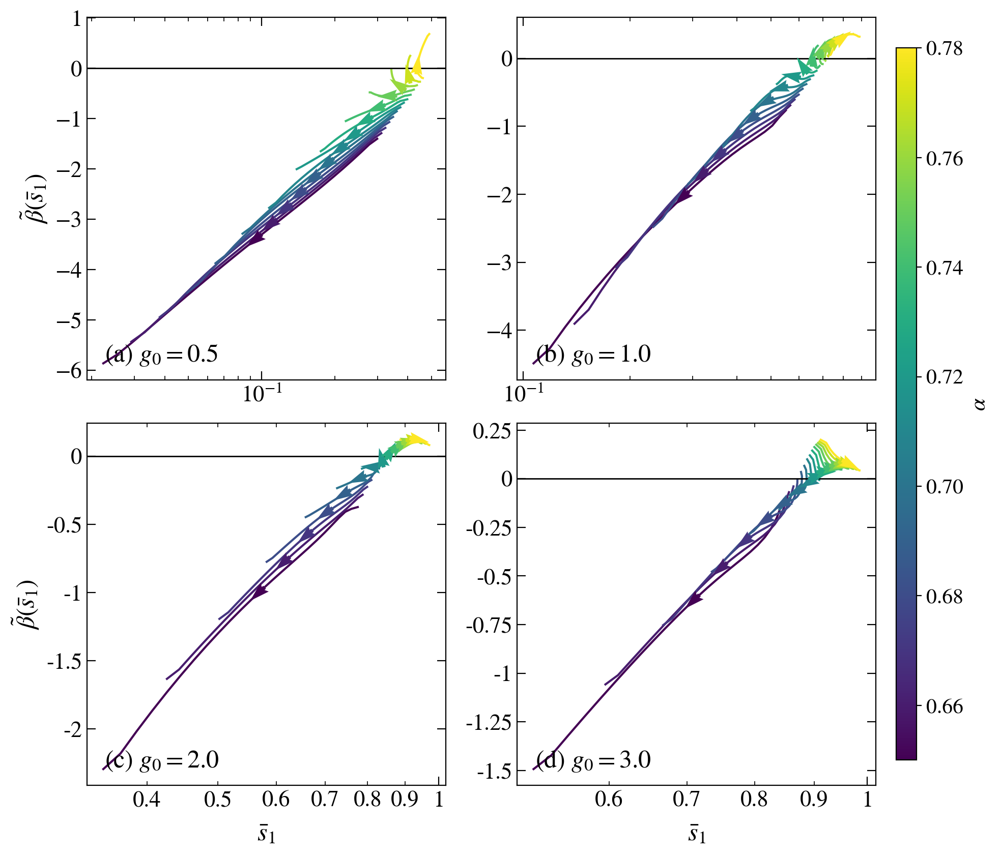

In [297]:
L_total=15
J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

alfa_vals = np.linspace(0.65, 1.0, 36)
print(alfa_vals)

sub_sizes = np.arange(0, L+1)
fig, axis = plt.subplots( nrows=2, ncols=2, figsize=(10,10), dpi = 200)
axis = np.array(axis).flatten()


interpolate = 1
use_fit = 1
bin_size = 5
use_area_collapse = 1

def beta_low_sp(x, a = 0.0, b = 1, alfa = 1.0):
    if use_area_collapse: return alfa * (x - a) / x * np.log( (x - a) / b )
    else:                 return (b - x) / x


def beta0_fun(x, o1 = 0.0, p = 1, c_ = 1):
    # c_ = 2**(2*p) / (2 * p * np.log(2))
    g_ = 1# + o1 / (p * np.log(2))
    if use_area_collapse: 
        # return 5*(g_ - x) / x
        return -(g_ - x) / x * np.log( (g_ - x) / c_ )
    else:                 return (g_ - x) / x 


alfa_max = 0.78
p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
ylab = r"$\beta(X)$"

norm = None
for idx1, J in enumerate([0.5, 1, 2, 3]):
    
    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.77
    elif J == 1:    alfa_crit = 0.74
    elif J == 2:    alfa_crit = 0.72
    elif J == 3:    alfa_crit = 0.72
    else:           alfa_crit = 1/np.sqrt(2)
    
    sizes = np.arange(7, 17, 1 if p > 0 else 2)

    interaction = []
    ydata = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - p if p > 0 else L_total//2
        # LA = N+1

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
        else:
            print(name_out)
        
        S = entropy[LA] / (p*np.log(2))#page(LA, L_total-LA)
        # S = entropy_site[LA] / page(1, L_total-1)
        interaction.append(alfa_vals)
        ydata.append(S)
        # ydata.append((gap_ratio - 0.3863) / (0.5307 - 0.3863))

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    if J < 3:
        norm = matplotlib.colors.Normalize(
            vmax=alfa_max,
            vmin=np.min(alfa_vals))


    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )
    # print(ydata)
    idx_c = 0

    envelope_ydata = []
    envelope_xdata = []
    yax_max = -10
    yax_min = 10
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa > alfa_max: continue
        if alfa == alfa_crit: idx_c = ii_a
        # col = 'red' if alfa==alfa_crit else s_m.to_rgba(alfa)
        col = s_m.to_rgba(alfa)
        
        xx = sizes
        yy = ydata[ii_a]
        if interpolate:
            # axis[idx1].scatter(sizes, ydata[ii_a], marker='o', s=10, color=s_m.to_rgba(alfa))
            spl = make_spline(xx, yy)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = spl(xx)
        
        # if alfa > alfa_min - 1e-3:
        #     pars, pconv = fit(power_law,
        #                     xdata = 2**xx[-4:],
        #                     ydata = 1 - yy[-4:],
        #                     )
        #     eta = -pars[0]
        #     c = pars[1]
        #     sp = np.linspace(0.6, 1, 1000)
        #     # print(alfa, eta)
        #     if use_area_collapse:   axis[idx1].plot(sp, 1./eta * beta0_fun(sp, o1=0, p=p, c_=c), lw=0.9, color=col, ls='-.')
        #     else:                   axis[idx1].plot(sp, eta * beta0_fun(sp, o1=0, p=p, c_=c),    lw=0.9, color=col, ls='-.')

        if not use_fit:
            if use_area_collapse: xx = np.log(xx)
            xx_beta = np.zeros( (xx.size - 1) )
            beta = np.zeros( (xx.size - 1) )
            for ii in range(xx.size - 1):
                xx_beta[ii] = yy[ii+1]
                beta[ii] = ( np.log(yy[ii+1]) - np.log(yy[ii])) / ( xx[ii+1] - xx[ii]) / (1.0 if use_area_collapse else np.log(2))
                envelope_ydata.append(beta[ii])
                envelope_xdata.append(xx_beta[ii])
            # envelope_ydata.append(beta[-1])
            # envelope_xdata.append(xx[-1])
            
            axis[idx1].plot(xx_beta, beta, marker='o', markersize=2, lw=1.5, color=col)
            if min(beta) < yax_min: yax_min = min(beta)
            if max(beta) > yax_max: yax_max = max(beta)
            i1 = xx.size // 2
            u = xx_beta[i1+1] - xx_beta[i1]
            v = beta[i1+1] - beta[i1]
            pos_x = xx_beta[i1] + u/2
            pos_y = beta[i1] + v/2
            arr_norm = np.sqrt(u**2+v**2)

            axis[idx1].quiver(pos_x, pos_y, u/arr_norm, v/arr_norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
        else:

            my_fit = pade_fun if alfa > alfa_crit else other_fit
            # print(alfa, xx, yy)
            pars, pconv = fit(my_fit,
                                xdata = xx,
                                ydata = yy, maxfev=10000)
            dense_sizes = np.linspace(xx[0], xx[-1], 25)
            smooth_data = my_fit(dense_sizes, *pars)
            # spl = make_spline(xx, yy, k=3)
            # xx = np.linspace(xx[0], 2*xx[-1], 100)
            # smooth_data = spl(xx)
            # if use_area_collapse: 
            # dense_sizes = np.log(dense_sizes)
            
            deriv = np.gradient( np.log(smooth_data), dense_sizes[1] - dense_sizes[0] ) / (1.0 / dense_sizes if use_area_collapse else np.log(2))
            # print(smooth_data)
            axis[idx1].plot(smooth_data, deriv, lw=1.5, color=col)
            
            if min(deriv) < yax_min: yax_min = min(deriv)
            if max(deriv) > yax_max: yax_max = max(deriv)
            # spline = InterpolateSpline(sizes, ydata[ii_a], k=5, s=0)
            # spl_deriv = spline.derivative(n=1)
            # aaaa = np.linspace(sizes[0], sizes[-1], 100)
            # smooth_data = spline(aaaa)
            # deriv = spl_deriv(aaaa)
            
            envelope_ydata = [*envelope_ydata, *deriv]
            envelope_xdata = [*envelope_xdata, *smooth_data[smooth_data > 0]]
            # envelope_ydata = [*envelope_ydata, deriv[-1]]
            # envelope_xdata = [*envelope_xdata, smooth_data[-1]]

            i1 = smooth_data.size // 2
            u = smooth_data[i1+1] - smooth_data[i1]
            v = deriv[i1+1] - deriv[i1]
            pos_x = smooth_data[i1] + u/2
            pos_y = deriv[i1] + v/2
            arr_norm = np.sqrt(u**2+v**2)
        
            axis[idx1].quiver(pos_x, pos_y, u/arr_norm, v/arr_norm, angles="xy", zorder=5, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
            
    # sorting X and Y data according to increasing X
    permut = np.argsort( np.array(envelope_xdata) )
    envelope_ydata = np.array(envelope_ydata)[permut]
    envelope_xdata = np.array(envelope_xdata)[permut]

    size = len(envelope_xdata)
    envelope = np.zeros( (size // bin_size) )
    sp_binned = np.zeros( (size // bin_size) )

    # Finding maximum Y in each bin of 20 points of interpolated data
    for k in range(envelope.size):
        idx_r = (k+1) * bin_size if k < envelope.size-1 else -1
        idx = np.argmax(envelope_ydata[k * bin_size : idx_r])
        envelope[k]  = envelope_ydata[k * bin_size : idx_r][idx]
        sp_binned[k] = envelope_xdata[k * bin_size : idx_r][idx]
    # xxx = envelope_xdata
    # envelope = envelope_ydata
    # axis[idx1].plot(xxx, envelope, lw=2, color='k', ls='--')
    # print(envelope)
    def envelope_polynomial(x, c1, c2, c3, c4, c5, c6, c7):#, c8):#, c9):#, c10):
        return c1 * (x-1) + c2 * (x-1)**2 + c3 * (x-1)**4 + c4 * (x-1)**4 + c5 * (x-1)**5 + c6 * (x-1)**6 + c7 * (x-1)**7# + c8 * (x-1)**8# + c9 * (x-1)**9# + c10 * (x-1)**10
    pars, pconv = fit(envelope_polynomial,
                        xdata = sp_binned,
                        ydata = envelope)
    
    sp = np.linspace(min(ydata.flatten()), 1, 10000)
    envelope_fitted = envelope_polynomial(sp, *pars)

    Sc_idx = np.argwhere(np.abs(envelope_fitted) < 1e-2)[0][0]
    Sc = sp[Sc_idx]
    # print(Sc_idx)
    # print(Sc_idx, sp[Sc_idx])
    # def linearize_at_transition(x, a, Sc):
    #     return a * (x - Sc)
    # # print(Sc_idx, envelope[Sc_idx - 20 : Sc_idx + 20])
    # pars, pconv = fit(linearize_at_transition,
    #                     xdata = sp[Sc_idx - 100 : Sc_idx + 100],
    #                     ydata = envelope_fitted[Sc_idx - 100 : Sc_idx + 100])
    # nu_exp = 1./ (pars[0] * pars[1])
    # Sc = pars[1]
    # print(*pars, "------", nu_exp, Sc)
    # def low_sp_fit(x, a, b):
    #     if use_area_collapse: return a * np.log(x / b)
    #     else:                 return -a * np.log(x / b)**(1-1/a)
    
    # pars, pconv = fit(low_sp_fit,
    #                     xdata = sp_binned[envelope < 0.25 * min(envelope)],
    #                     ydata = envelope[envelope  < 0.25 * min(envelope)],
    #                     maxfev =10000)
    
    # print("Parameters form log fit:", *pars)
    # low_sp = np.linspace(0.9*np.min(envelope_xdata), max(sp_binned[envelope < 0]), 1000)
    # axis[idx1].plot(sp, low_sp_fit(sp, *pars), lw=2, color='red', ls='--', label=r"$%.2f\ln{\frac{\bar{s}_p}{%.2f}}$"%(pars[0], pars[1]))
    # axis[idx1].plot(sp, pars[0] * np.log(sp / Sc), lw=2, color='red', ls=':', label=r"$%.2f\ln{\frac{\bar{s}_p}{s_p^c}}$"%pars[0])
    # axis[idx1].plot(sp, beta_low_sp(sp, 0, 0.75, 2), lw=2, color='red', ls=':', label=r"$\tilde{\beta}(\bar{s}_p\rightarrow0)$")
    # axis[idx1].plot(sp, beta_low_sp(sp, 0.1, 2), lw=2, color='red', ls=':', label=r"$\tilde{\beta}(\bar{s}_p\rightarrow0)$")

    
    
    # if idx1 == 0: axis[idx1].set_xlim(0.6, 1.0)
    # if idx1 == 1: axis[idx1].set_xlim(0.85, 1.0)
    # if idx1 == 2: axis[idx1].set_xlim(0.93, 1.0)
    # if idx1 == 3: axis[idx1].set_xlim(0.95, 1.0)
    # axis[idx1].set_xlim(0.4, 1.0)
    # axis[idx1].set_ylim(-0., 1.2*yax_max)
    
    axis[idx1].axhline(y=0, ls='-', c='k', lw=1)
    xlab = r"$\bar{s}_{%d}$"%p
    ylab = r"$\tilde{\beta}($" + xlab + "$)$" if use_area_collapse else r"${\beta}($" + xlab + "$)$"
    fig_help.set_plot_elements(axis[idx1], xlabel=xlab if idx1 > 1 else "", ylabel=ylab if idx1 % 2 == 0 else "", font_size=16, set_legend=True, xscale='log')
    fig_help.set_legend(axis[idx1], loc = 'center left', fontsize=16, anchor=(0, 0.65))
    
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

for aa in [axis[2:]]:
    for ax in np.array(aa).flatten():
        ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
axis[3].annotate(r"(d) $g_0=3.0$", fontsize=18, xy=(0.05, 0.05), xycoords='axes fraction')
# axis[3].annotate(r"(d) $J=3.0$", fontsize=16, xy=(0.65, 0.08), xycoords='axes fraction')
# axis[0].set_title(r"$N=3, \gamma=%.1f$"%(gamma), fontsize=16)
# axis[1].set_title(r"$N=5, \gamma=%.1f$"%(gamma), fontsize=16)

fig.subplots_adjust(wspace = 0.2, hspace=0.12)
# fig.savefig("plots_beta/FigS3_area.pdf" if use_area_collapse else "plots_beta/FigS3.pdf", bbox_inches = 'tight', pad_inches=0.02)
# fig.savefig("plots_beta/FigS3_area.png" if use_area_collapse else "plots_beta/FigS3.pdf", bbox_inches = 'tight', pad_inches=0.02)

No handles with labels found to put in legend.


[0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.66 0.67 0.68 0.69
 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78 0.79 0.8  0.81 0.82 0.83
 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92 0.93 0.94]
0.2
[0.2  0.25 0.3  0.35 0.4  0.45 0.5  0.55 0.6  0.65 0.66 0.67 0.68 0.69
 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78 0.79 0.8  0.81 0.82 0.83
 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92 0.93 0.94]
0.2


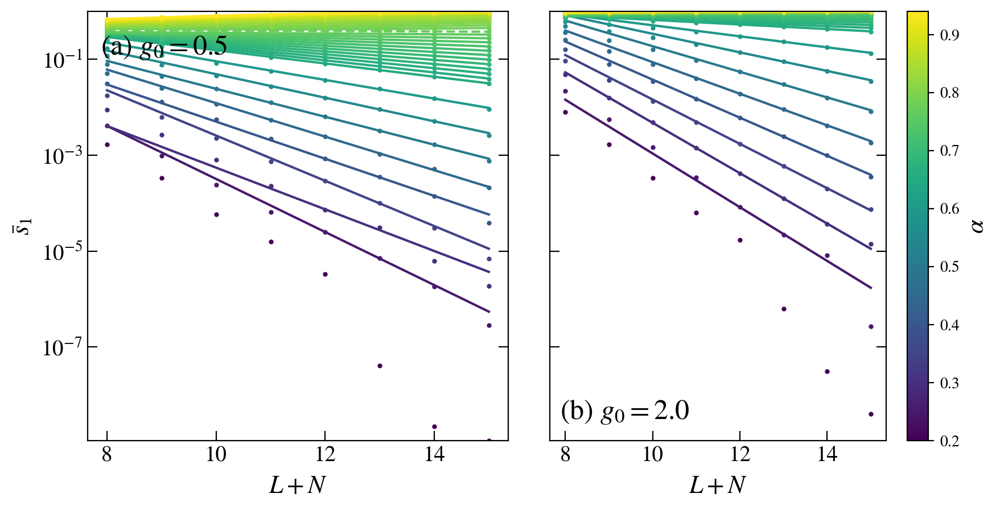

In [928]:
L_total=15

J=2


alfa=1
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

alfa_crit = 0.75
if J == 0.5:    alfa_crit = 0.77
elif J == 1:    alfa_crit = 0.73
elif J == 2:    alfa_crit = 0.72
elif J == 3:    alfa_crit = 0.71
else:           alfa_crit = 1/np.sqrt(2)
sub_sizes = np.arange(0, L+1)

fig, axes = plt.subplots( nrows=1, ncols=2, figsize=(10,5), dpi = 200, sharey=True)
# fig, ax = plt.subplots( nrows=1, ncols=1, figsize=(5,5), dpi = 200)

axis = axes.flatten()

sizes = np.arange(8, 16, 1)

interpolate = 0

p = 1       # number of last spins
nu = 0.5
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
xlab = r"$L+N$"

def pade_fun(x, c1, c2, d1, d2):
    return (x**2 + c1 * x + c2) / (x**2 + d1 * x + d2)

def other_fit(x, c1, c2):
    return np.exp(-c1 * x) * c2
    # return c1 / x**3 + c2 / x**2 + c3 / x + c4

for idx1, J in enumerate([0.5, 2]):
        
    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.77
    elif J == 1:    alfa_crit = 0.73
    elif J == 2:    alfa_crit = 0.72
    elif J == 3:    alfa_crit = 0.71
    else:           alfa_crit = 1/np.sqrt(2)
    interaction = []
    ydata = []
    p = 1
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - p

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
                Sinfo_vN     = np.array(file.get('vN info entropy'))
        else:
            print(name_out)
        alfa_vals_original = alfa_vals

        entropy = entropy[LA] / page(LA, L_total-LA)
        interaction.append(alfa_vals)
        ydata.append(entropy)

    print(alfa_vals)
    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    norm = matplotlib.colors.Normalize(
        vmin=np.min(alfa_vals),
        vmax=np.max(alfa_vals))

    # choose a colormap
    # c_m = matplotlib.cm.cool

    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )

    beta_0 = np.zeros( (alfa_vals.size) )
    new_xx = np.zeros( (alfa_vals.size) )
    
    for ii_a, alfa in enumerate(alfa_vals):
        axis[idx1].plot(sizes, ydata[ii_a], marker='o', markersize=2, lw=0, color=s_m.to_rgba(alfa), ls = '--' if alfa == alfa_crit else '-')
        if interpolate:
            spl = make_spline(sizes, ydata[ii_a])
            xx = np.linspace(sizes[0], sizes[-1], 50)
            yy = spl(xx)
        else:
            xx = sizes
            yy = ydata[ii_a]
        
        my_fit = pade_fun if alfa > alfa_crit else other_fit
        try:
            # xx = xx - N
            pars, pconv = fit(my_fit,
                            xdata = xx[-4:] if alfa < alfa_crit else xx,
                            ydata = yy[-4:] if alfa < alfa_crit else yy)
            # print(alfa, np.diag(pconv)**2)
            aaaa = np.linspace(xx[0], xx[-1], 10000)
            axis[idx1].plot(aaaa, my_fit(aaaa, *pars), lw=1.5, color=s_m.to_rgba(alfa), ls = '--' if alfa == alfa_crit else '-')
            
        except RuntimeError:
            print(alfa)
        
# axis[0].axhline(y=0.3863, ls='--', color='black')
# axis[0].axhline(y=0.5307, ls='--', color='black')
    
    # axis[idx1].set_xlim(7.5, 16.5)

    axis[idx1].set_ylim(None, 1.01)
    fig_help.set_plot_elements(axis[idx1], ylabel=r"$\bar{S}_A^{p=%d}$"%p, xlabel=xlab, font_size=14, set_legend=False, yscale='log')
cbar = fig.colorbar(s_m)
cbar.set_label(r"$\alpha$", fontsize=16)

# axis[1].set_ylim(1e-1, 1.01)
# axis[0].set_ylim(1e-8, 1.01)

fig_help.set_plot_elements(axis[0], ylabel=r"$\bar{s}_{%d}$"%p, xlabel=xlab, font_size=14, set_legend=False)
fig_help.set_legend(axis[0], loc = 'center left', fontsize=12, anchor=(-0.02, 0.35))
fig_help.set_plot_elements(axis[1], ylabel="", xlabel=xlab, font_size=14, set_legend=False)
# fig_help.set_legend(axis[1], loc = 'center left', fontsize=12, anchor=(-0.02, 0.35))
# fig_help.set_plot_elements(axis[2], ylabel=r"$\bar{D}(L)$", xlabel=xlab, font_size=14, set_legend=False)
# fig_help.set_plot_elements(axis[3], ylabel=r"$\bar{S}^{info}_{vN}/(L_{tot}\ln{2})$", xlabel=xlab, font_size=14, set_legend=False)

# for aa in [axis]:
#     for ax in np.array(aa).flatten():
#         ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
#         ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

# axis[0].annotate(r"(a) $r$", fontsize=16, xy=(0.03, 0.08), xycoords='axes fraction')
# axis[1].annotate(r"(b) $\bar{S}^{p=1}$", fontsize=16, xy=(0.03, 0.08), xycoords='axes fraction')
# axis[0].set_title(r"$N=3, \gamma=%.1f$"%(gamma), fontsize=16)
# axis[1].set_title(r"$N=5, \gamma=%.1f$"%(gamma), fontsize=16)

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.03, 0.9), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=2.0$", fontsize=18, xy=(0.03, 0.05), xycoords='axes fraction')
fig.subplots_adjust(wspace = 0.1, hspace=0.05)

## MAIN $g_0$, scaling collapse

No handles with labels found to put in legend.


7 10000.0
8 6800.0
9 6800.0
10 3600.0
11 3600.0
12 1704.0
13 502.0
14 1076.0
15 655.0
16 142.0
[array([0.20096207, 0.19768908, 0.1941962 , 0.19043183, 0.18646303,
       0.18230157, 0.17785866, 0.17333837, 0.16865053, 0.1638561 ,
       0.15881492, 0.15371218, 0.14833897, 0.14284391, 0.13742037,
       0.13190583, 0.12650713, 0.12105316, 0.1155948 , 0.11014394,
       0.10477777, 0.09954872, 0.09447657, 0.08949553, 0.0847637 ,
       0.08019213, 0.07602597, 0.07199176, 0.068222  , 0.06462427]), array([0.20524388, 0.20138403, 0.19732964, 0.19298429, 0.18811947,
       0.18292176, 0.17754656, 0.17195407, 0.16591665, 0.15963088,
       0.15312624, 0.14658275, 0.13971643, 0.13269819, 0.12545981,
       0.11824102, 0.11113473, 0.10412555, 0.09716387, 0.0905685 ,
       0.08403759, 0.0778187 , 0.07191344, 0.06633877, 0.06105231,
       0.05624725, 0.05184106, 0.04780178, 0.04410283, 0.04078404]), array([0.21038495, 0.20601259, 0.20140948, 0.19630404, 0.1907859 ,
       0.18470247, 0.17818987

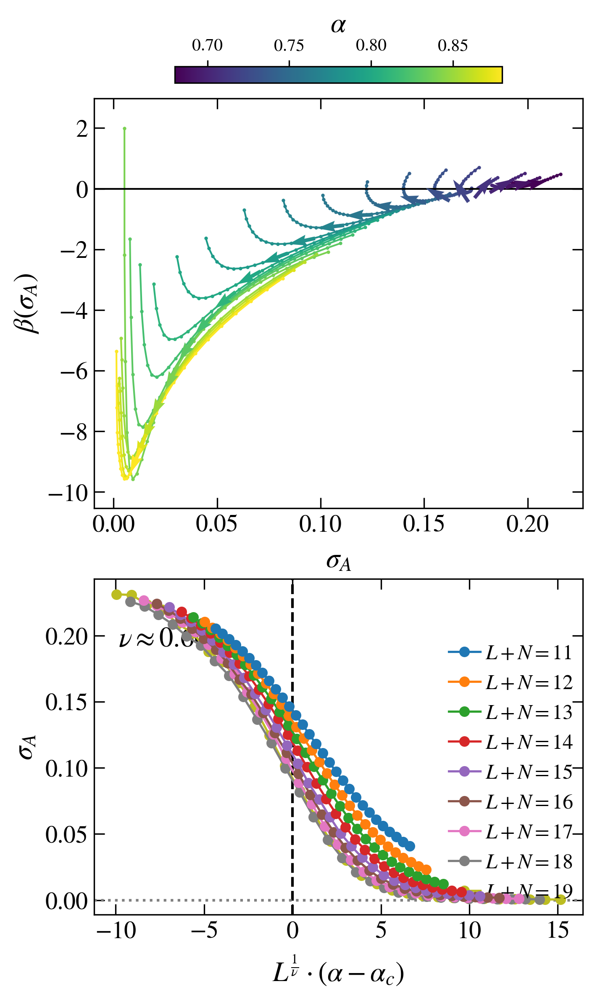

In [116]:
L_total=15
J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

eta_erg = 1
alfa_crit = 0.75
if J == 0.5:    alfa_crit = 0.765;  eta_erg = 0.86
elif J == 1:    alfa_crit = 0.74;   eta_erg = 0.80
elif J == 2:    alfa_crit = 0.72;   eta_erg = 0.78
elif J == 3:    alfa_crit = 0.72;   eta_erg = 0.74
else:           alfa_crit = 1/np.sqrt(2)

sub_sizes = np.arange(0, L+1)
fig = plt.figure(figsize=(5,7), dpi = 300)
fig.subplots_adjust(hspace=0.0)
gs = GridSpec(2, 1, height_ratios = [1, 15]) 
gs1 = GridSpec(1,1)
gs.update(top=0.98, bottom=0.48, hspace=0.02)
gs1.update(top=0.4, bottom=0.02)
a = fig.add_subplot(gs[0])
axes = [fig.add_subplot(gs[1]), fig.add_subplot(gs1[0])]
a.axis('off')

# fig, axes = plt.subplots( nrows=2, ncols=1, figsize=(5,9), dpi = 200)

axis = axes[0]
# inset = axis.inset_axes([0.02, 0.5, 0.01, 0.01])


interpolate = 1
use_fit = 0
bin_size = 10
use_area_collapse = 1

options = ['s', 'r', 'D1', 'x', 'sig']
option = 'sig'
p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

if J == 1.0 and option == 'D1':
    print("no fractal for J=1, choose entropy p=1")
    option = 's'
plot_fractal = (option == 'D1')

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    

def beta0_fun(x, o1 = 0.0, p = 1, c_ = 1, alfa = 0.9, alfac = 0):
    g_ = 1 #+ o1 / (p * np.log(2))
    if use_area_collapse: 
        return -(g_ - x) / x * np.log( (g_ - x) / c_ )
    else:                 return (g_ - x) / x 

def pade_fun(x, c1, c2, d1, d2):
    # return c1 * np.arctan(c2 * x - d1)
    return (x**2 + c1*x + c2) / (x**2 + d1 * x + d2)
    # return c1*np.exp(-c2*x)
    # return 1-(x**2 + c1 * x + c2) / (x**2 + d1 * x + d2)

def other_fit(x, c1, c2, c3, c4):
    # return c1 * np.exp(-c2*x) + c3 * x**(-c4)
    return (c1 / x**3 + c2 / x**2 + c3 / x**1 + c4)
    # return c1 / x**3 + c2 / x**2 + c3 / x**1 + c4 + c5/x**4 + c6 / x**5


sizes = np.arange(10, 20 if J < 3 else 17, 1 if p > 0 else 2)


interaction = []
ydata = []
Sinfo = []
S = []
gaps = []
chi = []
S_fl = []
# Ssite_fl = []
for L_total in sizes:
    L = L_total - N
    LA = L_total  - p if p > 0 else L_total // 2
    LA = N-1
    name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

    if exists(name_out):
        with h5py.File(name_out, "r") as file:
            alfa_vals    = np.array(file.get('interaction'))
            realis       = np.array(file.get('realisations'))
            gap_ratio    = np.array(file.get('gap_ratio'))
            entropy      = np.array(file.get('entropy'))
            entropy_site = np.array(file.get('single_site_entropy'))
            Sinfo_vN     = np.array(file.get('vN info entropy'))
            compress     = 1-np.array(file.get('compressibility'))[0]
            entropy_fluct       = np.array(file.get('entropy state2state'))
            entropy_site_fluct  = np.array(file.get('single_site_entropy state2state'))

            print(L, min(realis))
    else:
        print(name_out)

    ent = entropy_site[LA] / np.log(2) #page(LA, L_total-LA))
    # S = entropy[L_total - 3] + entropy_site[L_total - 4] - entropy[L_total - 4]
    interaction.append(alfa_vals)
    # ydata.append((gap_ratio - 0.3863) / (0.5307 - 0.3863))
    S.append(ent)
    S_fl.append(entropy_fluct[LA])
    Sinfo.append(Sinfo_vN)
    chi.append(compress)
    gaps.append((gap_ratio - 0.3863) / (0.5307 - 0.3863))

alfa_min = 0.68
alfa_max = 0.88

# norm is a class which, when called, can normalize data into the
# [0.0, 1.0] interval.
norm = matplotlib.colors.Normalize(
    vmin=alfa_min,
    vmax=alfa_max)

print(S_fl)

# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
s_m.set_array([])

if option == 's':    _ydata = S
elif option == 'D1': _ydata = Sinfo
elif option == 'r':  _ydata = gaps
elif option == 'x':  _ydata = chi
elif option == 'sig':  _ydata = S_fl
else:
    print("Not chosen any data")

alfa_dense = alfa_vals#np.linspace(alfa_vals[0], alfa_vals[-1], alfa_vals.size + (alfa_vals.size-1) * 4)
ydata = np.zeros((sizes.size, alfa_dense.size));  ydata.fill(np.nan)
for ii, L_total in enumerate(sizes):
    f = splrep(alfa_vals, _ydata[ii], k=3, s=0)
    ydata[ii] = splev(alfa_dense, f)

alfa_vals = alfa_dense
ydata = np.transpose( np.array(ydata) )

idx_c = 0
# alfa_crit = 1.5

envelope_ydata = []
envelope_xdata = []
yax_max = -10
yax_min = 10
for ii_a, alfa in enumerate(alfa_vals):
    if alfa < alfa_min or alfa > alfa_max: continue
    if alfa == alfa_crit: idx_c = ii_a
    # col = 'red' if alfa==alfa_crit else s_m.to_rgba(alfa)
    col = s_m.to_rgba(alfa)
    xx = sizes
    yy = ydata[ii_a]
    if plot_fractal:
        f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.08 else 3, s=10)
        yy = splev(xx, f)
        
        D1 = np.diff(yy) / np.log(2)
        yy = D1 #( D1[:-1] + D1[1:] ) / 2.0
        xx = sizes[:-1]
        print(xx, yy)
    
    if interpolate:
        # print(alfa, xx, yy)
        f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.08 else 5, s=10)
        xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
        yy = splev(xx, f)
        
    
    # if alfa >= alfa_min and option == 's':
    #     pars, pconv = fit(power_law,
    #                     xdata = 2**xx[-4:],
    #                     ydata = 1 - yy[-4:],
    #                     )
    #     eta = -pars[0]
    #     c = pars[1]
    #     sp = np.linspace(0.0, 1, 1000)
    #     # print(alfa, eta)
    #     if use_area_collapse:   
    #         axis.plot(sp, 1./1 * beta0_fun(sp, o1=0, p=p, c_=c, alfa=alfa, alfac=alfa_crit), lw=0.5, color=col, ls='-.')
    #         inset.plot(sp, 1./1 * beta0_fun(sp, o1=0, p=p, c_=c, alfa=alfa, alfac=alfa_crit), lw=0.5, color=col, ls='-.')
    #     else:
    #         axis.plot(sp, eta * beta0_fun(sp, o1=0, p=p, c_=0),    lw=0.5, color=col, ls='-.')
    #         inset.plot(sp, eta * beta0_fun(sp, o1=0, p=p, c_=0),    lw=0.5, color=col, ls='-.')
    
    if not use_fit:
        # f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.08 else 3, s=1)
        # xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
        # yy = splev(xx, f)
        # yy = 1 / (1 - yy)
        # if use_area_collapse: xx = np.log(xx)
        # if use_area_collapse: xx = np.log(xx)
        beta = diff_central(np.log(xx), np.log(yy))# * xx[1:-1] / yy[1:-1]
        xx_beta = yy[1:-1]
        
        envelope_ydata.append(beta[-1])
        envelope_xdata.append(xx_beta[-1])
        
        axis.plot(xx_beta, beta, marker='o', markersize=1, lw=1, color=col)
        inset.plot(xx_beta, beta, marker='o', markersize=1, lw=1, color=col)
        if min(beta) < yax_min: yax_min = min(beta)
        if max(beta) > yax_max: yax_max = max(beta)

        i1 = xx_beta.size // 2
        u = xx_beta[i1+1] - xx_beta[i1]
        v = beta[i1+1] - beta[i1]
        pos_x = xx_beta[i1] + u/2
        pos_y = beta[i1] + v/2
        norm = np.sqrt(u**2+v**2) / 5.

        axis.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
        inset.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
    else:
        my_fit = pade_fun if alfa <= alfa_crit else other_fit
        my_fit = other_fit
        pars, pconv = fit(my_fit,
                            xdata = xx,
                            ydata = yy,
                            maxfev = 10000)
        dense_sizes = np.linspace(xx[0], xx[-1], 100)
        smooth_data = (my_fit(dense_sizes, *pars))
        # spl = make_spline(xx, yy, k=3)
        # xx = np.linspace(xx[0], 2*xx[-1], 100)
        # smooth_data = spl(xx)
        deriv = diff_central(np.log(dense_sizes), np.log(smooth_data))
        smooth_data = smooth_data[1:-1]

        axis.plot(smooth_data, deriv, lw=1.5, color=col)
        if alfa >= alfa_min:
            inset.plot(smooth_data, deriv, lw=1, color=col)

        if min(deriv) < yax_min: yax_min = min(deriv)
        if max(deriv) > yax_max: yax_max = max(deriv)
        # spline = InterpolateSpline(sizes, ydata[ii_a], k=5, s=0)
        # spl_deriv = spline.derivative(n=1)
        # aaaa = np.linspace(sizes[0], sizes[-1], 100)
        # smooth_data = spline(aaaa)
        # deriv = spl_deriv(aaaa)
        
        # envelope_ydata = [*envelope_ydata, deriv[-1]]
        # envelope_xdata = [*envelope_xdata, smooth_data[-1]]
        envelope_ydata = [*envelope_ydata, *deriv]
        envelope_xdata = [*envelope_xdata, *smooth_data]

        i1 = smooth_data.size // 2
        u = smooth_data[i1+1] - smooth_data[i1]
        v = deriv[i1+1] - deriv[i1]
        pos_x = smooth_data[i1] + u/2
        pos_y = deriv[i1] + v/2
        norm = np.sqrt(u**2+v**2)
    
        axis.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0,
                     width=0.005, headwidth=6)
        
        if alfa >= alfa_min:
            u = (smooth_data[i1+1]) - (smooth_data[i1])
            v = deriv[i1+1] - deriv[i1]
            pos_x = smooth_data[i1] + u/2
            pos_y = deriv[i1] + v/2
            norm = np.sqrt(u**2+v**2)
            inset.quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0,
                        width=0.005, headwidth=10)

# sorting X and Y data according to increasing X
# permut = np.argsort( np.array(envelope_xdata) )
# envelope_ydata = np.array(envelope_ydata)[permut]
# envelope_xdata = np.array(envelope_xdata)[permut]

# size = len(envelope_xdata)
# envelope = np.zeros( (size // bin_size) )
# xxx = np.zeros( (size // bin_size) )
# print("NUm of bins", (size // bin_size))
# # print(envelope_xdata, envelope_ydata)
# # Finding maximum Y in each bin of 20 points of interpolated data
# for k in range(envelope.size):
#     idx_r = (k+1) * bin_size if k < envelope.size-1 else -1
#     idx = np.argmax(envelope_ydata[k * bin_size : idx_r])
#     envelope[k] = envelope_ydata[k * bin_size : idx_r][idx]
#     xxx[k]      = envelope_xdata[k * bin_size : idx_r][idx]

# # xxx = envelope_xdata
# # envelope = envelope_ydata
# # axis[idx1].plot(xxx, envelope, lw=2, color='k', ls='--')

# def envelope_polynomial(_x, c1, c2, c3, c4, c5, c6, c7):#, c8, c9, c10):
#     x = 1 - _x
#     return c1 * (x) + c2 * (x)**2 + c3 * (x)**4 + c4 * (x)**4 + c5 * (x)**5 + c6 * (x)**6 + c7 # * (x-1)**7 + c8 * (x-1)**8 + c9 * (x-1)**9 + c10 * (x-1)**10

# def envelope_ansatz(x, A, B, C):
#     return -(1 - x) * np.log(1 - x) + A * (1 - x) + C*np.log(x) + B * (1 - x)*x

# sp_cut = 0.9 if J < 0.9 else (0.8 if J < 1.9 else 0.9)
# indices = np.transpose(np.argwhere(xxx < sp_cut))[0]
# # print(indices)
# xx_sc = xxx[indices]
# env_sc = envelope[indices]
# # axis.scatter((xx_sc)[xx_sc > 0.1], (env_sc)[xx_sc > 0.1], color='black', s=20)
# axis.scatter(xxx, envelope, color='black', s=10)
# pars, pconv = fit(envelope_polynomial,
#                     xdata = xxx[indices],
#                     ydata = envelope[indices])

# sp = np.linspace(0.1, sp_cut, 10000)
# envelope_fit = envelope_polynomial(sp, *pars)
# axis.plot(sp, envelope_fit, lw=1, color='k', ls='--', label=r"$\tilde{\beta}_{poly}$" if use_area_collapse else r"${\beta}_{poly}$")
# # inset.plot(sp, envelope_polynomial(sp, *pars), lw=1, color='k', ls='--')
# Sc_idx = np.argwhere(np.abs(envelope_fit) < 1e-2)[0][0]

# def linearize_at_transition(x, a, Sc):
#     return a * (x - Sc)
# # print(Sc_idx, envelope[Sc_idx - 20 : Sc_idx + 20])
# pars, pconv = fit(linearize_at_transition,
#                     xdata = sp[Sc_idx - 100 : Sc_idx + 100],
#                     ydata = envelope_fit[Sc_idx - 100 : Sc_idx + 100])

# nu_exp = 1. / (pars[0] * pars[1])
# Sc = pars[1]
# print("nu=", nu_exp, 1./nu_exp)
# sp = sp[Sc_idx - 2000 : Sc_idx + 2000]
# axis.plot(sp, linearize_at_transition(sp, *pars), lw=1, color='gray', ls='-')

# pars2, pconv2 = fit(envelope_ansatz,
#                     xdata = xxx,#[envelope        > -0.25],
#                     ydata = envelope)#[envelope   > -0.25])

# sp = np.linspace(0., 1, 10000)
# axis.plot(np.nan, np.nan, lw=1, color='k', ls='-.', label=r"$\tilde{\beta}_{tp}$ Eq.(S63)" if use_area_collapse else r"${\beta}_{tp} Eq.(S56)$")

# if use_area_collapse:
#     axis.plot(sp, envelope_ansatz(sp, 0, 0, 0), lw=1, color='r', ls=':', label=r"$\tilde{\beta}_{sp} Eq.(S62)$" if use_area_collapse else r"${\beta}_{sp} Eq.(S62)$")
#     inset.plot(sp, envelope_ansatz(sp, 0, 0, 0), lw=1, color='r', ls=':')

# print("ANSATZ:", *pars2)
# axis.plot(sp, envelope_ansatz(sp, *pars2), lw=1, color='r', ls='--', label=r"$\tilde{\beta}_{ans}$" if use_area_collapse else r"${\beta}_{ans}$")
# inset.plot(sp, envelope_ansatz(sp, *pars2), lw=1, color='r', ls='--')
nu_exp=0.66
sp = np.linspace((min(ydata.flatten())), (max(ydata.flatten())), 10000)
axis.plot(sp, 1/nu_exp * np.log(sp - 1), ls='--', c='k')

# nu_exp = 0.5
# Sc = 0.3407
sp = np.linspace(0.7, 1.0)
# axis.plot(sp, 1-sp, ls=':', c='gray')
# inset.plot(sp, 1-sp, ls=':', c='gray', label=r"$\bar{s}_p$")

if J == 0.5: inset.set_xlim(0.52, 1.0)
if J == 1:   inset.set_xlim(0.6, 1.0)
if J == 2:   inset.set_xlim(0.91, 1.0)
if J == 3:   inset.set_xlim(0.94, 1.0)
# inset.set_xlim(sp_cut, 1.0)
inset.set_ylim(-0.2, 1.2*yax_max)
# axis.set_xlim(None, 1.0)
axis.set_ylim(1.1*yax_min, 1.5*yax_max)

# axis.set_ylim(-0.02, 0.06)
# axis.set_xlim(0.5, 1.0)
axis.axhline(y=0, ls='-', c='k', lw=1)
inset.axhline(y=0, ls='-', c='k', lw=1)

tmp = r"$\bar{s}_A^{L_A=N}$" if J == 1 else r"$X=D_1$"
xlab = r"$\bar{s}_{%d}$"%p
if option == 's':       xlab = r"$\bar{s}_{%d}$"%p if p > 0 else r"$\bar{s}_A$"
elif option == 'D1':    xlab = r"$\bar{D}$"
elif option == 'r':     xlab = r"$\bar{\phi}$"
elif option == 'x':     xlab = r"$\bar{\chi}$"
elif option == 'sig':     xlab = r"${\sigma}_A$"
else: xlab = r"$A$"

# xlab = r"$X=\bar{\phi}$"

ylab = r"${\beta}($" + xlab + "$)$"
fig_help.set_plot_elements(axis, xlabel=xlab, ylabel=ylab, font_size=14, set_legend=False, xscale='linear')
fig_help.set_legend(axis, loc = 'upper left', fontsize=12)

fig_help.set_plot_elements(inset, xlabel=xlab, ylabel=ylab, font_size=14, set_legend=False)#, xscale='log', yscale='log')
fig_help.set_legend(inset, loc = 'upper left', fontsize=12)

inset.xaxis.set_label_position("top")
inset.xaxis.set_label_coords(.5, 1.2)
inset.xaxis.tick_top()


# SECOND PLOT
inset = axes[1]
plot_collapsed = 1

ydata_new = ydata
if plot_fractal:
    ydata_new = np.zeros( (alfa_vals.size, sizes.size - 1))
    for ii_a, alfa in enumerate(alfa_vals):
        yy = ydata[ii_a]
        xx = sizes - N
        f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.08 else 5, s=2)
        yy = splev(xx, f)
        D1_tmp = np.diff(yy) / np.log(2)
        ydata_new[ii_a] = D1_tmp #(D1_tmp[1:] + D1_tmp[:-1])/2.
        
ydata_new = np.transpose( np.array(ydata_new) )
_Sc = 0
counttt = 0
xx = sizes[:-2] if plot_fractal else sizes
for ii, L in enumerate(xx - N):
    if L+N > 10:
        if use_area_collapse: x_collapsed = (L+N)**(1/nu_exp) * (alfa_vals - alfa_crit)
        else:                 x_collapsed = 2**( (L+N)/nu_exp ) * (alfa_vals - alfa_crit)
        # y_collapsed = 2**(-(L+N)/nu_exp) * (ydata[ii] - Sc)
        # y_collapsed = (L+N)**(-1/nu_exp) * (ydata[ii] - Sc)
        idx = (np.abs(x_collapsed)).argmin()
        # _Sc += ydata_new[ii][idx]
        counttt += 1
        if plot_collapsed: 
            inset.plot(x_collapsed, ydata_new[ii], marker='o', markersize=5, lw=1.25, label=r"$L+N=%d$"%(L+N),     zorder=20 - L)
            # inset.plot(interaction[ii], y_collapsed, marker='o', markersize=2, lw=0.75, label=r"$L+N=%d$"%(L+N),     zorder=20 - L)
        else:
            inset.plot(interaction[ii], ydata_new[ii], marker='o', markersize=5, lw=1.25, label=r"$L+N=%d$"%(L+N), zorder=20 - L)

inset.axvline(x=0 if plot_collapsed else alfa_crit, ls='--', c='k')
_Sc = _Sc / counttt
print(_Sc)
# axis.plot(xxx, _Sc / nu_exp * (xxx - _Sc), lw=1, color='blue', ls='-')

inset.axhline(y=_Sc, ls=':', c='gray')

xlabbb = r"${L}^{\frac{1}{\nu}}\cdot(\alpha-\alpha_c)$" if use_area_collapse else r"$\mathcal{D}^{\frac{1}{\nu}}\cdot(\alpha-\alpha_c)$"
fig_help.set_plot_elements(inset, ylabel=xlab, xlabel=xlabbb if plot_collapsed else r"$\alpha$", font_size=14, set_legend=False, yscale='linear')#, ylim=(0,1))
# fig_help.set_plot_elements(inset, ylabel=xlab, xlabel=r"$(L+N)^{\frac{1}{\nu}}\cdot(\alpha-\alpha_c)$" if plot_collapsed else r"$\alpha$", font_size=14, set_legend=False)#, ylim=(0,1))
# fig_help.set_plot_elements(inset, ylabel=r"$(L+N)^{-\frac{1}{\nu}}\cdot(\bar{s}_1-s_1^c)$" if plot_collapsed else xlab, xlabel=r"$\alpha$", font_size=10, set_legend=False)#, ylim=(0,1))
fig_help.set_legend(inset, loc = 'lower right', fontsize=12)

cbar = fig.colorbar(s_m, ax=a, location='top', fraction = 0.6)
cbar.set_label(r"$\alpha$", fontsize=16)


fig.subplots_adjust(wspace = 0.25, hspace=0.25)


axes[1].annotate(r"$\nu\approx%.2f$"%nu_exp, fontsize=16, xy=(0.05, 0.8), xycoords='axes fraction')

# axes[0].annotate("(a)", fontsize=16, xy=(0.03, 0.9), xycoords='axes fraction')
# axes[1].annotate("(b)", fontsize=16, xy=(0.9, 0.05), xycoords='axes fraction')
if use_area_collapse:
    plt.savefig("plots_beta/Fig1_area.pdf", bbox_inches = 'tight', pad_inches=0.02)
    plt.savefig("plots_beta/Fig1_area.png", bbox_inches = 'tight', pad_inches=0.02)
else:
    plt.savefig("plots_beta/Fig1.pdf", bbox_inches = 'tight', pad_inches=0.02)
    plt.savefig("plots_beta/Fig1.png", bbox_inches = 'tight', pad_inches=0.02)




# higher order polynomial for beta fitting
# test ansatz for beta tilde at s_p=1x

10 2 0
2 10 [0.85789245 0.86200798 0.86618492 0.87045302 0.87471834 0.87907835
 0.88348472 0.88787663 0.8923158  0.89671032 0.90111174 0.90545502
 0.90982149 0.91408426 0.91829582 0.92246761 0.9264644  0.93035283
 0.93413506 0.93783411 0.94136372 0.94475084 0.94799734 0.95107318
 0.9539752  0.95670481 0.95924663 0.96166437 0.96390956 0.96598548]
11 2 0
2 11 [0.86124094 0.865873   0.87059346 0.87540669 0.8805241  0.88550177
 0.89053529 0.89559733 0.90073999 0.90584441 0.9109596  0.9160022
 0.92106046 0.92600311 0.93087436 0.93560195 0.94016027 0.94457965
 0.94878209 0.9527367  0.95648619 0.96000875 0.9632416  0.96627529
 0.96905742 0.97162089 0.9739087  0.97600484 0.97789188 0.97958829]
12 2 0
2 12 [0.86271353 0.86782238 0.87306854 0.8784518  0.88396611 0.88963728
 0.89541484 0.90125662 0.90714542 0.91310857 0.9190248  0.92483775
 0.93056881 0.93616599 0.94163771 0.94690547 0.95187992 0.95659783
 0.96097979 0.96506378 0.96877979 0.97220759 0.97524034 0.97799132
 0.98041786 0.98253457 0.

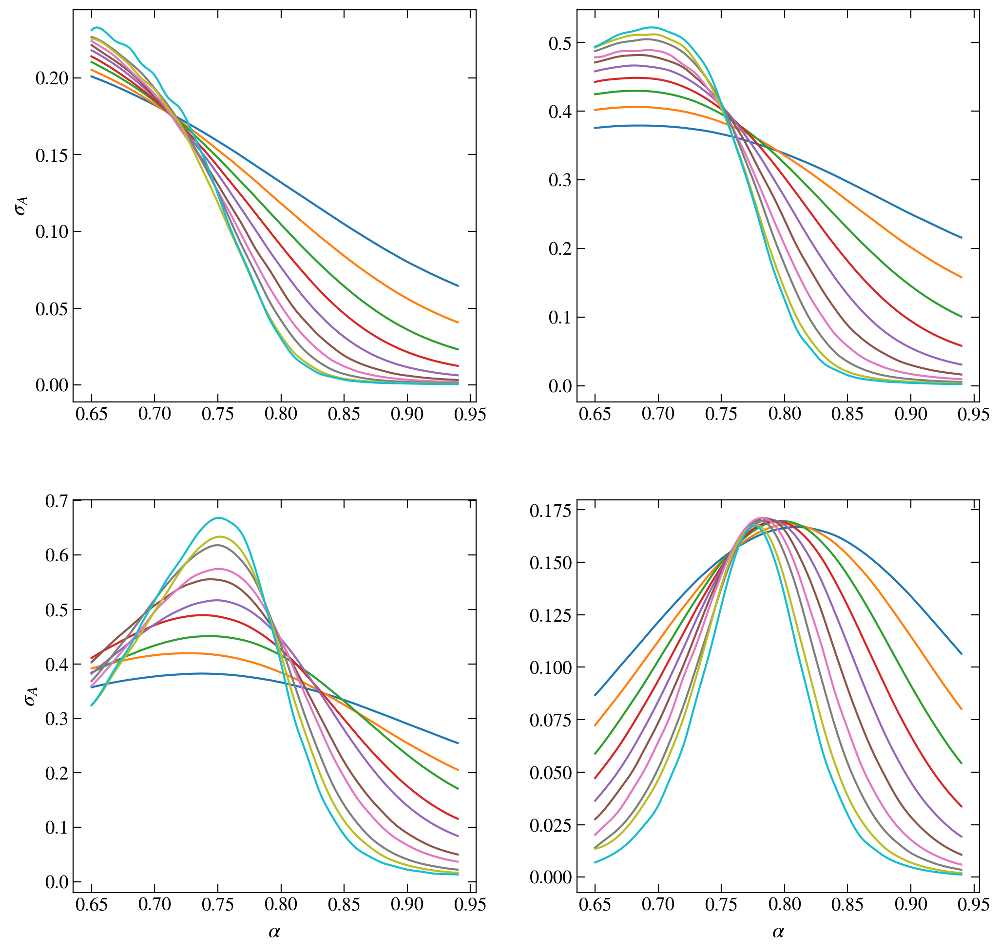

In [110]:
L_total=15
J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

eta_erg = 1
alfa_crit = 0.75
if J == 0.5:    alfa_crit = 0.765;  eta_erg = 0.86
elif J == 1:    alfa_crit = 0.74;   eta_erg = 0.80
elif J == 2:    alfa_crit = 0.72;   eta_erg = 0.78
elif J == 3:    alfa_crit = 0.72;   eta_erg = 0.74
else:           alfa_crit = 1/np.sqrt(2)

sub_sizes = np.arange(0, L+1)
fig, axes = plt.subplots( nrows=2, ncols=2, figsize=(12,12), dpi = 200)
axes = axes.flatten()

options = ['s', 'x', 'sig']
option = 'sig'
p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

if J == 1.0 and option == 'D1':
    print("no fractal for J=1, choose entropy p=1")
    option = 's'
plot_fractal = (option == 'D1')

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    

sizes = np.arange(10, 20 if J < 3 else 17, 1 if p > 0 else 2)

subsizes = [lambda L: N-1, lambda L: N+1, lambda L: L//2, lambda L: L-1]

# Ssite_fl = []
for ii_ax, ax in enumerate(axes):
    axis = axes[ii_ax]
    
    _ydata = []
    interaction = []
    S = []
    chi = []
    S_fl = []
    for L_total in sizes:
        L = L_total - N
        # LA = L_total  - p if p > 0 else L_total // 2
        LA = subsizes[ii_ax](L_total)
        print(L_total, LA, ii_ax)
        
        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                realis       = np.array(file.get('realisations'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
                compress     = 1-np.array(file.get('compressibility'))[ii_ax]
                entropy_fluct       = np.array(file.get('entropy state2state'))
                entropy_site_fluct  = np.array(file.get('single_site_entropy state2state'))

        else:
            print(name_out)

        ent = entropy_site[LA] / np.log(2) #page(LA, L_total-LA))
        print(LA, L_total, ent)
        interaction.append(alfa_vals)
        S.append(ent)
        S_fl.append(entropy_fluct[LA])
        chi.append(compress)

    if option == 's':      _ydata = S
    elif option == 'x':    _ydata = chi
    elif option == 'sig':  _ydata = S_fl
    else:
        print("Not chosen any data")
    alfa_dense = np.linspace(alfa_vals[0], alfa_vals[-1], alfa_vals.size + (alfa_vals.size-1) * 4)
    ydata = np.zeros((sizes.size, alfa_dense.size));  ydata.fill(np.nan)
    for ii, L_total in enumerate(sizes):
        f = splrep(alfa_vals, _ydata[ii], k=3, s=0)
        ydata[ii] = splev(alfa_dense, f)

    alfa_vals = alfa_dense
    # ydata = np.transpose( np.array(ydata) )
    
    for ii_L, L_total in enumerate(sizes):
        axis.plot(alfa_dense, ydata[ii_L])
        
    ylab = r"$\sigma_A$"
    xlab = r"$\alpha$"
    fig_help.set_plot_elements(axis, xlabel=xlab if ii_ax > 1 else "", ylabel=ylab if ii_ax%2 == 0 else "", font_size=14, set_legend=False, xscale='linear')

fig.subplots_adjust(wspace = 0.25, hspace=0.25)


10 3 0
3 10 [0.63053109 0.63902722 0.64793571 0.65692155 0.66608446 0.67549726
 0.68501056 0.69475247 0.70466493 0.71450858 0.7245511  0.73454077
 0.74460911 0.75453396 0.76442156 0.77436659 0.78392887 0.79335718
 0.80257132 0.81165676 0.82041159 0.82873198 0.83694092 0.84470923
 0.85214639 0.85914995 0.86573496 0.87202023 0.87793864 0.88356922]
11 3 0
3 11 [0.63320329 0.64335531 0.65367699 0.66431229 0.67571308 0.68704794
 0.69861022 0.71039362 0.72240257 0.73468721 0.74696104 0.75940394
 0.77182111 0.78412753 0.79636413 0.80824858 0.82000904 0.8314573
 0.84257994 0.85313488 0.86322577 0.87285144 0.8817974  0.89026131
 0.89804498 0.90527786 0.91161745 0.91766209 0.92318094 0.92808339]
12 3 0
3 12 [0.63540433 0.64670172 0.65856339 0.67083341 0.68363967 0.69691788
 0.71063828 0.7250483  0.73938601 0.75402885 0.76871848 0.78347958
 0.79825754 0.81279153 0.82713921 0.84122455 0.85471912 0.86764434
 0.87977164 0.89125325 0.90178211 0.91158519 0.92044303 0.92851805
 0.93567021 0.94193457 0.

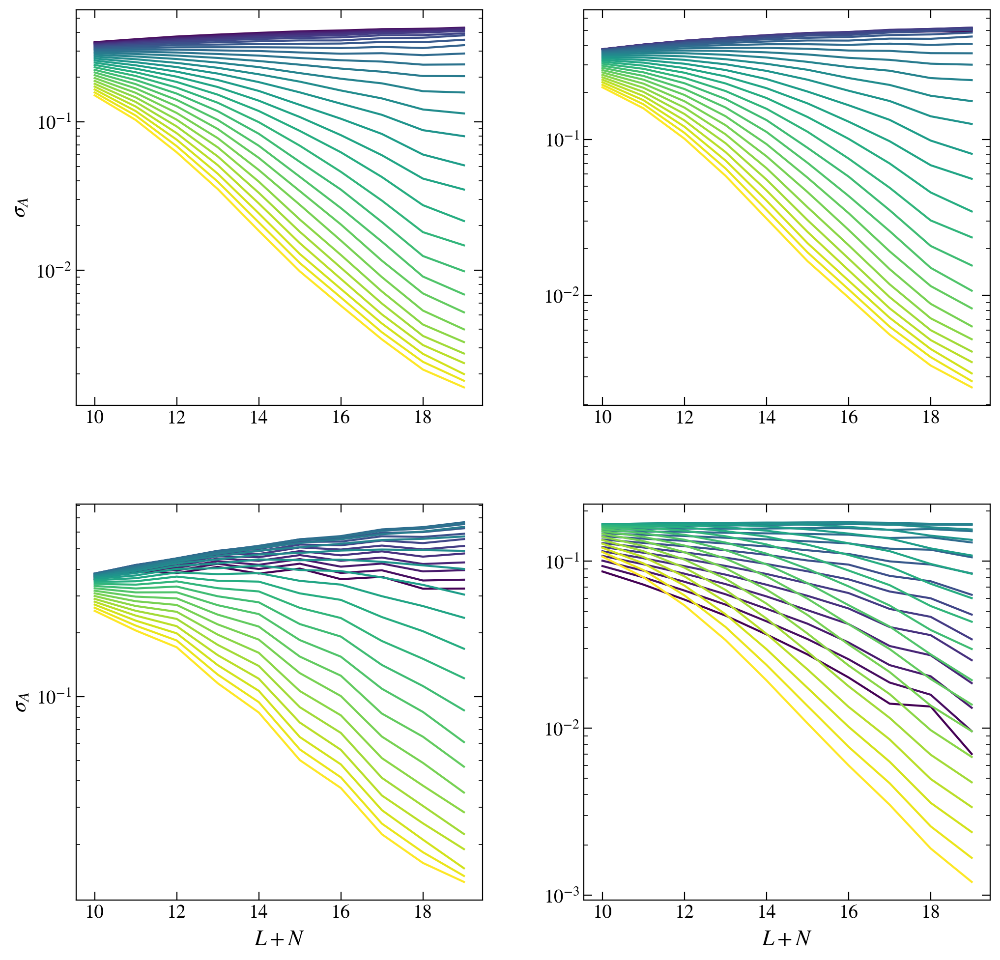

In [96]:
L_total=15
J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 0

eta_erg = 1
alfa_crit = 0.75
if J == 0.5:    alfa_crit = 0.765;  eta_erg = 0.86
elif J == 1:    alfa_crit = 0.74;   eta_erg = 0.80
elif J == 2:    alfa_crit = 0.72;   eta_erg = 0.78
elif J == 3:    alfa_crit = 0.72;   eta_erg = 0.74
else:           alfa_crit = 1/np.sqrt(2)

sub_sizes = np.arange(0, L+1)
fig, axes = plt.subplots( nrows=2, ncols=2, figsize=(12,12), dpi = 200)
axes = axes.flatten()

options = ['s', 'x', 'sig']
option = 'sig'
p = 1       # number of last spins
nu = 500
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

if J == 1.0 and option == 'D1':
    print("no fractal for J=1, choose entropy p=1")
    option = 's'
plot_fractal = (option == 'D1')

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    

sizes = np.arange(10, 20 if J < 3 else 17, 1 if p > 0 else 2)

subsizes = [lambda L: N, lambda L: N+1, lambda L: L//2, lambda L: L-1]

# Ssite_fl = []
for ii_ax, ax in enumerate(axes):
    axis = axes[ii_ax]
    
    _ydata = []
    interaction = []
    S = []
    chi = []
    S_fl = []
    for L_total in sizes:
        L = L_total - N
        # LA = L_total  - p if p > 0 else L_total // 2
        LA = subsizes[ii_ax](L_total)
        print(L_total, LA, ii_ax)
        
        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,w=%g.hdf5"%(L, N, J, gamma, w)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals    = np.array(file.get('interaction'))
                realis       = np.array(file.get('realisations'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
                compress     = 1-np.array(file.get('compressibility'))[ii_ax]
                entropy_fluct       = np.array(file.get('entropy state2state'))
                entropy_site_fluct  = np.array(file.get('single_site_entropy state2state'))

        else:
            print(name_out)

        ent = entropy_site[LA] / np.log(2) #page(LA, L_total-LA))
        print(LA, L_total, ent)
        interaction.append(alfa_vals)
        S.append(ent)
        S_fl.append(entropy_fluct[LA])
        chi.append(compress)

    if option == 's':      _ydata = S
    elif option == 'x':    _ydata = chi
    elif option == 'sig':  _ydata = S_fl
    else:
        print("Not chosen any data")
    alfa_dense = alfa_vals#np.linspace(alfa_vals[0], alfa_vals[-1], alfa_vals.size + (alfa_vals.size-1) * 4)
    ydata = np.zeros((sizes.size, alfa_dense.size));  ydata.fill(np.nan)
    for ii, L_total in enumerate(sizes):
        f = splrep(alfa_vals, _ydata[ii], k=3, s=0)
        ydata[ii] = splev(alfa_dense, f)

    alfa_vals = alfa_dense
    
        
    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    norm = matplotlib.colors.Normalize(
        vmin=min(alfa_vals),
        vmax=max(alfa_vals))
    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])
    
    ydata = np.transpose( np.array(ydata) )
    for ii_a, alfa in enumerate(alfa_vals):
        axis.plot(sizes, ydata[ii_a], color=s_m.to_rgba(alfa))
        
    ylab = r"$\sigma_A$"
    xlab = r"$L+N$"
    fig_help.set_plot_elements(axis, xlabel=xlab if ii_ax > 1 else "", ylabel=ylab if ii_ax%2 == 0 else "", font_size=14, set_legend=False, yscale='log')

fig.subplots_adjust(wspace = 0.25, hspace=0.25)


In [273]:
print(2**18)
print(binom(20,10))

262144
184756.0


## SPECTRAL FORM FACTOR

0.5 0.78
1.0 0.74
2.0 0.72
3.0 0.71


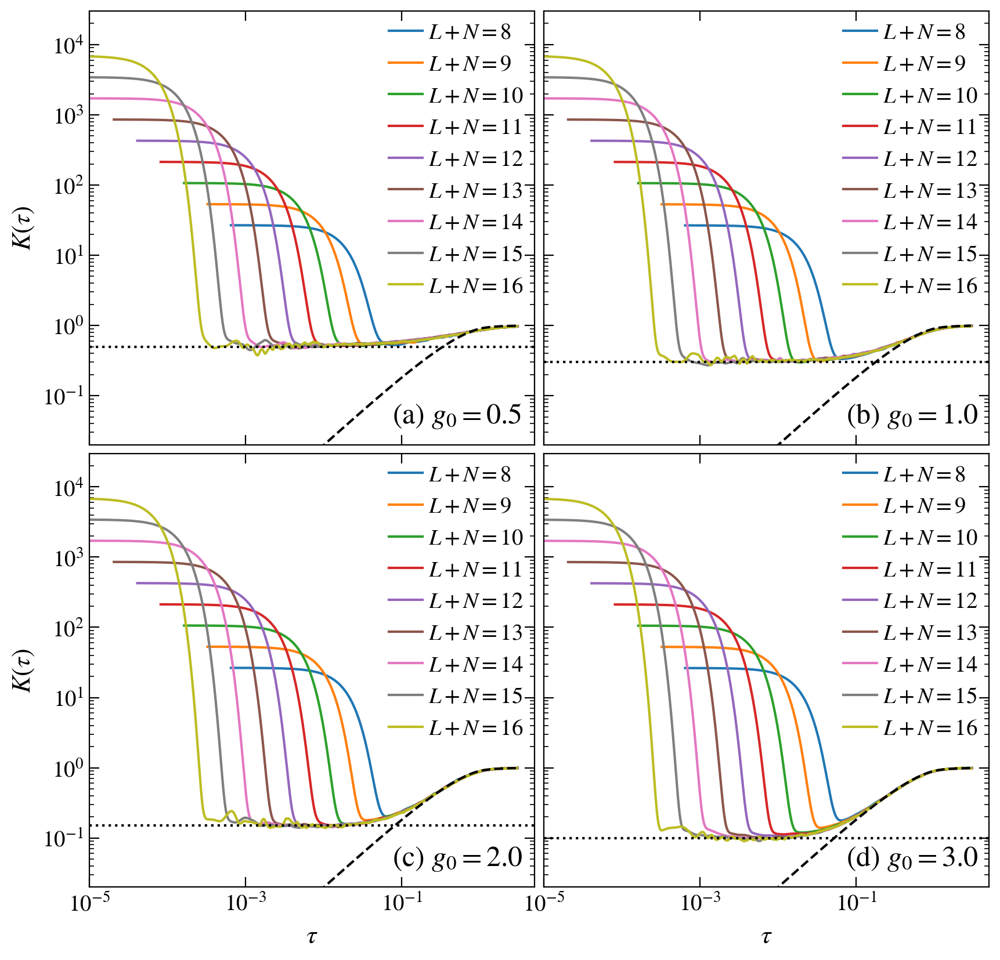

In [162]:
L_total=15
N=3

J=1.0
alfa=0.75
h=1.0
w=0.5
zeta=0.2
gamma=1.0
ini_ave=1
L = L_total - N
scaled_disorder=0

bucket = 50
folded = 0
running_mean = 1
eta=0.1

fig, axis = plt.subplots( nrows=2, ncols=2, figsize=(10,10), dpi = 200, sharex=True, sharey=True)
axis = axis.flatten()
sizes = np.arange(8, 17, 1)

for ii_J, J in enumerate([0.5, 1.0, 2.0, 3.0]):
    alfa = 0.75
    if J == 0.5:    alfa = 0.78
    elif J == 1:    alfa = 0.74
    elif J == 2:    alfa = 0.72
    elif J == 3:    alfa = 0.71
    else:           alfa = 0.71
    print(J, alfa)
    for L_total in sizes:
        L = L_total - N
        name = base_dir + 'SpectralFormFactor/' + info(L=L, N=N, J=J, gamma=gamma, zeta=zeta, alfa=alfa, h=h, w=w, ini_ave=ini_ave, ext='.hdf5', scaled_disorder=scaled_disorder)
        if exists(name):
            with h5py.File(name, "r") as file:
                tHtyp = np.array(file.get('tH_typ'))[0]  / (2 * np.pi)
                times = np.array(file.get('times_fold')) / tHtyp if folded else np.array(file.get('times'))
                sff = np.array(file.get('sff_fold' if folded else "sff_eta=%.1f"%eta))
                try:
                    if sff.shape == (1, 5000):
                        sff = sff[0]
                        times = times[0]
                        # print(w, L, sff.shape)
                    if running_mean: 
                        sff = tools.remove_fluctuations(sff, bucket)
                        sff = sff[bucket // 2 : -bucket // 2]
                        times = times[bucket // 2 : -bucket // 2]
                        # f = splrep(times, sff, k=3, s=5)
                        # sff = splev(times, f)
                    axis[ii_J].plot(times, sff, label=r"$L+N=%d$"%(L+N))
                except TypeError:
                    print("Old file", name)
        else:
            print(name)
    axis[ii_J].plot(times, goe.spectral_form_factor(times), ls='--', c='k')
    # axis[0].set_ylim(0.38,0.54)

    # axis[1].set_ylim(0.3 + 0.1*iabc,0.9)

    fig_help.set_plot_elements(axis[ii_J], ylabel=r"$K(\tau)$" if ii_J%2==0 else "", xlabel=r"$\tau$" if ii_J>1 else "", font_size=14, set_legend=False, xscale='log', yscale='log', ylim=(2e-2,3e4), xlim=(1e-5, 5))
    fig_help.set_legend(axis[ii_J], loc = 'upper right', fontsize=14, ncol=1)

axis[0].axhline(y=0.5, ls=':', c='k')
axis[1].axhline(y=0.3, ls=':', c='k')
axis[2].axhline(y=0.15, ls=':', c='k')
axis[3].axhline(y=0.1, ls=':', c='k')

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.68, 0.05), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0$", fontsize=18, xy=(0.68, 0.05), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0$", fontsize=18, xy=(0.68, 0.05), xycoords='axes fraction')
axis[3].annotate(r"(d) $g_0=3.0$", fontsize=18, xy=(0.68, 0.05), xycoords='axes fraction')
# fig_help.set_plot_elements(axis[1], ylabel=r"$\left\langle\bar{S}_A^{\ell}\right\rangle$", xlabel=rescale_func_names[iabc], font_size=14, set_legend=False)


fig.subplots_adjust(wspace = 0.02, hspace=0.02)
# plt.savefig("plots/Fig1.pdf", bbox_inches = 'tight', pad_inches=0.02)
# plt.savefig("plots/Fig1.png", bbox_inches = 'tight', pad_inches=0.02)

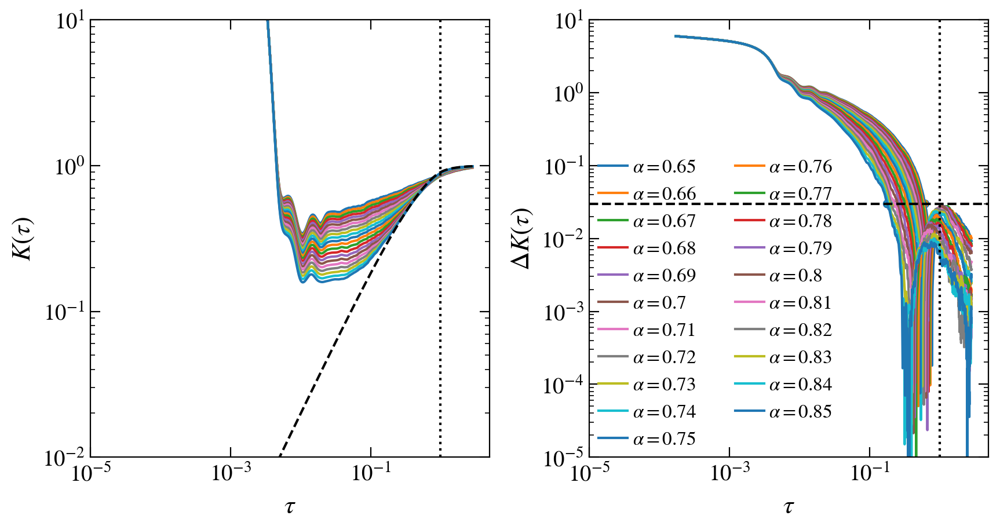

In [458]:
L_total=10
N=3

J=1.0
alfa=0.75
h=1.0
w=0.5
zeta=0.2
gamma=1.0
ini_ave=1
L = L_total - N
scaled_disorder=0

sizes = np.arange(10, 17, 1) - N

bucket = 100
folded = 0
running_mean = 1
eta=0.3
epsilon=0.03

alfa_vals = np.linspace(0.65, 0.85, 21)
# w_vals = np.linspace(0.7, 0.82, 13)

fig, axis = plt.subplots( nrows=1, ncols=2, figsize=(10,5), dpi = 200, sharex=True)

for ii_a, alfa in enumerate(alfa_vals):
    name = base_dir + 'SpectralFormFactor/' + info(L=L, N=N, J=J, gamma=gamma, zeta=zeta, alfa=alfa, h=h, w=w, ini_ave=ini_ave, ext='.hdf5', scaled_disorder=scaled_disorder)
    if exists(name):
        with h5py.File(name, "r") as file:
            tHtyp = np.array(file.get('tH_typ'))[0] / (2*np.pi)
            times = np.array(file.get('times_fold')) / tHtyp if folded else np.array(file.get('times'))
            sff = np.array(file.get('sff_folded' if folded else "sff_eta=%.1f"%eta))
            try:
                if sff.shape == (1, 5000):
                    sff = sff[0]
                    times = times[0]
                if running_mean: 
                    sff = tools.remove_fluctuations(sff, bucket)
                    sff = sff[bucket // 2 : -bucket // 2]
                    times = times[bucket // 2 : -bucket // 2]
                axis[0].plot(times, sff)

                sff = np.abs( np.log10(sff / goe.spectral_form_factor(times)) )
                idx = (np.abs(sff - epsilon)).argmin()

                pl = axis[1].plot(times, sff, label=r"$\alpha=%g$"%alfa)
                axis[1].scatter(times[idx], sff[idx], color=pl[0].get_color(), facecolor='None', s=20)
            except TypeError:
                print("Old file", name)
    else:
        print(name)
axis[0].plot(times, goe.spectral_form_factor(times), ls='--', c='k')
axis[1].axhline(y=epsilon, ls='--', c='k')

axis[0].axvline(x=1, ls=':', c='k')
axis[1].axvline(x=1, ls=':', c='k')
fig_help.set_plot_elements(axis[0], ylabel=r"$K(\tau)$", xlabel=r"$\tau$", font_size=14, set_legend=False, xscale='log', yscale='log', ylim=(1e-2,1e1), xlim=(1e-5, 5))
fig_help.set_plot_elements(axis[1], ylabel=r"$\Delta K(\tau)$", xlabel=r"$\tau$", font_size=14, set_legend=False, xscale='log', yscale='log', ylim=(1e-5,1e1), xlim=(1e-5, 5))
fig_help.set_legend(axis[1], loc = 'lower left', fontsize=12, ncol=2)

# fig_help.set_plot_elements(axis[1], ylabel=r"$\left\langle\bar{S}_A^{\ell}\right\rangle$", xlabel=rescale_func_names[iabc], font_size=14, set_legend=False)


fig.subplots_adjust(wspace = 0.25, hspace=0.2)

In [459]:
L_total=15
N=3

J=0.5
alfa=0.75
h=1.0
w=0.5
zeta=0.2
gamma=1.0
ini_ave=1
L = L_total - N
scaled_disorder=0

sizes = np.arange(8, 17, 1) - N

bucket = 50
folded = 0
running_mean = 1
epsilon=0.05
eta=0.3

alfa_vals = np.linspace(0.65, 0.94, 30)

folder = f'./thouless time/'
os.makedirs(folder, exist_ok=True)
for J in [0.5, 1, 2, 3]:
    for L in sizes:
        t_Th    = np.zeros((alfa_vals.size))
        tH      = np.zeros((alfa_vals.size))
        tH_typ  = np.zeros((alfa_vals.size))
        name_out = folder + f'_L={L},N={N},J={J},w={w},ini_ave={ini_ave}.hdf5'
        for ii_alfa, alfa in enumerate(alfa_vals):
            name = base_dir + 'SpectralFormFactor/' + info(L=L, N=N, J=J, gamma=gamma, zeta=zeta, alfa=alfa, h=h, w=w, ini_ave=ini_ave, ext='.hdf5', scaled_disorder=scaled_disorder)
            if exists(name):
                with h5py.File(name, "r") as file:
                    tH[ii_alfa]     = np.array(file.get('tH'))[0]
                    tH_typ[ii_alfa] = np.array(file.get('tH_typ'))[0]
                    tHtyp = np.array(file.get('tH_typ'))[0]
                    times = np.array(file.get('times_fold')) * (2*np.pi) / tHtyp if folded else np.array(file.get('times'))
                    sff = np.array(file.get('sff_folded' if folded else "sff_eta=%.1f"%eta))
                    try:
                        if sff.shape == (1, 5000):
                            sff = sff[0]
                            times = times[0]
                        sff = tools.remove_fluctuations(sff, bucket)
                        sff = sff[bucket // 2 : -bucket // 2]
                        times = times[bucket // 2 : -bucket // 2]
                        sff = np.abs( np.log10(sff / goe.spectral_form_factor(times)) )
                        idx = (np.abs(sff - epsilon)).argmin()
                        
                        t_Th[ii_alfa] = times[idx]
                    except TypeError:
                        t_Th[ii_alfa] = np.nan
                        print("Old file", name)
            else:
                # t_Th[ii_alfa] = t_Th[ii_alfa-1]
                # tH[ii_alfa] = tH[ii_alfa-1]
                # tH_typ[ii_alfa] = tH_typ[ii_alfa-1]
                print(name)
        hf = h5py.File(name_out, 'w')
        hf.create_dataset('interaction',             alfa_vals.shape,  data = alfa_vals)
        hf.create_dataset('thouless time',           t_Th.shape,       data = t_Th)
        hf.create_dataset('heisenberg time',         tH.shape,         data = tH)
        hf.create_dataset('typical heisenberg time', tH_typ.shape,     data = tH_typ)
        hf.close()


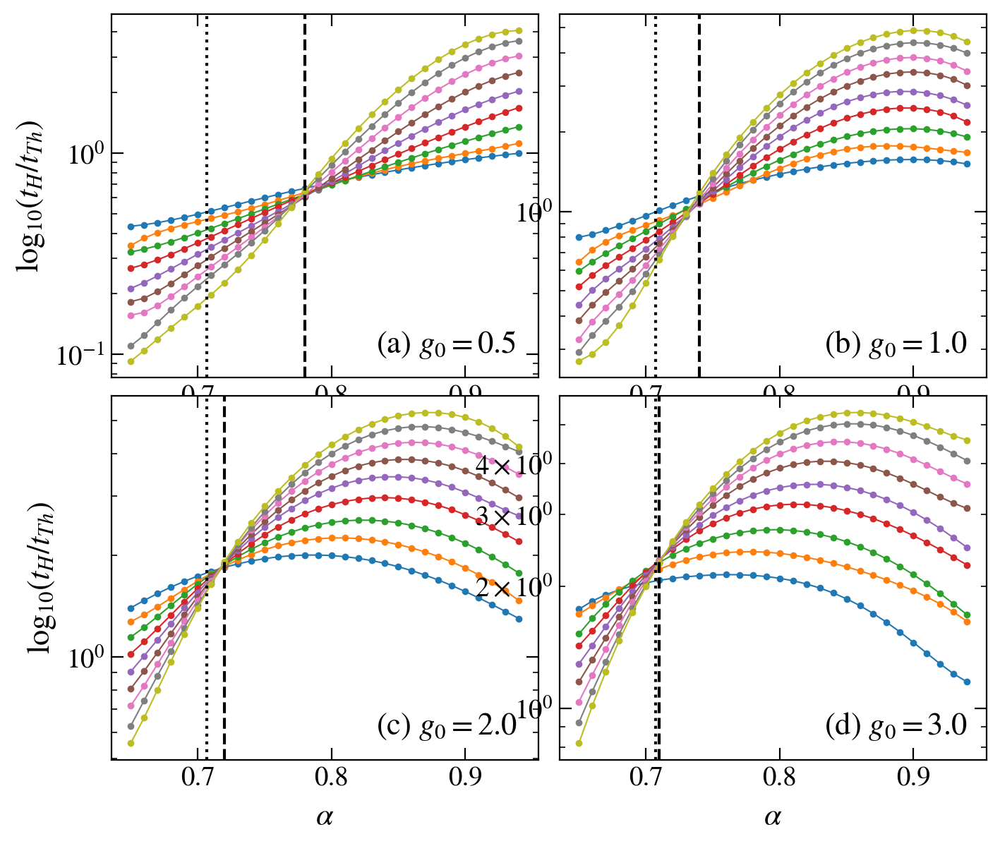

In [460]:
L_total=15
N=3

J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2
gamma=1.0
ini_ave=1
L = L_total - N
scaled_disorder=0

sizes = np.arange(8, 17, 1) - N

folder = f'./thouless time/'
os.makedirs(folder, exist_ok=True)


fig, axis = plt.subplots( nrows=2, ncols=2, figsize=(8,7), dpi = 200)
axis = axis.flatten()

for ii_J, J in enumerate({0.5, 1, 2, 3}):
    alfa_crit = 0.75
    if J == 0.5:    alfa_crit = 0.78
    elif J == 1:    alfa_crit = 0.74
    elif J == 2:    alfa_crit = 0.72
    elif J == 3:    alfa_crit = 0.71
    else:           alfa_crit = 0.71
    heisenberg_time = []
    thouless_time = []
    disorder = []
    for L in sizes:
        t_Th    = None
        tH      = None
        tH_typ  = None
        name_out = folder + f'_L={L},N={N},J={J},w={w},ini_ave={ini_ave}.hdf5'
        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals  = np.array(file.get('interaction'))
                tH         = np.array(file.get('heisenberg time'))
                tH_typ     = np.array(file.get('typical heisenberg time'))
                t_Th       = np.array(file.get('thouless time'))
        else:
            print(name_out)
        
        thouless_time.append(tH_typ * t_Th)
        disorder.append(alfa_vals)
        heisenberg_time.append(tH_typ)

    thouless_time = np.array(thouless_time)
    heisenberg_time = np.array(heisenberg_time)

    
    
    alfa_dense = alfa_vals#np.linspace(alfa_vals[0], alfa_vals[-1], alfa_vals.size + (alfa_vals.size-1) * 4)
    for ii_L, L in enumerate(sizes):
        lab = r"$L+N=%g$"%(L+N)
        t_Th = np.log( heisenberg_time[ii_L] / thouless_time[ii_L] )
        f = splrep(alfa_vals, t_Th, k=5, s=10)
        t_Th = splev(alfa_dense, f)
        axis[ii_J].plot(alfa_dense, t_Th, marker='o', markersize=2.5, label=lab, lw=0.75)
    
    axis[ii_J].axvline(x=alfa_crit, ls='--', c='k')
    axis[ii_J].axvline(x=1/np.sqrt(2), ls=':', c='k')
    # axis.plot(sizes, heisenberg_time[-1], color='k', ls='-.')
    fig_help.set_plot_elements(axis[ii_J], ylabel=r"$\log_{10}(t_H/t_{Th})$" if ii_J % 2 == 0 else "", xlabel=r"$\alpha$" if ii_J > 1 else "",
                                font_size=14, set_legend=False, xscale='linear', yscale='log')#), ylim=(3e1, 3e5))
    
axis[0].annotate(r"(a) $g_0=0.5$", fontsize=16, xy=(0.62, 0.07), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1.0$", fontsize=16, xy=(0.62, 0.07), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2.0$", fontsize=16, xy=(0.62, 0.07), xycoords='axes fraction')
axis[3].annotate(r"(d) $g_0=3.0$", fontsize=16, xy=(0.62, 0.07), xycoords='axes fraction')
fig.subplots_adjust(wspace = 0.05, hspace=0.05)
# plt.savefig("plots/Fig2.pdf", bbox_inches = 'tight', pad_inches=0.02)
# plt.savefig("plots/Fig2.png", bbox_inches = 'tight', pad_inches=0.02)

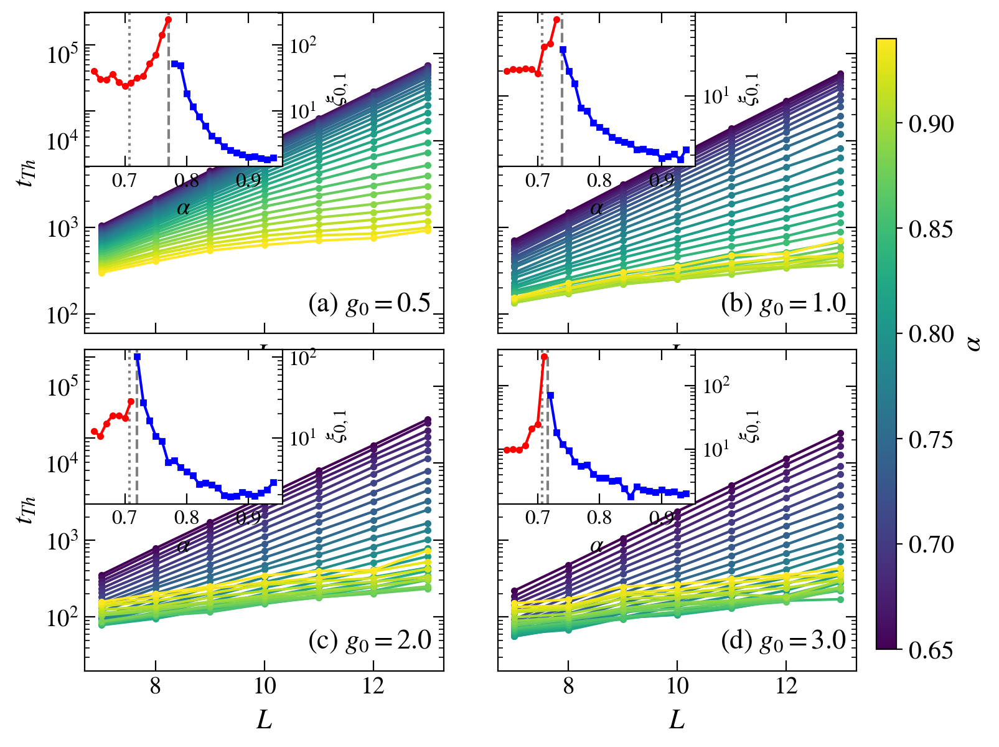

In [61]:
L_total=15
N=3

J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2
gamma=1.0
ini_ave=1
L = L_total - N
scaled_disorder=0

sizes = np.arange(10, 17, 1) - N
interpolate=0
folder = f'./thouless time/'
os.makedirs(folder, exist_ok=True)


fig, axes = plt.subplots( nrows=2, ncols=2, figsize=(8,7), dpi = 200, sharex=True, sharey='row')
axes = axes.flatten()

for ii_J, J in enumerate({0.5, 1, 2, 3}):
    axis = axes[ii_J]
    alfa_crit = 0.75
    s1_crit = 1
    if J == 0.5:    alfa_crit = 0.7712779024078085; s1_crit = 0.39861912483317125;
    elif J == 1:    alfa_crit = 0.7394402852322444; s1_crit = 0.63371037671674502;
    elif J == 2:    alfa_crit = 0.719371246397683;  s1_crit = 0.83680062093580853;
    elif J == 3:    alfa_crit = 0.7167352842108217; s1_crit = 0.89797378899120622;
    else:           alfa_crit = 1/np.sqrt(2)
    heisenberg_time = []
    thouless_time = []
    disorder = []
    for L in sizes:
        t_Th    = None
        tH      = None
        tH_typ  = None
        name_out = folder + f'_L={L},N={N},J={J},w={w},ini_ave={ini_ave}.hdf5'
        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals  = np.array(file.get('interaction'))
                tH         = np.array(file.get('heisenberg time'))
                tH_typ     = np.array(file.get('typical heisenberg time'))
                t_Th       = np.array(file.get('thouless time'))
        else:
            print(name_out)
        
        thouless_time.append(tH_typ * t_Th)
        disorder.append(alfa_vals)
        heisenberg_time.append(tH_typ)

    thouless_time = np.transpose( np.array(thouless_time) )
    heisenberg_time = np.transpose( np.array(heisenberg_time) )

    norm = matplotlib.colors.Normalize(
            vmin=np.min(alfa_vals),
            vmax=np.max(alfa_vals))


    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])


    inset = axis.inset_axes([0.0, 0.52, 0.55, 0.48])
    # print(w_vals_plot)
    xi0 = []
    xi1 = []
    xi10 = []
    for alfa in alfa_vals:
        ii_a = (np.abs(alfa_vals - alfa)).argmin()
        # print(w, ii_w, w_vals[ii_w])
        is_crit = np.round(w, 2) == alfa_crit

        col = 'red' if is_crit else s_m.to_rgba(alfa)
        lin_s = '--' if is_crit else '-'
        lab = r"$2w/L=%g$"%w
        xx = sizes
        yy = thouless_time[ii_a]
        axis.plot(sizes, thouless_time[ii_a], marker='o', color=col, ls=lin_s, markersize=3, label=lab)

        th_ratio = heisenberg_time[ii_a] / thouless_time[ii_a]
        
        xx = sizes
        yy = th_ratio
        if interpolate:
            f = splrep(xx, yy, k=3, s=5)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = splev(xx, f)
            
        pars, pconv = fit(exp_fit2,
                            xdata = xx[-4:],
                            ydata = yy[-4:])
        xi0.append(pars[0])

        pars, pconv = fit(exp_fit,
                            xdata = xx[-4:],
                            ydata = yy[-4:])
        xi1.append(pars[0])

        pars, pconv = fit(exp_fit2 if alfa > alfa_crit else exp_fit,
                            xdata = xx[-4:],
                            ydata = yy[-4:])
        xi10.append(pars[0])

    inset.yaxis.set_label_position("right")
    inset.yaxis.tick_right()
    # inset.axhline(y=17.5, ls=':', c='black')

    # axis.plot(sizes, heisenberg_time[-1], color='k', ls='-.')
    fig_help.set_plot_elements(axis, ylabel=r"$t_{Th}$" if ii_J % 2 == 0 else '', xlabel=r"$L$", font_size=14, set_legend=False, xscale='linear', yscale='log')
    # fig_help.set_legend(axis, loc = 'upper right', fontsize=12, anchor=(1., 1.), ncol=2)
    

    inset.axvline(x=alfa_crit, ls='--', color='gray')
    inset.axvline(x=1/np.sqrt(2), ls=':', color='gray')
    xi0 = np.array(xi0)
    xi1 = np.array(xi1)

    inset.plot(alfa_vals[alfa_vals <= alfa_crit], xi1[alfa_vals <= alfa_crit], marker='o', markersize=3, color='red')
    inset.plot(alfa_vals[alfa_vals > alfa_crit],  xi0[alfa_vals > alfa_crit], marker='s', markersize=3, color='blue')
    # inset.plot(alfa_vals,  xi10, marker='v', markersize=3, color='k')
    fig_help.set_plot_elements(inset, ylabel=r"$\xi_{0,1}$", xlabel=r"$\alpha$", font_size=12, set_legend=False, xscale='linear', yscale='log')#, ylim=(1e0, 7e2))

axes[0].set_ylim(6e1, 3e5)
axes[2].set_ylim(2e1, 3e5)

fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

axes[0].annotate(r"(a) $g_0=0.5$", fontsize=16, xy=(0.62, 0.07), xycoords='axes fraction')
axes[1].annotate(r"(b) $g_0=1.0$", fontsize=16, xy=(0.62, 0.07), xycoords='axes fraction')
axes[2].annotate(r"(c) $g_0=2.0$", fontsize=16, xy=(0.62, 0.07), xycoords='axes fraction')
axes[3].annotate(r"(d) $g_0=3.0$", fontsize=16, xy=(0.62, 0.07), xycoords='axes fraction')
fig.subplots_adjust(wspace = 0.15, hspace=0.05)
# plt.savefig("plots/Fig2.pdf", bbox_inches = 'tight', pad_inches=0.02)
# plt.savefig("plots/Fig2.png", bbox_inches = 'tight', pad_inches=0.02)

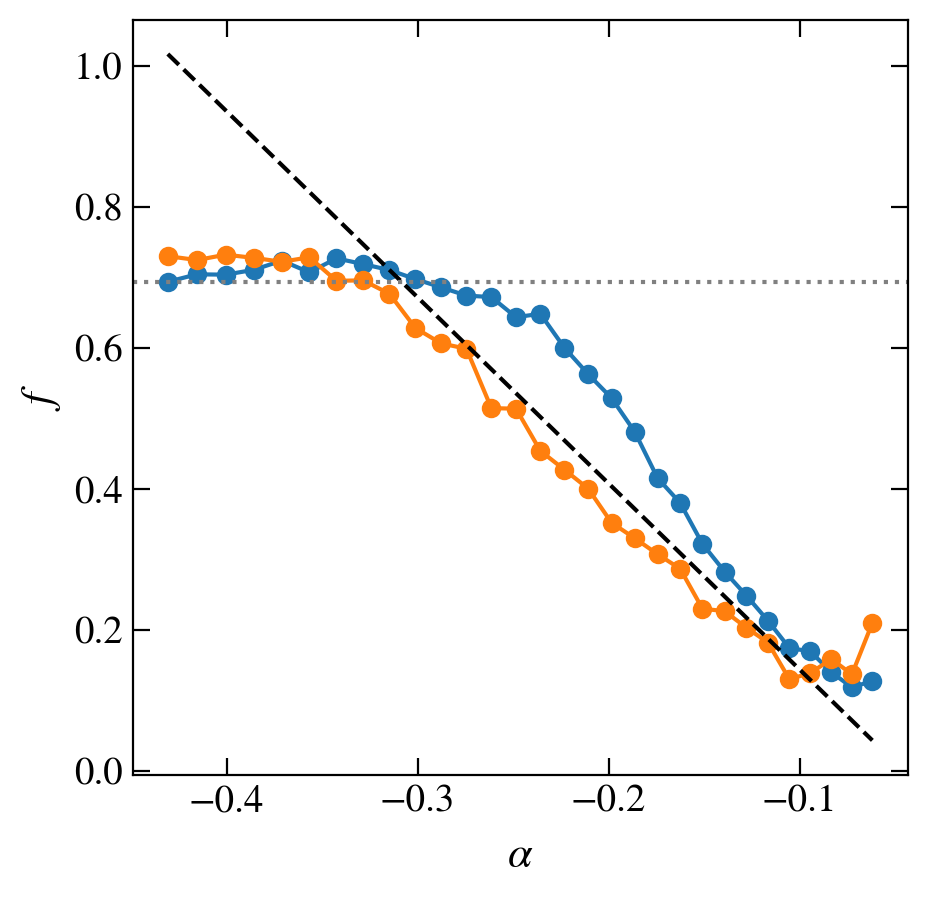

In [47]:
L_total=15
N=3

J=0.5
alfa=1.0
h=1.0
w=0.5
zeta=0.2
gamma=1.0
ini_ave=1
L = L_total - N
scaled_disorder=0

sizes = np.arange(10, 17, 1) - N
interpolate=0
folder = f'./thouless time/'
os.makedirs(folder, exist_ok=True)


fig, axis = plt.subplots( nrows=1, ncols=1, figsize=(5,5), dpi = 200, sharex=True, sharey='row')

for ii_J, J in enumerate({0.5, 1}):
    
    alfa_crit = 0.75
    s1_crit = 1
    if J == 0.5:    alfa_crit = 0.7712779024078085; s1_crit = 0.39861912483317125;
    elif J == 1:    alfa_crit = 0.7394402852322444; s1_crit = 0.63371037671674502;
    elif J == 2:    alfa_crit = 0.719371246397683;  s1_crit = 0.83680062093580853;
    elif J == 3:    alfa_crit = 0.7167352842108217; s1_crit = 0.89797378899120622;
    else:           alfa_crit = 1/np.sqrt(2)
    heisenberg_time = []
    thouless_time = []
    disorder = []
    for L in sizes:
        t_Th    = None
        tH      = None
        tH_typ  = None
        name_out = folder + f'_L={L},N={N},J={J},w={w},ini_ave={ini_ave}.hdf5'
        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals  = np.array(file.get('interaction'))
                tH         = np.array(file.get('heisenberg time'))
                tH_typ     = np.array(file.get('typical heisenberg time'))
                t_Th       = np.array(file.get('thouless time'))
        else:
            print(name_out)
        
        thouless_time.append(tH_typ * t_Th)
        disorder.append(alfa_vals)
        heisenberg_time.append(tH_typ)

    thouless_time = np.transpose( np.array(thouless_time) )
    heisenberg_time = np.transpose( np.array(heisenberg_time) )

    norm = matplotlib.colors.Normalize(
            vmin=np.min(alfa_vals),
            vmax=np.max(alfa_vals))


    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    # print(w_vals_plot)
    f = []
    for alfa in alfa_vals:
        ii_a = (np.abs(alfa_vals - alfa)).argmin()
        # print(w, ii_w, w_vals[ii_w])
        is_crit = np.round(w, 2) == alfa_crit

        col = 'red' if is_crit else s_m.to_rgba(alfa)
        lin_s = '--' if is_crit else '-'
        lab = r"$2w/L=%g$"%w
        xx = sizes
        yy = thouless_time[ii_a]

        if interpolate:
            f = splrep(xx, yy, k=3, s=5)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = splev(xx, f)
        
        def my_fit(x, f, A):
            return A * np.exp(f * x)
        
        pars, pconv = fit(my_fit,
                            xdata = xx[-5:],
                            ydata = yy[-5:])
        f.append(pars[0])

    axis.plot(np.log(alfa_vals), f, marker='o')
axis.plot(np.log(alfa_vals), -2*1.32 * np.log(alfa_vals) - 0.12, color='k', ls='--')
axis.axhline(y=np.log(2), ls=':', color='gray')
# axis.plot(sizes, heisenberg_time[-1], color='k', ls='-.')
fig_help.set_plot_elements(axis, ylabel=r"$f$", xlabel=r"$\alpha$", font_size=14, set_legend=False, xscale='linear', yscale='linear')
# fig_help.set_legend(axis, loc = 'upper right', fontsize=12, anchor=(1., 1.), ncol=2)


fig.subplots_adjust(wspace = 0.15, hspace=0.05)
# plt.savefig("plots/Fig2.pdf", bbox_inches = 'tight', pad_inches=0.02)
# plt.savefig("plots/Fig2.png", bbox_inches = 'tight', pad_inches=0.02)

In [104]:
def add_arrow(line, position=None, direction='right', size=15, color=None):
    """
    add an arrow to a line.

    line:       Line2D object
    position:   x-position of the arrow. If None, mean of xdata is taken
    direction:  'left' or 'right'
    size:       size of the arrow in fontsize points
    color:      if None, line color is taken.
    """
    if color is None:
        color = line.get_color()

    xdata = line.get_xdata()
    ydata = line.get_ydata()

    if position is None:
        position = xdata.mean()
    # find closest index
    start_ind = np.argmin(np.absolute(xdata - position))
    if direction == 'right':
        end_ind = start_ind + 1
    else:
        end_ind = start_ind - 1

    line.axes.annotate('',
        xytext=(xdata[start_ind], ydata[start_ind]),
        xy=(xdata[end_ind], ydata[end_ind]),
        arrowprops=dict(arrowstyle="-|>", color=color),
        size=size
    )

[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]
0.67 -1.4630481332480008
0.68 1.8657619568415205
0.6900000000000001 1.9022297293846122
0.7 1.9201084171861882
0.71 1.9168935593758794
0.72 1.8906806688633035
0.73 1.8946825553436741
0.74 1.7645890814243175
0.75 1.6638208505780778
0.76 1.5382576593409665
0.77 1.3888608404919738
0.78 1.2171381373750145
0.79 1.0251347017999726
0.7999999999999999 0.8154242258518396
0.8099999999999999 0.591099913334573
0.82 0.3557656560257406
0.83 0.11352703809962725
0.84 -0.13101757982040613
0.85 -0.3727860203533507
0.86 -0.6062211691952553
0.8699999999999999 -0.8252999522535657
0.8799999999999999 -1.0235422542747372
0.8899999999999999 -1.1940198533920785
0.8999999999999999 -1.3293653408924386
0.9099999999999999 -1.421781085440809


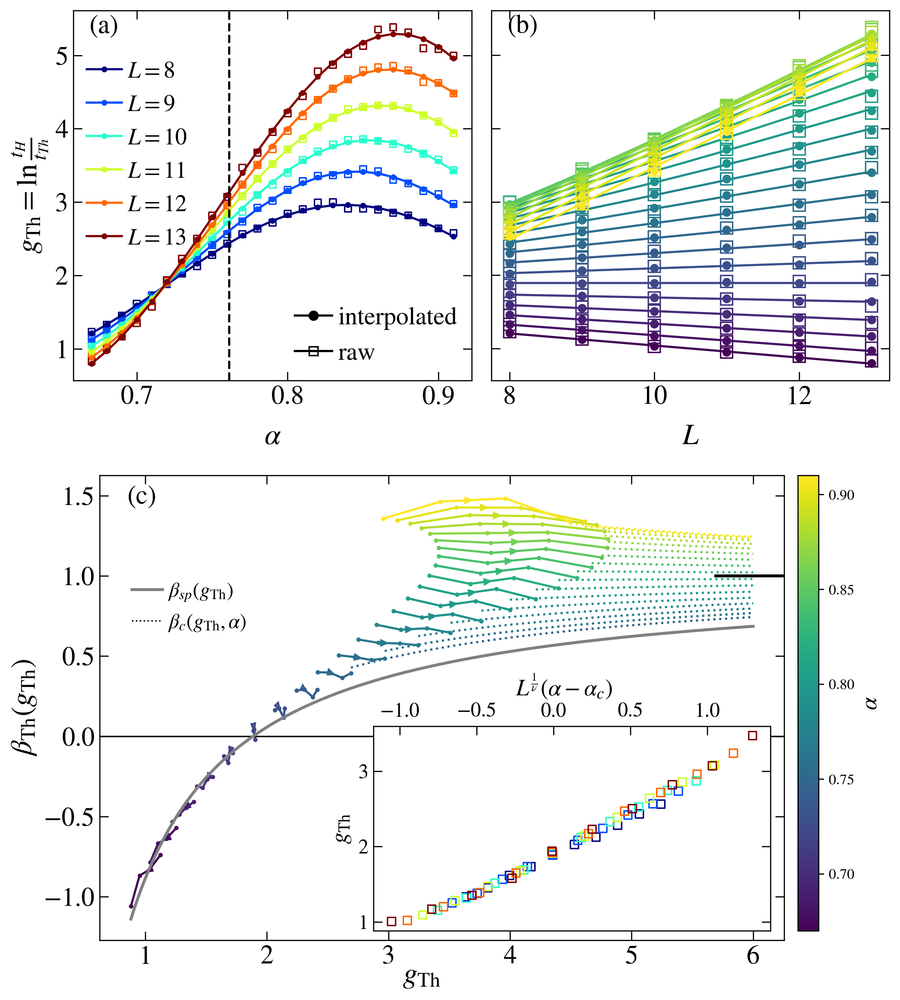

In [186]:
L_total=15
J=2
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=1
L = L_total - N
scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)

if J == 0.5:    alfa_crit = 0.7612779024078085; s1_crit = 0.39861912483317125; nu = 0.59834802
elif J == 1:    alfa_crit = 0.7294402852322444; s1_crit = 0.63371037671674502; nu = 0.69034733
elif J == 2:    alfa_crit = 0.720371246397683;  s1_crit = 0.83680062093580853; nu = 0.78655063
elif J == 3:    alfa_crit = 0.7167352842108217; s1_crit = 0.89797378899120622; nu = 0.79847641
else:           alfa_crit = 1/np.sqrt(2)

fig = plt.figure(figsize=(10,9), dpi = 300)
gs1 = GridSpec(1, 1)
gs1.update(top=0.51, bottom=0.02, left=0.15, right=0.8)
axis = fig.add_subplot(gs1[0,0])

gs2 = GridSpec(1, 2)
gs2.update(top=1, bottom=0.61, wspace=0.05, hspace=0.25)
ax1 = fig.add_subplot(gs2[0])
ax2 = fig.add_subplot(gs2[1])
axis = [axis, ax1, ax2]

inset = axis[0].inset_axes([0.4, 0.02, 0.58, 0.44])
# inset = axis[2]

use_collapse = 0
use_input_crit_point = 0
use_two_parameter_ansatz = 0

interpolate = 0
use_fit = 0

delta=0.05
bin_size = 5
use_inset=0
alfa_min = 0.67
alfa_max = 0.91
p=1

def beta0_fun(x, o1 = 0.0, p = 1):
    c_ = 2**(2*p) / (2 * p * np.log(2))
    g_ = 1 + o1 / (p * np.log(2))
    if use_area_collapse: return -(g_ - x) / x * np.log( (g_ - x) / c_ )
    else:                 return (g_ - x) / x


gmax = 6

def th_fit(g, xi, A):    
    return g / xi + A

def th_fit2(g, xi, A):    
    return -g / xi + A

folder = f'./thouless time/'
os.makedirs(folder, exist_ok=True)
    
ylab = r"$\beta(X)$"

sizes = np.arange(11, 17, 1)

heisenberg_time = []
thouless_time = []
disorder = []
for L_total in sizes:
    L = L_total - N
    t_Th    = None
    tH      = None
    tH_typ  = None
    name_out = folder + f'_L={L},N={N},J={J},w={w},ini_ave={ini_ave}.hdf5'
    if exists(name_out):
        with h5py.File(name_out, "r") as file:
            alfa_vals  = np.array(file.get('interaction'))
            tH         = np.array(file.get('heisenberg time'))
            tH_typ     = np.array(file.get('typical heisenberg time'))
            t_Th       = np.array(file.get('thouless time'))
    else:
        print(name_out)
    
    thouless_time.append(tH_typ * t_Th)
    disorder.append(alfa_vals)
    heisenberg_time.append(tH_typ)

thouless_time = np.array(thouless_time)
heisenberg_time = np.array(heisenberg_time)
_ydata = np.log(heisenberg_time / thouless_time)

alfa_dense = alfa_vals#np.linspace(alfa_vals[0], alfa_vals[-1], alfa_vals.size + (alfa_vals.size-1) * 1)
ydata = np.zeros((sizes.size, alfa_dense.size));  ydata.fill(np.nan)
for ii, L_total in enumerate(sizes):
    f = splrep(alfa_vals, _ydata[ii], k=5, s=2)
    ydata[ii] = splev(alfa_dense, f)
    spl = InterpolateSpline(alfa_vals, _ydata[ii], k=5, s=10)
    ydata[ii] = spl(alfa_dense)

alfa_vals = alfa_dense
# ydata = _ydata
# ydata = np.transpose( np.array(ydata) )
# norm is a class which, when called, can normalize data into the
# [0.0, 1.0] interval.
norm = matplotlib.colors.Normalize(
    vmin=max(alfa_min, np.min(alfa_vals) ),
    vmax=min(alfa_max, np.max(alfa_vals)) )


# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
s_m.set_array([])

norm = matplotlib.colors.Normalize(
    vmin=np.min(sizes),
    vmax=np.max(sizes))


# create a ScalarMappable and initialize a data structure
s_m_L = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
s_m_L.set_array([])

line1, = axis[1].plot(np.nan, np.nan, color='k', marker='o', label='interpolated')
line2, = axis[1].plot(np.nan, np.nan, color='k', markerfacecolor='None', marker='s', label='raw')

first_legend = fig_help.set_legend(axis[1], fontsize=17, loc='lower right', handles=[line1, line2])

# Add the legends manually to the current Axes.
ax1.add_artist(first_legend)

data_labs = []
xx_data = []
yy_data = []
for ii_L, L in enumerate(sizes):
    indices = np.where(np.logical_and(alfa_dense >= alfa_min, alfa_dense < alfa_max))[0]
    line, = axis[1].plot(alfa_dense[indices], ydata[ii_L][indices],  marker='o', markersize=3, color = s_m_L.to_rgba(L), lw=1.5, label=r"$L=%d$"%(L-N))
    data_labs.append(line)
    axis[1].scatter(alfa_dense[indices], _ydata[ii_L][indices], marker='s', s=20,      color = s_m_L.to_rgba(L), facecolor='None')
    
    
    indices = np.where(np.logical_and(alfa_dense > np.round(alfa_crit - delta, 3), alfa_dense <= np.round(alfa_crit + delta, 3)))[0]
    # indices = np.where( alfa_dense <= np.round(alfa_crit, 3) )[0]
    xx_data.append(alfa_dense[indices])
    yy_data.append(_ydata[ii_L][indices])
    
const = 0
omega = 0
if use_collapse:
    crit_exponents = []
    crit_alfas = []
    crit_omega = []
    crit_const = []
    for seed in [5324]:
        if use_two_parameter_ansatz:
            crit_exp, omega, const, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=sizes - N, crit_fun='const', scaling_ansatz='classic', seed=seed, two_parameter_ansatz=True, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
            crit_exponents.append(crit_exp)
            crit_omega.append(omega)
            crit_const.append(const)
            crit_alfas.append(crit_pars[0])
        else:
            crit_exp, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=sizes - N, crit_fun='const', scaling_ansatz='classic', seed=seed, two_parameter_ansatz=False, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
            crit_exponents.append(crit_exp)
            crit_alfas.append(crit_pars)

    print("----------------------------g0 = ", J)
    print("nu = ", 1/np.array(crit_exponents))
    print("alfa_c = ", crit_alfas)
    print("omega = ", crit_omega)
    print("const = ", crit_const)

    if use_two_parameter_ansatz:
        omega = tools.typical(crit_omega)
        const = tools.typical(crit_const)
    crit_exp = np.mean(crit_exponents)
    crit_pars = [np.mean(crits) for crits in np.transpose(crit_alfas)]

    crit_exp = 1/crit_exp
    print("Cost fun = ", costfun, "mu = ", crit_exp, "omega = ", omega, "const = ", const)
else:
    crit_exp = nu
    crit_pars = [alfa_crit]
g_crit = 1e6
for ii_L, L in enumerate(sizes):
    xdats = (L-N)**(1/crit_exp) * (xx_data[ii] - crit_pars[0])
    ydats = yy_data[ii_L] - const * (L-N)**(-omega)
    inset.scatter( xdats, ydats, marker='s', s=30, color = s_m_L.to_rgba(L), facecolor='None')
    idx = np.argmin(np.abs(xdats))
    if ydats[idx] < g_crit: g_crit = ydats[idx]

# gs = np.linspace(g_crit - 0.2, g_crit + 0.2)
# axis[0].plot(gs, (gs - g_crit) / (crit_exp * g_crit), ls='-', color='gray', lw=2)

axis[1].axvline(x=0.7612779024078085, ls='--', c='k')
# axis[2].axvline(x=1/np.sqrt(2),       ls=':', c='k')
# axis.plot(sizes, heisenberg_time[-1], color='k', ls='-.')
fig_help.set_plot_elements(axis[1], ylabel=r"$g_{\rm Th}=\ln\frac{t_H}{t_{Th}}$", xlabel=r"$\alpha$", font_size=18, set_legend=False, xscale='linear', yscale='linear')
second_legend = fig_help.set_legend(axis[1], fontsize=16, loc='upper left', handles=data_labs, anchor=(-0.02, 0.92))


ydata = np.transpose( np.array(ydata) )
_ydata = np.transpose( np.array(_ydata) )

idx_c = 0


envelope_ydata = []
envelope_xdata = []
yax_max = -10
yax_min = 10
for ii_a, alfa in enumerate(alfa_vals):
    if alfa > alfa_max or alfa < alfa_min: continue
    col = s_m.to_rgba(alfa)
    # col = s_m.to_rgba(alfa)
    xx = sizes - N
    yy = ydata[ii_a]
    
        
    axis[2].plot(xx, yy, marker='o', markersize=5, lw=0.0, ls='--', color=s_m.to_rgba(alfa)) 
    axis[2].plot(xx, _ydata[ii_a], marker='s', markersize=8, lw=0.0, ls='--', color=s_m.to_rgba(alfa), markerfacecolor='None')
    
    my_fit = th_fit if alfa > alfa_crit else th_fit2
    try:
        # xx = xx - N
        pars, pconv, fit_info, msg, _ = fit(my_fit,
                        xdata = xx,
                        ydata = yy,
                        full_output=True, maxfev=10000)
        # print(J, alfa, fit_info['fvec'])
        dense_sizes = np.linspace(xx[0], xx[-1], 10000)
        axis[2].plot(dense_sizes, my_fit(dense_sizes, *pars), lw=1.5, color=s_m.to_rgba(alfa), ls = '-')
        print(alfa, A)
        A = pars[1]
        if alfa > alfa_crit + 0.02:
            dense_g = np.linspace(yy[-2], gmax, 10000)
            axis[0].plot(dense_g, 1 - (A) / dense_g, lw=1.5, color=s_m.to_rgba(alfa), ls = ':')
    except RuntimeError:
        print(alfa, "Failed")
    
    fig_help.set_plot_elements(axis[2], ylabel="", xlabel=r"$L$", font_size=18, set_legend=False, xscale='linear', yscale='linear')

    if interpolate:
        f = splrep(xx, yy, k=3, s=1)
        xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
        yy = splev(xx, f)
        
    if not use_fit:
        beta = diff_central( np.log(xx), np.log(yy))# * xx[1:-1] / yy[1:-1]
        xx_beta = yy[1:-1]
    
        line, = axis[0].plot(xx_beta, beta, marker='o', markersize=0 if interpolate else 2, lw=1.5, color=col)
        
        envelope_ydata = [*envelope_ydata, *beta]
        envelope_xdata = [*envelope_xdata, *xx_beta]
        # envelope_ydata = [*envelope_ydata, (beta[-1])]
        # envelope_xdata = [*envelope_xdata, (xx_beta[-1])]
        
        if min(beta) < yax_min: yax_min = min(beta)
        if max(beta) > yax_max: yax_max = max(beta)
        
        i1 = 1
        dx = xx_beta[i1+1] - xx_beta[i1]
        dy = beta[i1+1] - beta[i1]
        pos_x = xx_beta[i1] + dx/2
        pos_y = beta[i1] + dy/2
        
        axis[0].arrow(pos_x, pos_y, 0.01 * dx, 0.01 * dy, shape='full', lw=0, length_includes_head=True, head_width=.05, color=col)
        # axis[0].quiver(pos_x, pos_y, u/arr_norm, v/arr_norm, angles="xy", zorder=5, pivot="mid", color=col, linewidth=0, width=0.005, headwidth=3, lw=0)
        # axis[0].quiver(pos_x, pos_y, u/arr_norm, v/arr_norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
    else:
        dense_sizes = np.linspace(xx[0], xx[-1], 50)
        # f = splrep(xx, yy, k=5 if alfa < alfa_crit + 0.08 else 5, s=10)
        # smooth_data = splev(dense_sizes, f)
        # deriv = splev(dense_sizes, f, der=1) * dense_sizes / smooth_data
        smooth_data = my_fit(dense_sizes, *pars)
        deriv = diff_central(np.log(dense_sizes), np.log(smooth_data))
        smooth_data = smooth_data[1:-1]
        axis[0].plot(smooth_data, deriv, lw=1.5, color=col)
        
        if min(deriv) < yax_min: yax_min = min(deriv)
        if max(deriv) > yax_max: yax_max = max(deriv)
        # spline = InterpolateSpline(sizes, ydata[ii_a], k=5, s=0)
        # spl_deriv = spline.derivative(n=1)
        # aaaa = np.linspace(sizes[0], sizes[-1], 100)
        # smooth_data = spline(aaaa)
        # deriv = spl_deriv(aaaa)
        
        envelope_ydata = [*envelope_ydata, *deriv]
        envelope_xdata = [*envelope_xdata, *smooth_data]
        # envelope_ydata = [*envelope_ydata, deriv[-1]]
        # envelope_xdata = [*envelope_xdata, smooth_data[-1]]

        i1 = 3
        u = smooth_data[i1+1] - smooth_data[i1]
        v = deriv[i1+1] - deriv[i1]
        pos_x = smooth_data[i1]# + u/2
        pos_y = deriv[i1]# + v/2
        arr_norm = np.sqrt(u**2+v**2)
    
        axis[0].quiver(pos_x, pos_y, u/arr_norm, v/arr_norm, angles="xy", zorder=5, pivot="mid", color=col, linewidth=0, width=0.006, headwidth=2)
        
# # sorting X and Y data according to increasing X
permut = np.argsort( np.array(envelope_xdata) )
envelope_ydata = np.array(envelope_ydata)[permut]
envelope_xdata = np.array(envelope_xdata)[permut]

size = len(envelope_xdata)
envelope = np.zeros( (size // bin_size) )
xxx = np.zeros( (size // bin_size) )

# Finding maximum Y in each bin of 20 points of interpolated data
for k in range(envelope.size):
    idx_r = (k+1) * bin_size if k < envelope.size-1 else -1
    idx = np.argmax(envelope_ydata[k * bin_size : idx_r])
    envelope[k] = envelope_ydata[k * bin_size : idx_r][idx]
    xxx[k]      = envelope_xdata[k * bin_size : idx_r][idx]
# xxx = envelope_xdata
# envelope = envelope_ydata
# axis[0].scatter(xxx, envelope, s=30, color='k')

axis[0].axhline(y=0, ls='-', c='k', lw=1)
axis[0].axhline(y=1, ls='-', c='black', lw=2, xmin = 0.9)
# inset.axvline(x=0, ls='--', c='k', lw=1)

# gs = np.linspace(g_crit - 0.75, g_crit + 0.75, 1000)
# axis[0].plot(gs, (gs - g_crit) / g_crit, ls='--', color='k')

gs = np.linspace(min(envelope_xdata), gmax, 1000)
axis[0].plot(gs, 1 - g_crit / gs, lw=2, ls='-', color='gray', label=r"$\beta_{sp}(g_{\rm Th})$")
axis[0].plot(np.nan, np.nan, lw=1, ls=':', color='k', label=r"$\beta_{c}(g_{\rm Th},\alpha)$")

xlab = r"$g_{\rm Th}$"
ylab = r"${\beta}_{\rm Th}(g_{\rm Th})$"
fig_help.set_plot_elements(axis[0], xlabel=xlab, ylabel=ylab, font_size=18, set_legend=False, xscale='linear')
fig_help.set_legend(axis[0], loc = 'upper left', fontsize=14, anchor=(0.02, 0.81))

fig_help.set_plot_elements(inset, xlabel=r"$L^\frac{1}{\nu}(\alpha-{\alpha}_c)$", ylabel=r"$g_{\rm Th}$", font_size=14, set_legend=False, xscale='linear')
inset.xaxis.set_label_position("top")
inset.xaxis.set_label_coords(.48, 1.15)
inset.xaxis.tick_top()

axis[0].xaxis.set_label_coords(.47, -0.05)
# ax1.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
# ax1.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
ax2.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: ""))
ax2.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: ""))
# fig.subplots_adjust(right=0.9)
# cbar_ax = fig.add_axes([0.92, 0.15, 0.03, 0.7])
# # fig.colorbar(im, cax=cbar_ax)

# fig.subplots_adjust(wspace = 0.02, hspace=0.2)

# cbaxes = inset_axes(axis[0], width="70%", height="5%", loc=4)
cbaxes = axis[0].inset_axes([1.02, 0.02, 0.03, 0.98])
cbar = fig.colorbar(s_m, cax = cbaxes, orientation='vertical')

cbar.set_label(r"$\alpha$", fontsize=16)
# cbar.ax.tick_params(labelsize=15)

axis[0].annotate(r"(c)", fontsize=18, xy=(0.04, 0.94), xycoords='axes fraction')
axis[1].annotate(r"(a)", fontsize=18, xy=(0.04, 0.94), xycoords='axes fraction')
axis[2].annotate(r"(b)", fontsize=18, xy=(0.04, 0.94), xycoords='axes fraction')
# inset.annotate(r"$\mu\approx%.2f$"%(crit_exp) + f"\n" + r"$\tilde{\alpha}_c\approx%.2f$"%(crit_pars[0]), fontsize=18, xy=(0.1, 0.7), xycoords='axes fraction')

fig.savefig("plots_beta/FigS4.pdf", bbox_inches = 'tight', pad_inches=0.02)
fig.savefig("plots_beta/FigS4.png", bbox_inches = 'tight', pad_inches=0.02)


[0.65 0.66 0.67 0.68 0.69 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77 0.78
 0.79 0.8  0.81 0.82 0.83 0.84 0.85 0.86 0.87 0.88 0.89 0.9  0.91 0.92
 0.93 0.94]
0.67 28.822066950929347 0.5614519075550499
0.68 28.65466101973935 0.5831301032252412
0.6900000000000001 28.367816881037683 0.6091715046585022
0.7 28.08622225721117 0.6376696929521493
0.71 28.01779601736759 0.6659303597278583
0.72 28.448423645100277 0.6906493931802441
0.73 29.80354152729868 0.7080909634684317
0.74 32.8734845591514 0.7142656153186357
0.75 39.601887796732484 0.7051083441126974
0.76 56.98235019276342 0.6766566908113926
0.77 2819782213.4675484 0.5534140104093825
0.78 136.91665329493904 0.5476016463919581
0.79 39.6291340109488 0.44118884188101315
0.7999999999999999 21.182368851127023 0.30421895688012757
0.8099999999999999 13.630025166760326 0.13591358808345638
0.82 9.642800720877217 -0.0633346888856702
0.83 7.24385009838108 -0.29178408416580776
0.84 5.6806287940989 -0.5461655837589373
0.85 4.606295070119359 -0.8215049007110

No handles with labels found to put in legend.


0.76 5.984629485708499 1.6352300336326933
0.77 4.819353052499812 1.3968513007511658
0.78 4.0320116843660445 1.139329436611551
0.79 3.4741385759022436 0.8685517425027437
0.7999999999999999 3.065936872260928 0.5907653633528024
0.8099999999999999 2.7608957767550253 0.3123407710107251
0.82 2.530235059782152 0.039534951858004284
0.83 2.355321569337944 -0.22174459177031786
0.84 2.223661218449373 -0.4661774831653577
0.85 2.126635130908193 -0.6892661332236177
0.86 2.0581366660682767 -0.887572607798815
0.8699999999999999 2.013690036917944 -1.0589554056771249
0.8799999999999999 1.989821208267332 -1.2028058407281164
0.8899999999999999 1.9835415257386777 -1.3202847498111068
0.8999999999999999 1.9918497873540382 -1.414559015644885
0.9099999999999999 2.0111870953321374 -1.4910382692287674
FIT: 3 0.00221423861487605 0.0024879746714326838


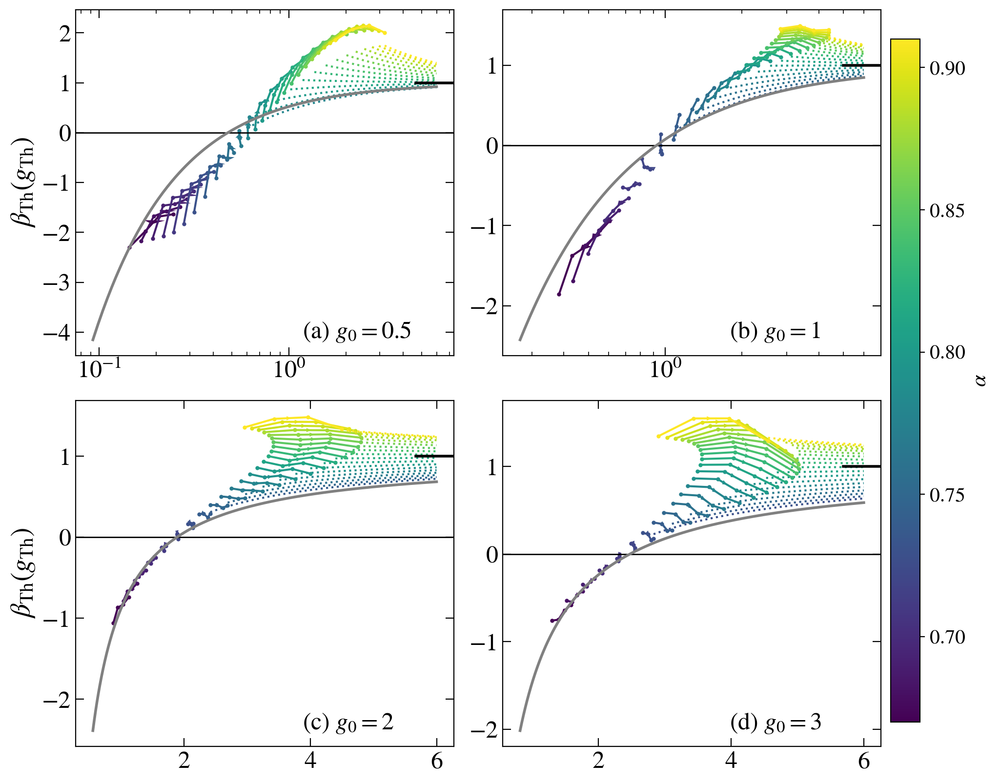

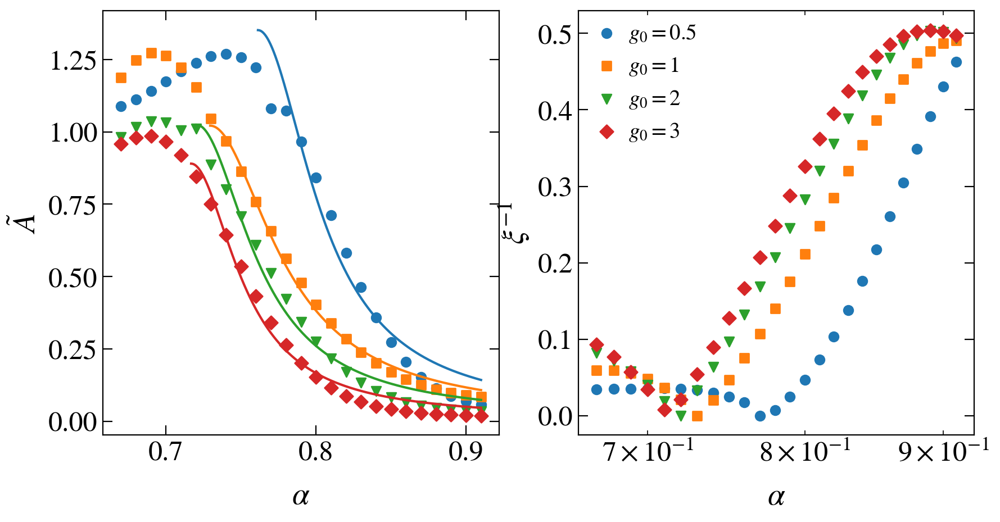

In [184]:
colors_ls = (list(mcolors.TABLEAU_COLORS)[:500])
colors_ls_cyc = itertools.cycle(colors_ls)
markers = itertools.cycle(['o','s','v', 'D', '*', 'X', '^', '<', '+'])

L_total=15
J=2
alfa=1.0
h=1.0
w=0.5
zeta=0.2

N=3
gamma=1.0
ini_ave=1
L = L_total - N
scaled_disorder = 0

alfa_vals = np.linspace(0.65, 0.94, 30)
print(alfa_vals)


fig, axis = plt.subplots( nrows=2, ncols=2, figsize=(10,10), dpi = 200)
axis = np.array(axis).flatten()

fig2, ax_fit = plt.subplots( nrows=1, ncols=2, figsize=(10,5), dpi = 200)


use_collapse = 0
use_input_crit_point = 0
use_two_parameter_ansatz = 0

interpolate = 0
use_fit = 0

delta=0.05
bin_size = 5
use_inset=0
alfa_min = 0.67
alfa_max = 0.91
p=1

gmax = 6

def th_fit(g, xi, A):    
    return g / xi + A

def th_fit2(g, xi, A):    
    return -g / xi + A

folder = f'./thouless time/'
os.makedirs(folder, exist_ok=True)
    
ylab = r"$\beta(X)$"

sizes = np.arange(11, 17, 1)

for ii_J, J in enumerate([0.5, 1, 2, 3]):
    mark = next(markers)
    cross_col = next(colors_ls_cyc)
    alfa_crit = 0.75
    if J == 0.3:    alfa_crit = 0.8074711767728078; s1_crit = 0.27426; nu = 0.61334; 
    elif J == 0.5:  alfa_crit = 0.7612779024078085; s1_crit = 0.39708; nu = 0.60945; 
    elif J == 1:    alfa_crit = 0.7294402852322444; s1_crit = 0.63786; nu = 0.68639; 
    elif J == 2:    alfa_crit = 0.720371246397683;  s1_crit = 0.83867; nu = 0.79797; 
    elif J == 3:    alfa_crit = 0.7167352842108217; s1_crit = 0.90339; nu = 0.80775; 
    else:           alfa_crit = 1/np.sqrt(2)

    heisenberg_time = []
    thouless_time = []
    disorder = []
    for L_total in sizes:
        L = L_total - N
        t_Th    = None
        tH      = None
        tH_typ  = None
        name_out = folder + f'_L={L},N={N},J={J},w={w},ini_ave={ini_ave}.hdf5'
        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                alfa_vals  = np.array(file.get('interaction'))
                tH         = np.array(file.get('heisenberg time'))
                tH_typ     = np.array(file.get('typical heisenberg time'))
                t_Th       = np.array(file.get('thouless time'))
        else:
            print(name_out)
        
        thouless_time.append(tH_typ * t_Th)
        disorder.append(alfa_vals)
        heisenberg_time.append(tH_typ)

    thouless_time = np.array(thouless_time)
    heisenberg_time = np.array(heisenberg_time)
    _ydata = np.log(heisenberg_time / thouless_time)

    alfa_dense = alfa_vals#np.linspace(alfa_vals[0], alfa_vals[-1], alfa_vals.size + (alfa_vals.size-1) * 1)
    ydata = np.zeros((sizes.size, alfa_dense.size));  ydata.fill(np.nan)
    for ii, L_total in enumerate(sizes):
        f = splrep(alfa_vals, _ydata[ii], k=5, s=2)
        ydata[ii] = splev(alfa_dense, f)
        spl = InterpolateSpline(alfa_vals, _ydata[ii], k=5, s=10)
        ydata[ii] = spl(alfa_dense)

    alfa_vals = alfa_dense
    # ydata = _ydata
    # ydata = np.transpose( np.array(ydata) )
    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    norm = matplotlib.colors.Normalize(
        vmin=max(alfa_min, np.min(alfa_vals) ),
        vmax=min(alfa_max, np.max(alfa_vals)) )


    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    norm = matplotlib.colors.Normalize(
        vmin=np.min(sizes),
        vmax=np.max(sizes))


    # create a ScalarMappable and initialize a data structure
    s_m_L = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
    s_m_L.set_array([])

    xx_data = []
    yy_data = []
    for ii_L, L in enumerate(sizes):
        indices = np.where(np.logical_and(alfa_dense > np.round(alfa_crit - delta, 3), alfa_dense <= np.round(alfa_crit + delta, 3)))[0]
        xx_data.append(alfa_dense[indices])
        yy_data.append(_ydata[ii_L][indices])
        
    const = 0
    omega = 0
    if use_collapse:
        crit_exponents = []
        crit_alfas = []
        crit_omega = []
        crit_const = []
        for seed in [63553465]:
            if use_two_parameter_ansatz:
                crit_exp, omega, const, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=sizes - N, crit_fun='const', scaling_ansatz='classic', seed=seed, two_parameter_ansatz=True, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
                crit_exponents.append(crit_exp)
                crit_omega.append(omega)
                crit_const.append(const)
                crit_alfas.append(crit_pars[0])
            else:
                crit_exp, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=sizes - N, crit_fun='const', scaling_ansatz='classic', seed=seed, two_parameter_ansatz=False, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
                crit_exponents.append(crit_exp)
                crit_alfas.append(crit_pars)

        print("----------------------------g0 = ", J)
        print("nu = ", 1/np.array(crit_exponents))
        print("alfa_c = ", crit_alfas)
        print("omega = ", crit_omega)
        print("const = ", crit_const)

        if use_two_parameter_ansatz:
            omega = tools.typical(crit_omega)
            const = tools.typical(crit_const)
        crit_exp = np.mean(crit_exponents)
        crit_pars = [np.mean(crits) for crits in np.transpose(crit_alfas)]

        crit_exp = 1/crit_exp
        print("Cost fun = ", costfun, "mu = ", crit_exp, "omega = ", omega, "const = ", const)
    else:
        crit_exp = nu
        crit_pars = [alfa_crit]
    g_crit = 1e6
    for ii_L, L in enumerate(sizes):
        xdats = (L-N)**(1/crit_exp) * (xx_data[ii] - crit_pars[0])
        ydats = yy_data[ii_L] - const * (L-N)**(-omega)
        inset.scatter( xdats, ydats, marker='s', s=30, color = s_m_L.to_rgba(L), facecolor='None')
        idx = np.argmin(np.abs(xdats))
        if ydats[idx] < g_crit: g_crit = ydats[idx]

    ydata = np.transpose( np.array(ydata) )
    _ydata = np.transpose( np.array(_ydata) )

    yax_max = -10
    yax_min = 10
    
    A_vals = []
    xi_vals = []
    alfa_used = []
    for ii_a, alfa in enumerate(alfa_vals):
        if alfa > alfa_max or alfa < alfa_min: continue
        
        alfa_used.append(alfa)
        col = s_m.to_rgba(alfa)
        # col = s_m.to_rgba(alfa)
        xx = sizes - N
        yy = ydata[ii_a]
        
        my_fit = th_fit if alfa > alfa_crit else th_fit2
        try:
            # xx = xx - N
            pars, pconv, fit_info, msg, _ = fit(my_fit,
                            xdata = xx,
                            ydata = yy,
                            full_output=True, maxfev=10000)
            # print(J, alfa, fit_info['fvec'])
            dense_sizes = np.linspace(xx[0], xx[-1], 10000)
            xi = pars[0]
            A = pars[1]
            print(alfa, xi, A)
            xi_vals.append(xi)
            A_vals.append(A)
            if alfa > alfa_crit + 0.01:
                dense_g = np.linspace(yy[-2], gmax, 10000)
                axis[ii_J].plot(dense_g, 1 - (A) / dense_g, lw=1.5, color=s_m.to_rgba(alfa), ls = ':')
        except RuntimeError:
            print(alfa, "Failed")
        
        if interpolate:
            f = splrep(xx, yy, k=3, s=1)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = splev(xx, f)
            
        if not use_fit:
            beta = diff_central( np.log(xx), np.log(yy))# * xx[1:-1] / yy[1:-1]
            xx_beta = yy[1:-1]
        
            axis[ii_J].plot(xx_beta, beta, marker='o', markersize=0 if interpolate else 2, lw=1.5, color=col)
            
            envelope_ydata = [*envelope_ydata, *beta]
            envelope_xdata = [*envelope_xdata, *xx_beta]
            if min(beta) < yax_min: yax_min = min(beta)
            if max(beta) > yax_max: yax_max = max(beta)
            
            i1 = 1
            dx = xx_beta[i1+1] - xx_beta[i1]
            dy = beta[i1+1] - beta[i1]
            pos_x = xx_beta[i1] + dx/2
            pos_y = beta[i1] + dy/2
            
            axis[ii_J].arrow(pos_x, pos_y, 0.01 * dx, 0.01 * dy, shape='full', lw=0, length_includes_head=True, head_width=.05, color=col)
        else:
            dense_sizes = np.linspace(xx[0], xx[-1], 50)
            smooth_data = my_fit(dense_sizes, *pars)
            deriv = diff_central(np.log(dense_sizes), np.log(smooth_data))
            smooth_data = smooth_data[1:-1]
            axis[ii_J].plot(smooth_data, deriv, lw=1.5, color=col)
            
            if min(deriv) < yax_min: yax_min = min(deriv)
            if max(deriv) > yax_max: yax_max = max(deriv)
        
            i1 = 3
            u = smooth_data[i1+1] - smooth_data[i1]
            v = deriv[i1+1] - deriv[i1]
            pos_x = smooth_data[i1]# + u/2
            pos_y = deriv[i1]# + v/2
            arr_norm = np.sqrt(u**2+v**2)
        
            axis[ii_J].quiver(pos_x, pos_y, u/arr_norm, v/arr_norm, angles="xy", zorder=5, pivot="mid", color=col, linewidth=0, width=0.006, headwidth=2)
    
    axis[ii_J].axhline(y=0, ls='-', c='k', lw=1)
    axis[ii_J].axhline(y=1, ls='-', c='black', lw=2, xmin = 0.9)

    gs = np.linspace(min(ydata.flatten()), gmax, 1000)
    axis[ii_J].plot(gs, 1 - g_crit / gs, lw=2, ls='-', color='gray')

    xlab = r"$g_{\rm Th}$" if ii_J < 2 else ""
    ylab = r"${\beta}_{\rm Th}(g_{\rm Th})$" if ii_J % 2 == 0 else ""
    fig_help.set_plot_elements(axis[ii_J], xlabel=xlab, ylabel=ylab, font_size=18, set_legend=False, xscale='log' if ii_J < 2 else 'linear')
    
    # FIITTING PARAMS
    alfa_used = np.array(alfa_used)
    A_vals = np.exp(np.array(A_vals)) / np.exp(g_crit)
    xi_vals = 1/np.array(xi_vals)
    
    ax_fit[0].scatter(alfa_used, A_vals,  marker=mark, color=cross_col)
    
    a_continus = np.linspace(alfa_crit, max(alfa_used), 1000)
    def Afit(x, a, d):
        return a / ( (1 - alfa_crit / x)**2 + d)
    
    indices = np.where( np.logical_and(alfa_used > alfa_crit+0.01, alfa_used < 0.9) )[0]
    parsA, pconvA = fit(Afit,
                            xdata = alfa_used[indices],
                            ydata = A_vals[indices], 
                            maxfev=10000)
    print("FIT:", J, *parsA)
    ax_fit[0].plot(a_continus, Afit(a_continus, *parsA), color=cross_col)
    
    ax_fit[1].scatter(alfa_used, xi_vals, marker=mark, color=cross_col, label=r"$g_0=%g$"%J)

fig_help.set_plot_elements(ax_fit[0], xlabel=r"$\alpha$", ylabel=r"$\tilde{A}$", font_size=18, set_legend=False)
fig_help.set_plot_elements(ax_fit[1], xlabel=r"$\alpha$", ylabel=r"$\xi^{-1}$", font_size=18, set_legend=False, xscale='log')
fig_help.set_legend(ax_fit[1], loc = 'upper left', fontsize=14)

# ax_fit[1].set_ylim(2, 20)
fig_help.set_legend(axis[0], loc = 'upper left', fontsize=14, anchor=(1.0, 0.81))

fig.subplots_adjust(right=0.95)
cbar_ax = fig.add_axes([0.96, 0.15, 0.03, 0.7])
# fig.colorbar(im, cax=cbar_ax)
cbar = fig.colorbar(s_m, cax=cbar_ax, aspect=1)
cbar.set_label(r"$\alpha$", fontsize=16)
cbar.ax.tick_params(labelsize=15)

# cbar.ax.tick_params(labelsize=15)

axis[0].annotate(r"(a) $g_0=0.5$", fontsize=18, xy=(0.6, 0.05), xycoords='axes fraction')
axis[1].annotate(r"(b) $g_0=1$", fontsize=18,   xy=(0.6, 0.05), xycoords='axes fraction')
axis[2].annotate(r"(c) $g_0=2$", fontsize=18,   xy=(0.6, 0.05), xycoords='axes fraction')
axis[3].annotate(r"(d) $g_0=3$", fontsize=18,   xy=(0.6, 0.05), xycoords='axes fraction')


fig.subplots_adjust(wspace = 0.13, hspace=0.13)
# fig.savefig("plots_beta/FigS4.pdf", bbox_inches = 'tight', pad_inches=0.02)
# fig.savefig("plots_beta/FigS4.png", bbox_inches = 'tight', pad_inches=0.02)


### 3D Anderson

No handles with labels found to put in legend.


Text(0.1, 0.7, '$\\mu\\approx0.66$\n$\\tilde{\\alpha}_c\\approx16.54$')

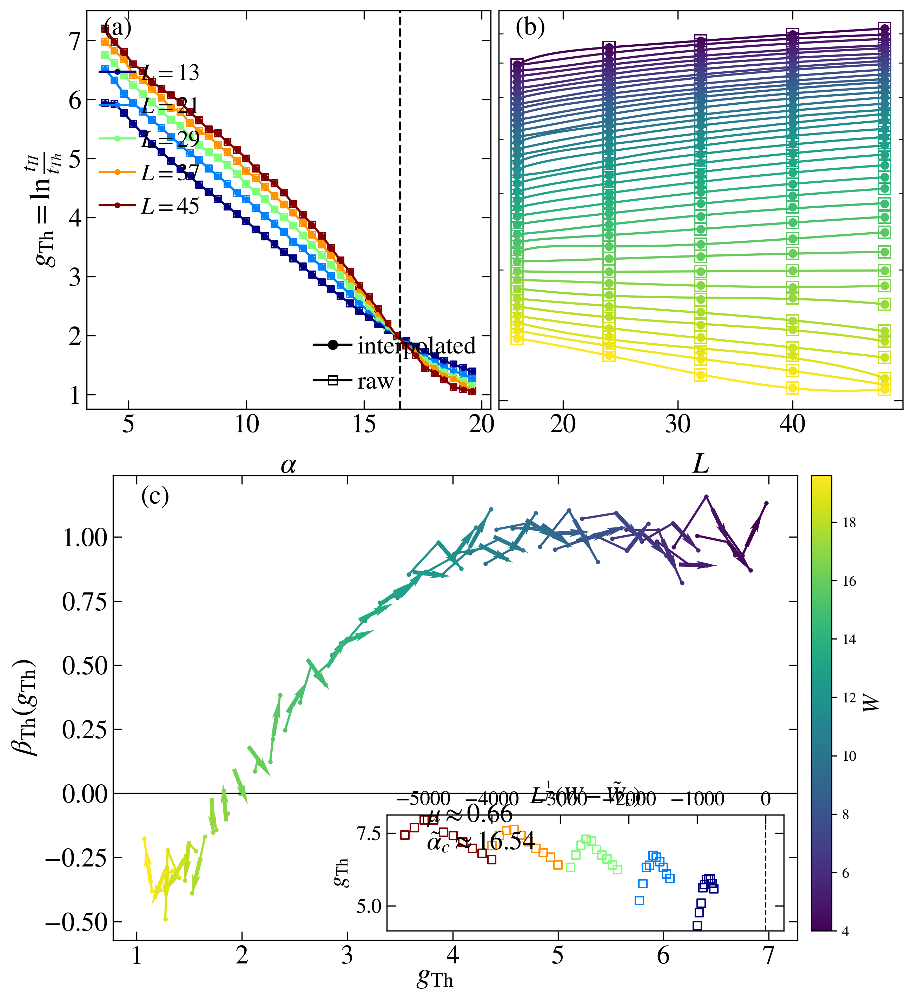

In [73]:
L = 40

fig = plt.figure(figsize=(10,9), dpi = 300)
gs1 = GridSpec(1, 1)
gs1.update(top=0.51, bottom=0.02, left=0.15, right=0.8)
axis = fig.add_subplot(gs1[0,0])

gs2 = GridSpec(1, 2)
gs2.update(top=1, bottom=0.58, wspace=0.02, hspace=0.25)
ax1 = fig.add_subplot(gs2[0])
ax2 = fig.add_subplot(gs2[1])
axis = [axis, ax1, ax2]

inset = axis[0].inset_axes([0.4, 0.02, 0.58, 0.25])

nu=0.66

use_collapse = 0
use_input_crit_point = 0
use_two_parameter_ansatz = 0

interpolate = 0
use_fit = 0

delta=0.05
bin_size = 5
use_inset=0
W_min = 4
W_max = 20
p=1
W_crit = 16.54

def beta0_fun(x, o1 = 0.0, p = 1):
    c_ = 2**(2*p) / (2 * p * np.log(2))
    g_ = 1 + o1 / (p * np.log(2))
    if use_area_collapse: return -(g_ - x) / x * np.log( (g_ - x) / c_ )
    else:                 return (g_ - x) / x


def pade_fun(x, c1, c2, c3, c0):
    # return c1 * np.arctan(c2 * x - d1)
    # return (x**3 + c1*x**2 + c2*x + c3) / (x**3 + d1*x**2 + d2 * x + d3)
    # return (x**2 + c1 * x + c2) / (x**2 + d1 * x + d2)
    # return c1 * np.exp(x/c2)
    return c0 + c1 * x + c2*x**2 + c3*x**3
    # return c0 + c1 * x + c2*x**2 + c3 * x**3

def other_fit(x, c1, c2, c3, c0):
    # return c1 + c2 * np.exp(c3*x)
    return c0 + c1 / x + c2/x**2 + c3 / x**3

folder = f'./thouless time/Anderson/'
os.makedirs(folder, exist_ok=True)
    
ylab = r"$\beta(X)$"

sizes = np.arange(16, 49, 8)

heisenberg_time = []
thouless_time = []
disorder = []
for L in sizes:
    t_Th    = None
    tH      = None
    tH_typ  = None
    name_out = folder + f'Anderson_L={L}.hdf5'
    if exists(name_out):
        with h5py.File(name_out, "r") as file:
            W_vals     = np.array(file.get('disorder'))
            tH         = np.array(file.get('heisenberg time'))
            tH_typ     = np.array(file.get('typical heisenberg time'))
            t_Th       = np.array(file.get('thouless time'))
    else:
        print(name_out)
    
    thouless_time.append(t_Th * tH_typ / tH)
    disorder.append(W_vals)
    heisenberg_time.append(tH_typ)

thouless_time = np.array(thouless_time)
heisenberg_time = np.array(heisenberg_time)
_ydata = np.log(heisenberg_time / thouless_time)

W_dense = W_vals#np.linspace(alfa_vals[0], alfa_vals[-1], alfa_vals.size + (alfa_vals.size-1) * 1)
ydata = np.zeros((sizes.size, W_dense.size));  ydata.fill(np.nan)
for ii, L_total in enumerate(sizes):
    f = splrep(W_vals, _ydata[ii], k=5, s=0)
    ydata[ii] = splev(W_dense, f)
    
    spl = InterpolateSpline(W_vals, _ydata[ii], k=3, s=0)
    ydata[ii] = spl(W_dense)

W_vals = W_dense
# ydata = _ydata
# ydata = np.transpose( np.array(ydata) )
# norm is a class which, when called, can normalize data into the
# [0.0, 1.0] interval.
norm = matplotlib.colors.Normalize(
    vmin=max(W_min, np.min(W_vals) ),
    vmax=min(W_max, np.max(W_vals)) )


# create a ScalarMappable and initialize a data structure
s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
s_m.set_array([])

norm = matplotlib.colors.Normalize(
    vmin=np.min(sizes),
    vmax=np.max(sizes))


# create a ScalarMappable and initialize a data structure
s_m_L = matplotlib.cm.ScalarMappable(cmap='jet', norm=norm)
s_m_L.set_array([])

line1, = axis[1].plot(np.nan, np.nan, color='k', marker='o', label='interpolated')
line2, = axis[1].plot(np.nan, np.nan, color='k', markerfacecolor='None', marker='s', label='raw')

first_legend = fig_help.set_legend(axis[1], fontsize=17, loc='lower right', handles=[line1, line2])

# Add the legends manually to the current Axes.
ax1.add_artist(first_legend)

data_labs = []
xx_data = []
yy_data = []
for ii_L, L in enumerate(sizes):
    indices = np.where(np.logical_and(W_dense >= W_min, W_dense < W_max))[0]
    line, = axis[1].plot(W_dense[indices], ydata[ii_L][indices],  marker='o', markersize=3, color = s_m_L.to_rgba(L), lw=1.5, label=r"$L=%d$"%(L-N))
    data_labs.append(line)
    axis[1].scatter(W_dense[indices], _ydata[ii_L][indices], marker='s', s=20,      color = s_m_L.to_rgba(L), facecolor='None')
    
    
    indices = np.where(np.logical_and(alfa_dense > np.round(alfa_crit - delta, 3), alfa_dense <= np.round(alfa_crit + delta, 3)))[0]
    xx_data.append(W_dense[indices])
    yy_data.append(_ydata[ii_L][indices])
    
const = 0
omega = 0
if use_collapse:
    crit_exponents = []
    crit_W = []
    crit_omega = []
    crit_const = []
    for seed in [5324]:
        if use_two_parameter_ansatz:
            crit_exp, omega, const, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=sizes, crit_fun='const', scaling_ansatz='classic', seed=seed, two_parameter_ansatz=True, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
            crit_exponents.append(crit_exp)
            crit_omega.append(omega)
            crit_const.append(const)
            crit_W.append(crit_pars[0])
        else:
            crit_exp, crit_pars, costfun, status = cost.get_crit_points(x=np.array(xx_data), y=np.array(yy_data), vals=sizes, crit_fun='const', scaling_ansatz='classic', seed=seed, two_parameter_ansatz=False, use_input_criticals=use_input_crit_point, _crit_in=[alfa_crit])
            crit_exponents.append(crit_exp)
            crit_W.append(crit_pars)

    print("----------------------------g0 = ", J)
    print("nu = ", 1/np.array(crit_exponents))
    print("W_c = ", crit_W)
    print("omega = ", crit_omega)
    print("const = ", crit_const)

    if use_two_parameter_ansatz:
        omega = tools.typical(crit_omega)
        const = tools.typical(crit_const)
    crit_exp = np.mean(crit_exponents)
    crit_pars = [np.mean(crits) for crits in np.transpose(crit_W)]

    crit_exp = 1/crit_exp
    print("Cost fun = ", costfun, "mu = ", crit_exp, "omega = ", omega, "const = ", const)
else:
    crit_exp = nu
    crit_pars = [W_crit]
g_crit = 1e6
for ii_L, L in enumerate(sizes):
    xdats = (L)**(1/crit_exp) * (xx_data[ii] - crit_pars[0])
    ydats = yy_data[ii_L] - const * (L)**(-omega)
    inset.scatter( xdats, ydats, marker='s', s=30, color = s_m_L.to_rgba(L), facecolor='None')
    idx = np.argmin(np.abs(xdats))
    if ydats[idx] < g_crit: g_crit = ydats[idx]

# gs = np.linspace(g_crit - 0.2, g_crit + 0.2)
# axis[0].plot(gs, (gs - g_crit) / (crit_exp * g_crit), ls='-', color='gray', lw=2)

axis[1].axvline(x=W_crit, ls='--', c='k')
# axis[2].axvline(x=1/np.sqrt(2),       ls=':', c='k')
# axis.plot(sizes, heisenberg_time[-1], color='k', ls='-.')
fig_help.set_plot_elements(axis[1], ylabel=r"$g_{\rm Th}=\ln\frac{t_H}{t_{Th}}$", xlabel=r"$\alpha$", font_size=18, set_legend=False, xscale='linear', yscale='linear')
second_legend = fig_help.set_legend(axis[1], fontsize=16, loc='upper left', handles=data_labs, anchor=(-0.02, 0.92))


ydata = np.transpose( np.array(ydata) )
_ydata = np.transpose( np.array(_ydata) )

idx_c = 0

envelope_ydata = []
envelope_xdata = []
yax_max = -10
yax_min = 10
for ii_a, W in enumerate(W_vals):
    if W > W_max or W < W_min: continue
    col = s_m.to_rgba(W)
    xx = sizes
    yy = ydata[ii_a]
    
        
    axis[2].plot(xx, yy, marker='o', markersize=5, lw=0.0, ls='--', color=col)
    axis[2].plot(xx, _ydata[ii_a], marker='s', markersize=8, lw=0.0, ls='--', color=col, markerfacecolor='None')
    
    my_fit = pade_fun if W > W_crit else other_fit
    try:
        # xx = xx - N
        pars, pconv, fit_info, msg, _ = fit(my_fit,
                        xdata = xx,
                        ydata = yy,
                        full_output=True, maxfev=10000)
        # print(J, alfa, fit_info['fvec'])
        dense_sizes = np.linspace(xx[0], xx[-1], 10000)
        axis[2].plot(dense_sizes, my_fit(dense_sizes, *pars), lw=1.5, color=col, ls = '-')
    except RuntimeError:
        print(alfa, "Failed")
    
    fig_help.set_plot_elements(axis[2], ylabel="", xlabel=r"$L$", font_size=18, set_legend=False, xscale='linear', yscale='log')

    if interpolate:
        f = splrep(xx, yy, k=3, s=10)
        xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
        yy = splev(xx, f)
    
    if not use_fit:
        beta = diff_central(np.log(xx), (yy))# * xx[1:-1] / yy[1:-1]
        xx_beta = yy[1:-1]
    
        axis[0].plot(xx_beta, beta, marker='o', markersize=0 if interpolate else 2, lw=1.5, color=col)
        
        envelope_ydata = [*envelope_ydata, *beta]
        envelope_xdata = [*envelope_xdata, *xx_beta]
        # envelope_ydata = [*envelope_ydata, (beta[-1])]
        # envelope_xdata = [*envelope_xdata, (xx_beta[-1])]
        
        if min(beta) < yax_min: yax_min = min(beta)
        if max(beta) > yax_max: yax_max = max(beta)
        i1 = xx.size // 2-1
        
        u = xx_beta[i1+1] - xx_beta[i1]
        v = beta[i1+1] - beta[i1]
        pos_x = xx_beta[i1] + u/2
        pos_y = beta[i1] + v/2
        arr_norm = np.sqrt(u**2+v**2)
        
        axis[0].quiver(pos_x, pos_y, u/arr_norm, v/arr_norm, angles="xy", zorder=5, pivot="mid", color=col, linewidth=0, width=0.006, headwidth=2)
        # axis[0].quiver(pos_x, pos_y, u/arr_norm, v/arr_norm, angles="xy", zorder=5, pivot="mid", color=col, lw=0)
    else:
        dense_sizes = np.linspace(xx[0], xx[-1], 50)
        # f = splrep(xx, yy, k=5 if alfa < alfa_crit + 0.08 else 5, s=10)
        # smooth_data = splev(dense_sizes, f)
        # deriv = splev(dense_sizes, f, der=1) * dense_sizes / smooth_data
        smooth_data = my_fit(dense_sizes, *pars)
        deriv = diff_central(np.log(dense_sizes), (smooth_data))
        smooth_data = smooth_data[1:-1]
        axis[0].plot(smooth_data, deriv, lw=1.5, color=col)
        
        if min(deriv) < yax_min: yax_min = min(deriv)
        if max(deriv) > yax_max: yax_max = max(deriv)
        # spline = InterpolateSpline(sizes, ydata[ii_a], k=5, s=0)
        # spl_deriv = spline.derivative(n=1)
        # aaaa = np.linspace(sizes[0], sizes[-1], 100)
        # smooth_data = spline(aaaa)
        # deriv = spl_deriv(aaaa)
        
        envelope_ydata = [*envelope_ydata, *deriv]
        envelope_xdata = [*envelope_xdata, *smooth_data]
        # envelope_ydata = [*envelope_ydata, deriv[-1]]
        # envelope_xdata = [*envelope_xdata, smooth_data[-1]]

        i1 = smooth_data.size // 2
        u = smooth_data[i1+1] - smooth_data[i1]
        v = deriv[i1+1] - deriv[i1]
        pos_x = smooth_data[i1] + u/2
        pos_y = deriv[i1] + v/2
        arr_norm = np.sqrt(u**2+v**2)
    
        axis[0].quiver(pos_x, pos_y, u/arr_norm, v/arr_norm, angles="xy", zorder=5, pivot="mid", color=col, linewidth=0, width=0.006, headwidth=2)
        
# # sorting X and Y data according to increasing X
permut = np.argsort( np.array(envelope_xdata) )
envelope_ydata = np.array(envelope_ydata)[permut]
envelope_xdata = np.array(envelope_xdata)[permut]

size = len(envelope_xdata)
envelope = np.zeros( (size // bin_size) )
xxx = np.zeros( (size // bin_size) )

# Finding maximum Y in each bin of 20 points of interpolated data
for k in range(envelope.size):
    idx_r = (k+1) * bin_size if k < envelope.size-1 else -1
    idx = np.argmax(envelope_ydata[k * bin_size : idx_r])
    envelope[k] = envelope_ydata[k * bin_size : idx_r][idx]
    xxx[k]      = envelope_xdata[k * bin_size : idx_r][idx]
# xxx = envelope_xdata
# envelope = envelope_ydata
# axis[0].scatter(xxx, envelope, s=30, color='k')

axis[0].axhline(y=0, ls='-', c='k', lw=1)
inset.axvline(x=0, ls='--', c='k', lw=1)

gs = np.linspace(g_crit - 0.25, g_crit + 0.25, 100)
# axis[0].plot(gs, (gs - g_crit) / (crit_exp * g_crit), ls='-', color='gray')

xlab = r"$g_{\rm Th}$"
ylab = r"${\beta}_{\rm Th}(g_{\rm Th})$"
fig_help.set_plot_elements(axis[0], xlabel=xlab, ylabel=ylab, font_size=18, set_legend=False, xscale='linear')
fig_help.set_legend(axis[0], loc = 'upper right', fontsize=14, anchor=(1.0, 0.81))

fig_help.set_plot_elements(inset, xlabel=r"$L^\frac{1}{\mu}(W-\tilde{W}_c)$", ylabel=r"$g_{\rm Th}$", font_size=14, set_legend=False, xscale='linear')
inset.xaxis.set_label_position("top")
inset.xaxis.set_label_coords(.5, 1.1)
inset.xaxis.tick_top()

axis[0].xaxis.set_label_coords(.47, -0.05)
# ax1.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
# ax1.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
ax2.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: ""))
ax2.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: ""))
# fig.subplots_adjust(right=0.9)
# cbar_ax = fig.add_axes([0.92, 0.15, 0.03, 0.7])
# # fig.colorbar(im, cax=cbar_ax)

# fig.subplots_adjust(wspace = 0.02, hspace=0.2)

# cbaxes = inset_axes(axis[0], width="70%", height="5%", loc=4)
cbaxes = axis[0].inset_axes([1.02, 0.02, 0.03, 0.98])
cbar = fig.colorbar(s_m, cax = cbaxes, orientation='vertical')

cbar.set_label(r"$W$", fontsize=16)
# cbar.ax.tick_params(labelsize=15)

axis[0].annotate(r"(c)", fontsize=18, xy=(0.04, 0.94), xycoords='axes fraction')
axis[1].annotate(r"(a)", fontsize=18, xy=(0.04, 0.94), xycoords='axes fraction')
axis[2].annotate(r"(b)", fontsize=18, xy=(0.04, 0.94), xycoords='axes fraction')
inset.annotate(r"$\mu\approx%.2f$"%(crit_exp) + f"\n" + r"$\tilde{\alpha}_c\approx%.2f$"%(crit_pars[0]), fontsize=18, xy=(0.1, 0.7), xycoords='axes fraction')

# fig.savefig("plots_beta/FigS4.pdf", bbox_inches = 'tight', pad_inches=0.02)
# fig.savefig("plots_beta/FigS4.png", bbox_inches = 'tight', pad_inches=0.02)


# NON-STANDARD

[0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75 0.8  0.85 0.9  0.95 1.   1.05
 1.1  1.15 1.2  1.25 1.3 ]


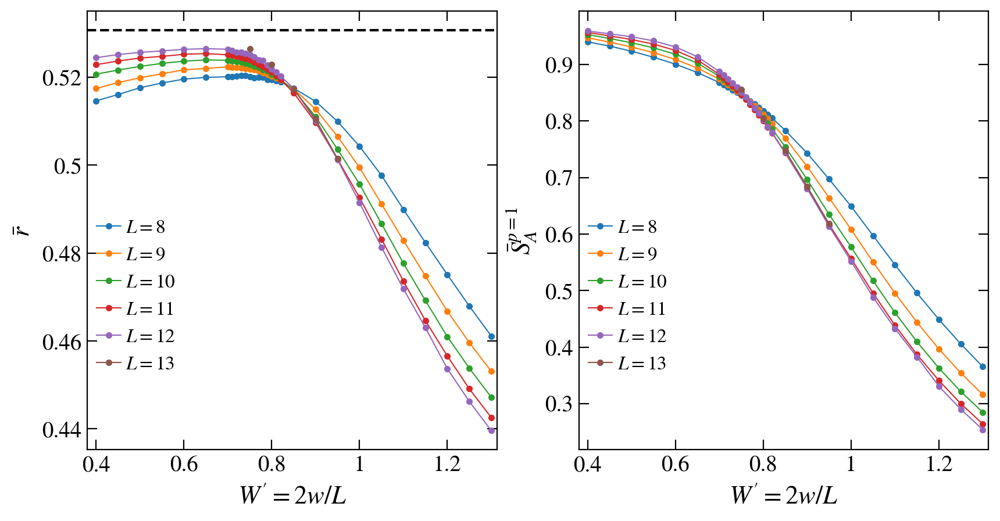

In [732]:
L_total=15
J=1.0
alfa=1.0
h=0.0
w=2.0
zeta=0.0
N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 1

w_vals = np.linspace(0.4, 1.3, 19)
print(w_vals)

sub_sizes = np.arange(0, L+1)
fig, axis = plt.subplots( nrows=1, ncols=2, figsize=(10,5), dpi = 200, sharex=True)

sizes = np.arange(11, 17, 1)

rescale = 0

overwrite = 0

nu = 0.5
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

folder_base = f'./collected data_scaled disorder/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
xlab = r"$W'=2w/L$"

for idx1 in range(2):
    
    disorder = []
    ydata = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total // 2
        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,alfa=%g.hdf5"%(L, N, J, gamma, alfa)

        if not overwrite and exists(name_out):
            with h5py.File(name_out, "r") as file:
                w_vals       = np.array(file.get('scaled disorder'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
        else:
            print(name_out)
        disorder.append(w_vals)
        ydata.append(gap_ratio if idx1 == 0 else entropy[L_total-2] / page(2, L_total-2)) 
        
    # par, crit_pars, costfun, status = cost.get_crit_points(x=np.array(disorder), y=np.array(gaps), vals=sizes - N, crit_fun='free', scaling_ansatz='classic', seed=412438923)
    # print(crit_pars)
    
    # rescale_fun = cost.resc_functions_dict['classic']
    # critical_fun = cost.crit_functions_dict['free']
    # xlab = cost.scale_ansatz_label['classic']('W')

    for ii, L in enumerate(sizes - N):
        axis[idx1].plot(disorder[ii], ydata[ii], marker='o', markersize=3, lw=0.75, label=r"$L=%d$"%L)
        # axis[idx1].plot(rescale_fun(disorder[ii], sizes, ii, critical_fun, par, *crit_pars), gaps[ii], ls='--', marker='o', label=r"$L=%d$"%(L))

    axis[idx1].set_xlim(0.95*min(np.array(disorder).flatten()), 1.01*max(np.array(disorder).flatten()))
    
axis[0].set_ylim(None, 0.535)
# axis[idx1].axhline(y=0.3863, ls='--', color='black')
axis[0].axhline(y=0.5307, ls='--', color='black')


fig_help.set_plot_elements(axis[0], ylabel=r"$\bar{r}$", xlabel=xlab, font_size=14, set_legend=False)
fig_help.set_legend(axis[0], loc = 'center left', fontsize=12, anchor=(-0.02, 0.35))
fig_help.set_plot_elements(axis[1], ylabel=r"$\bar{S}_A^{p=1}$", xlabel=xlab, font_size=14, set_legend=False)
fig_help.set_legend(axis[1], loc = 'center left', fontsize=12, anchor=(-0.02, 0.35))

if config_disorder:
    for ax in axis.flatten():
        ax.set_xscale('log')

for aa in [axis]:
    for ax in np.array(aa).flatten():
        ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

# axis[0].annotate(r"(a) $N=3$", fontsize=16, xy=(0.03, 0.08), xycoords='axes fraction')
# axis[1].annotate(r"(b) $N=5$", fontsize=16, xy=(0.03, 0.08), xycoords='axes fraction')
# axis[0].set_title(r"$N=3, \gamma=%.1f$"%(gamma), fontsize=16)
# axis[1].set_title(r"$N=5, \gamma=%.1f$"%(gamma), fontsize=16)

fig.subplots_adjust(wspace = 0.2, hspace=0.2)

[0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75 0.8  0.85 0.9  0.95 1.   1.05
 1.1  1.15 1.2  1.25 1.3 ]
[0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.71 0.72 0.73 0.74 0.75 0.76 0.77
 0.78 0.79 0.8  0.81 0.82 0.85 0.9  0.95 1.   1.05 1.1  1.15 1.2  1.25
 1.3  1.35]


ValueError: array must not contain infs or NaNs

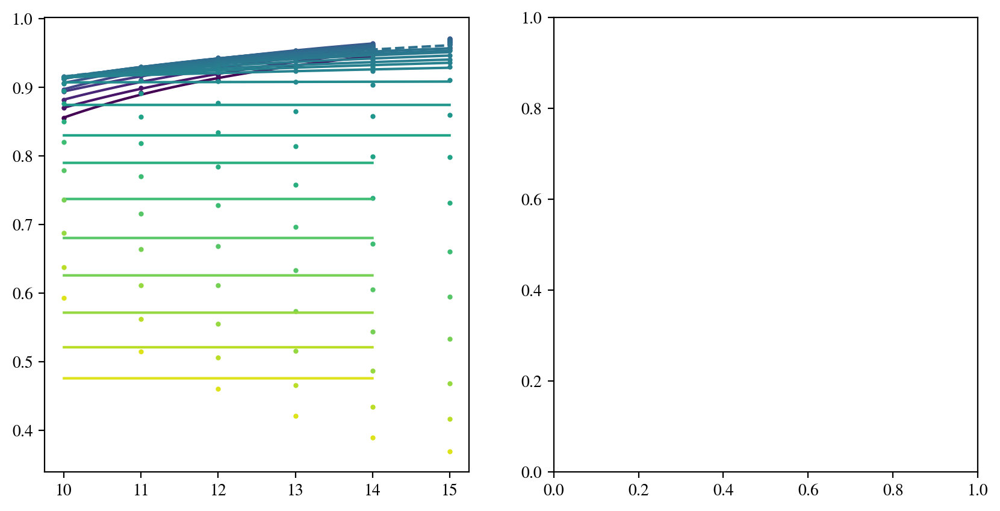

In [629]:
L_total=15
J=1.0
alfa=1.0
h=0.0
w=0.0
zeta=0.0

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 1

w_vals = np.linspace(0.4, 1.3, 19)
print(w_vals)

sub_sizes = np.arange(0, L+1)
fig, axis = plt.subplots( nrows=1, ncols=2, figsize=(10,5), dpi = 200)

sizes = np.arange(10, 16, 1)

interpolate = 0

p = 1       # number of last spins

nu = 0.25
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

folder_base = f'./collected data_scaled disorder/' if scaled_disorder else f'./collected data/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
xlab = r"$L+N$"

def pade_fun(x, c1, d1):
    return (x + c1) / (x + d1)

def other_fit(x, c1, c2, c3):
    return c1 / x**2 + c2 / x**3 + c3

for idx1 in range(2):
    
    interaction = []
    ydata = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - p

        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,alfa=%g.hdf5"%(L, N, J, gamma, alfa)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                w_vals       = np.array(file.get('scaled disorder'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
        else:
            print(name_out)
            
        entropy = entropy[LA] / page(LA, L_total-LA)
        interaction.append(w_vals)
        ydata.append((gap_ratio - 0.3863) / (0.5307 - 0.3863) if idx1 == 0 else entropy)

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    norm = matplotlib.colors.Normalize(
        vmin=np.min(w_vals),
        vmax=np.max(w_vals))

    # choose a colormap
    # c_m = matplotlib.cm.cool

    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )
    print(w_vals)
    beta_0 = np.zeros( (w_vals.size) )
    new_xx = np.zeros( (w_vals.size) )
    
    for ii_a, w in enumerate(w_vals):
        # idx_a = list(alfa_vals).index(alfa)
        axis[idx1].plot(sizes, ydata[ii_a], marker='o', markersize=2, lw=0, color=s_m.to_rgba(w), ls = '--' if w == 0.75 else '-')
        
        my_fit = pade_fun if w > 0.75 else other_fit
        try:

            xx = sizes[:-1] if w < 0.75 or w >= 1 else sizes
            yy = ydata[ii_a][:-1] if w < 0.75 or w >= 1 else ydata[ii_a]
            # print(w, xx, yy)
            pars, pconv = fit(my_fit,
                            xdata = xx,
                            ydata = yy)
            # print(alfa, np.diag(pconv)**2)
            aaaa = np.linspace(xx[0], xx[-1], 10000)
            axis[idx1].plot(aaaa, my_fit(aaaa, *pars), lw=1.5, color=s_m.to_rgba(w), ls = '--' if w == 0.75 else '-')
        except RuntimeError:
            print(alfa)
        
# axis[0].axhline(y=0.3863, ls='--', color='black')
# axis[0].axhline(y=0.5307, ls='--', color='black')
    
    # axis[idx1].set_xlim(7.5, 16.5)
    axis[idx1].set_ylim(0, 1)
cbar = fig.colorbar(s_m)
cbar.set_label(r"$W'=2w/L$", fontsize=16)



fig_help.set_plot_elements(axis[0], ylabel=r"$\bar{r}$", xlabel=xlab, font_size=14, set_legend=False)
fig_help.set_legend(axis[0], loc = 'center left', fontsize=12, anchor=(-0.02, 0.35))
fig_help.set_plot_elements(axis[1], ylabel=r"$\bar{S}_A^{p=%d}$"%p, xlabel=xlab, font_size=14, set_legend=False)
fig_help.set_legend(axis[1], loc = 'center left', fontsize=12, anchor=(-0.02, 0.35))

for aa in [axis]:
    for ax in np.array(aa).flatten():
        ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

# axis[0].annotate(r"(a) $r$", fontsize=16, xy=(0.03, 0.08), xycoords='axes fraction')
# axis[1].annotate(r"(b) $\bar{S}^{p=1}$", fontsize=16, xy=(0.03, 0.08), xycoords='axes fraction')
# axis[0].set_title(r"$N=3, \gamma=%.1f$"%(gamma), fontsize=16)
# axis[1].set_title(r"$N=5, \gamma=%.1f$"%(gamma), fontsize=16)

fig.subplots_adjust(wspace = 0.2, hspace=0.2)

No handles with labels found to put in legend.
No handles with labels found to put in legend.


[0.4  0.45 0.5  0.55 0.6  0.65 0.7  0.75 0.8  0.85 0.9  0.95 1.   1.05
 1.1  1.15 1.2  1.25 1.3 ]


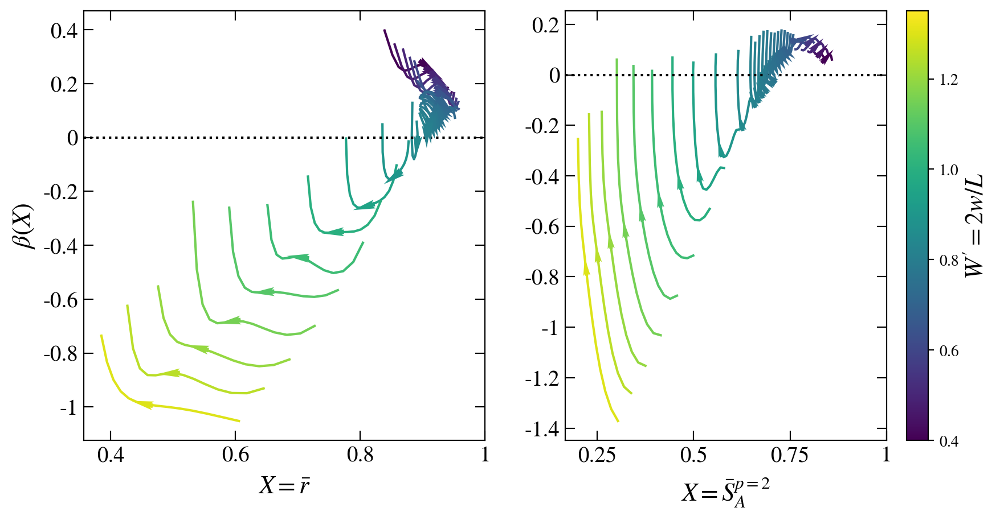

In [76]:
L_total=15
J=1.0
alfa=1.0
h=0.0
w=2.0
zeta=0.0

N=3
gamma=1.0
ini_ave=0
L = L_total - N
scaled_disorder = 1

w_vals = np.linspace(0.4, 1.3, 19)
print(w_vals)

sub_sizes = np.arange(0, L+1)
fig, axis = plt.subplots( nrows=1, ncols=2, figsize=(10,5), dpi = 200)

sizes = np.arange(10, 16, 1)

rescale = 0
use_fit = 0
w_crit = 0.75
p=1

interpolate = 1
use_fit = 0

nu = 1.0
frac = lambda dim: int(dim * nu) if nu <= 1.0 else nu

folder_base = f'./collected data_scaled disorder/'
folder = folder_base + base_dir[3:] + f"nu={nu}/"
os.makedirs(folder_base, exist_ok=True)
os.makedirs(folder, exist_ok=True)
    
ylab = r"$\beta(X)$"

for idx1 in range(2):
    
    disorder = []
    ydata = []
    for L_total in sizes:
        sub_sizes = np.arange(0, L_total+1)
        L = L_total - N
        LA = L_total - p
        name_out = folder + "_L=%g,N=%g,J=%g,gamma=%g,alfa=%g.hdf5"%(L, N, J, gamma, alfa)

        if exists(name_out):
            with h5py.File(name_out, "r") as file:
                w_vals       = np.array(file.get('scaled disorder'))
                gap_ratio    = np.array(file.get('gap_ratio'))
                entropy      = np.array(file.get('entropy'))
                entropy_site = np.array(file.get('single_site_entropy'))
        else:
            print(name_out)

        disorder.append(w_vals)
        ydata.append((gap_ratio - 0.3863) / (0.5307 - 0.3863) if idx1 == 0 else entropy[LA] / (p * np.log(2)))#page(LA, L_total-LA))

    # norm is a class which, when called, can normalize data into the
    # [0.0, 1.0] interval.
    norm = matplotlib.colors.Normalize(
        vmin=np.min(w_vals),
        vmax=np.max(w_vals))

    # create a ScalarMappable and initialize a data structure
    s_m = matplotlib.cm.ScalarMappable(cmap='viridis', norm=norm)
    s_m.set_array([])

    ydata = np.transpose( np.array(ydata) )

    beta_0 = np.zeros( (w_vals.size) )
    new_xx = np.zeros( (w_vals.size) )
    
    idx_c = 0
    for ii_a, w in enumerate(w_vals):
        w = np.round(w, 6)
        if w == w_crit: idx_c = ii_a
        
        col = s_m.to_rgba(w)
        
        xx = sizes - N
        yy = ydata[ii_a]
        if interpolate:
            f = splrep(xx, yy, k=5 if alfa < alfa_crit + 0.02 else 5, s=1)
            xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 2)
            yy = splev(xx, f)
            
        if not use_fit:
            # if use_area_collapse: xx = np.log(xx)
            
            # f = splrep(xx, yy, k=3 if alfa < alfa_crit + 0.08 else 5, s=3)
            # xx = np.linspace(xx[0], xx[-1], xx.size + (xx.size-1) * 4)
            # yy = splev(xx, f)
            # beta = splev(xx, f, der=1) * xx / yy
            # xx_beta = yy
            
            beta = diff_central(xx, (yy)) * xx[1:-1] / yy[1:-1]
            xx_beta = yy[1:-1]
            
            envelope_ydata.append(beta[-1])
            envelope_xdata.append(xx_beta[-1])
            
            axis[idx1].plot(xx_beta, beta, marker='o', markersize=0, lw=1.5, color=col)
            
            if min(beta) < yax_min: yax_min = min(beta)
            if max(beta) > yax_max: yax_max = max(beta)
            i1 = xx_beta.size // 2
            u = xx_beta[i1+1] - xx_beta[i1]
            v = beta[i1+1] - beta[i1]
            pos_x = xx_beta[i1] + u/2
            pos_y = beta[i1] + v/2
            norm = np.sqrt(u**2+v**2)

            axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=5, pivot="mid", color=col, linewidth=0, width=0.02, headwidth=2)
            
        else:

            my_fit = pade_fun if alfa > alfa_crit else other_fit
            pars, pconv = fit(my_fit,
                                xdata = xx,
                                ydata = yy,
                                maxfev = 10000
                                )
            xL = np.linspace(xx[0], xx[-1], 100)
            smooth_data = my_fit(xL, *pars)
            deriv = diff_central(np.log(xL), np.log(smooth_data))
            smooth_data = smooth_data[1:-1]
            
            axis[idx1].plot(smooth_data, deriv, lw=1.5, color=col, zorder=-2)
            
            if min(deriv) < yax_min: yax_min = min(deriv)
            if max(deriv) > yax_max: yax_max = max(deriv)
            
            envelope_ydata = [*envelope_ydata, *(deriv)]
            envelope_xdata = [*envelope_xdata, *(smooth_data)]
            # envelope_ydata = [*envelope_ydata, deriv[-1]]
            # envelope_xdata = [*envelope_xdata, smooth_data[-1]]

            i1 = smooth_data.size // 2
            u = smooth_data[i1+1] - smooth_data[i1]
            v = deriv[i1+1] - deriv[i1]
            pos_x = smooth_data[i1] + u/2
            pos_y = deriv[i1] + v/2
            norm = np.sqrt(u**2+v**2)
        
            axis[idx1].quiver(pos_x, pos_y, u/norm, v/norm, angles="xy", zorder=-1, pivot="mid", 
                               linewidth=0, width=0.02, headwidth=3, color=col, lw=0)
            
        
    # def other_fit(x, c1, c2, c3, c4):
    #     return c1 * (x-1)**4 + c2 * (x-1)**3 + c3 * (x-1)**2 + c4 * (x-1)

    # pars, pconv = fit(other_fit,
    #                     xdata = new_xx,
    #                     ydata = beta_0)
    
    # # axis[idx1].plot(new_xx, beta_0, lw=2, color='k', ls='--')
    # aaaa = np.linspace(new_xx[0], 1, 1000)
    # axis[idx1].plot(aaaa, other_fit(aaaa, *pars), lw=2, color='k', ls='--')
    # Sc = 0.9 * ydata[idx_c][-1]
    # nu = 1/0.63
    # axis[idx1].plot(aaaa[450:550], (aaaa[450:550] - Sc) / (nu * Sc), lw=2, color='gray', ls='-')

    axis[idx1].set_xlim(None, 1)
    axis[idx1].axhline(y=0, ls=':', c='k')
cbar = fig.colorbar(s_m)
cbar.set_label(r"$W'=2w/L$", fontsize=16)



fig_help.set_plot_elements(axis[0], xlabel=r"$X=\bar{r}$", ylabel=ylab, font_size=14, set_legend=False)
fig_help.set_legend(axis[0], loc = 'center left', fontsize=12, anchor=(-0.02, 0.35))
fig_help.set_plot_elements(axis[1], xlabel=r"$X=\bar{S}_A^{p=2}$", ylabel="", font_size=14, set_legend=False)
fig_help.set_legend(axis[1], loc = 'center left', fontsize=12, anchor=(-0.02, 0.35))

for aa in [axis]:
    for ax in np.array(aa).flatten():
        ax.xaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.xaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_minor_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))
        ax.yaxis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda x, pos: "%g"%x))

# axis[0].annotate(r"(a) $r$", fontsize=16, xy=(0.03, 0.08), xycoords='axes fraction')
# axis[1].annotate(r"(b) $\bar{S}^{p=1}$", fontsize=16, xy=(0.03, 0.08), xycoords='axes fraction')
# axis[0].set_title(r"$N=3, \gamma=%.1f$"%(gamma), fontsize=16)
# axis[1].set_title(r"$N=5, \gamma=%.1f$"%(gamma), fontsize=16)

fig.subplots_adjust(wspace = 0.2, hspace=0.2)